In [2]:
import os 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

def case_preprocessing():
    dataset = list()
    only_train_dataset = list()
    df = pd.DataFrame()
    train_df = pd.DataFrame()   # 새로운 Col 만들기 
    dir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection'
    pastDir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection\\Past_data'
    
    # hour, wind(바람의 x축,y축 방향 각각 제곱합의 루트), water(해류의 x축,y축 방향 각각 제곱합의 루트)
    for k in range(1,16):
        only_train_dataset.append(pd.read_csv(os.path.join(pastDir_path ,(str(k)+'.csv'))))
                                  
    # 2016 (case 7) (동해)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_003.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_005.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_010.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_011.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_015.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_016.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2016_case_040.csv')))

    # 2018(case 12) (서해)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_005.csv')))
    # dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_008.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_017.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_027.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_032.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_034.csv')))
    # dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_045.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_047.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_082.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_083.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_090.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_095.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2018_case_097.csv')))

    # 2019(case 4) (남해)
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_000.csv')))
#     dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_001.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_006.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_007.csv')))
    dataset.append(pd.read_csv(os.path.join(dir_path,'2019_case_005.csv')))
    
    # 과거데이터 전처리 
    for i in range(len(only_train_dataset)):
        # 동해 서해 남해 
        if i <8:
            only_train_dataset[i]['E'] = 0
            only_train_dataset[i]['W'] = 0
            only_train_dataset[i]['S'] = 1
        else:
            only_train_dataset[i]['E'] = 0
            only_train_dataset[i]['W'] = 1
            only_train_dataset[i]['S'] = 0
        
        # 시간처리를 위해 time의 object type -> datetime64로 변경
        only_train_dataset[i]['time'] = pd.to_datetime(only_train_dataset[i]['time'],format = '%Y-%m-%d %H:%M', errors = 'raise')
        # hour열 생성
        only_train_dataset[i]['hour'] = only_train_dataset[i]['time'].dt.hour
        # wind 열 생성
        only_train_dataset[i]['wind'] = (only_train_dataset[i]['wind_x']**2 + only_train_dataset[i]['wind_y']**2)**(1/2)
        # water열 생성
        only_train_dataset[i]['water'] = (only_train_dataset[i]['water_velocity_x']**2 + only_train_dataset[i]['water_velocity_y']**2)**(1/2)
        # diff_lon열 생성
        only_train_dataset[i]['diff_lon'] = only_train_dataset[i]['obs_x1_lon'].diff() 
        only_train_dataset[i]['diff_lon'][0] = 0
        # diff_lat열 생성
        only_train_dataset[i]['diff_lat'] = only_train_dataset[i]['obs_x1_lat'].diff()
        only_train_dataset[i]['diff_lat'][0] = 0
        # 'diff_wind_x'열 생성
        only_train_dataset[i]['diff_wind_x'] = only_train_dataset[i]['wind_x'].diff() 
        only_train_dataset[i]['diff_wind_x'][0] = 0
        # 'diff_wind_y'열 생성
        only_train_dataset[i]['diff_wind_y'] = only_train_dataset[i]['wind_y'].diff()
        only_train_dataset[i]['diff_wind_y'][0] = 0
        # 'diff_wind_x'열 생성
        only_train_dataset[i]['diff_water_velocity_x'] = only_train_dataset[i]['water_velocity_x'].diff() 
        only_train_dataset[i]['diff_water_velocity_x'][0] = 0
        # 'diff_wind_y'열 생성
        only_train_dataset[i]['diff_water_velocity_y'] = only_train_dataset[i]['water_velocity_y'].diff() 
        only_train_dataset[i]['diff_water_velocity_y'][0] = 0
        # 초기 이동 고려 (원-핫 인코딩)
        only_train_dataset[i]['initial'] = 0
        only_train_dataset[i]['not_initial'] = 0
        for j in range(0,10):
            only_train_dataset[i]['not_initial'][j] = 0
            only_train_dataset[i]['initial'][j] = 1
        
        # model_x2_lon
        # diff_lon열 생성
        only_train_dataset[i]['diff_mod_lon'] = only_train_dataset[i]['model_x2_lon'].diff() 
        only_train_dataset[i]['diff_mod_lon'][0] = 0
        # diff_lat열 생성
        only_train_dataset[i]['diff_mod_lat'] = only_train_dataset[i]['model_x2_lat'].diff()
        only_train_dataset[i]['diff_mod_lat'][0] = 0
        
        only_train_dataset[i]['water_velocity_x_10'] = only_train_dataset[i]['water_velocity_x'] * 10
        only_train_dataset[i]['water_velocity_y_10'] = only_train_dataset[i]['water_velocity_y'] * 10
        
        # diff열 생성
        only_train_dataset[i]['diff'] = (only_train_dataset[i]['diff_lon']**2 + only_train_dataset[i]['diff_lat']**2)**(1/2)
        
        # Null 값 제외
        
        only_train_dataset[i] = only_train_dataset[i].dropna()
        only_train_dataset[i] = only_train_dataset[i].reset_index(drop = True)
        
        
        # 초기좌표 (해역 나누기)
        only_train_dataset[i]['start_lon'] = only_train_dataset[i]['obs_x1_lon'][0]
        only_train_dataset[i]['start_lat'] = only_train_dataset[i]['obs_x1_lat'][0]
        
        # Smoothing (wind_x_ma, wind_y_ma, water_velocity_x_ma, water_velocity_y_ma 인자 추가) 
        only_train_dataset[i]['wind_x_ma'] = 0
        only_train_dataset[i]['wind_y_ma'] = 0
        only_train_dataset[i]['water_velocity_x_ma'] = 0
        only_train_dataset[i]['water_velocity_y_ma'] = 0 
        for j in range(1,len(only_train_dataset[i])-1):
            only_train_dataset[i]['wind_x_ma'][j] = (only_train_dataset[i]['wind_x'][j-1] + only_train_dataset[i]['wind_x'][j] + only_train_dataset[i]['wind_x'][j+1])/3
            only_train_dataset[i]['wind_y_ma'][j] = (only_train_dataset[i]['wind_y'][j-1] + only_train_dataset[i]['wind_y'][j] + only_train_dataset[i]['wind_y'][j+1])/3
            only_train_dataset[i]['water_velocity_x_ma'][j] = (only_train_dataset[i]['water_velocity_x'][j-1] + only_train_dataset[i]['water_velocity_x'][j] + only_train_dataset[i]['water_velocity_x'][j+1])/3
            only_train_dataset[i]['water_velocity_y_ma'][j] = (only_train_dataset[i]['water_velocity_y'][j-1] + only_train_dataset[i]['water_velocity_y'][j] + only_train_dataset[i]['water_velocity_y'][j+1])/3    
        df = only_train_dataset[i]
        indices = df.query('wind_x < -90 or wind_y < -90 or water_velocity_x < -90 or water_velocity_y < -90').index
        df.drop(indices, inplace=True)
        df.reset_index(drop = True, inplace=True)
        only_train_dataset[i] = df 
        
     # 기상청 데이터 전처리 
    for i in range(len(dataset)):
        # 동해 서해 남해 
        if i <7:
            dataset[i]['E'] = 1
            dataset[i]['W'] = 0
            dataset[i]['S'] = 0
        elif i >= 7 and i<18:
            dataset[i]['E'] = 0
            dataset[i]['W'] = 1
            dataset[i]['S'] = 0
        else:
            dataset[i]['E'] = 0
            dataset[i]['W'] = 0
            dataset[i]['S'] = 1
        
        # 시간처리를 위해 time의 object type -> datetime64로 변경
        dataset[i]['time'] = pd.to_datetime(dataset[i]['time'],format = '%Y-%m-%d %H:%M', errors = 'raise')
        # hour열 생성
        dataset[i]['hour'] = dataset[i]['time'].dt.hour
        # wind 열 생성
        dataset[i]['wind'] = (dataset[i]['wind_x']**2 + dataset[i]['wind_y']**2)**(1/2)
        # water열 생성
        dataset[i]['water'] = (dataset[i]['water_velocity_x']**2 + dataset[i]['water_velocity_y']**2)**(1/2)
        # diff_lon열 생성
        dataset[i]['diff_lon'] = dataset[i]['obs_x1_lon'].diff() 
        dataset[i]['diff_lon'][0] = 0
        # diff_lat열 생성
        dataset[i]['diff_lat'] = dataset[i]['obs_x1_lat'].diff()
        dataset[i]['diff_lat'][0] = 0
        # 'diff_wind_x'열 생성
        dataset[i]['diff_wind_x'] = dataset[i]['wind_x'].diff() 
        dataset[i]['diff_wind_x'][0] = 0
        # 'diff_wind_y'열 생성
        dataset[i]['diff_wind_y'] = dataset[i]['wind_y'].diff()
        dataset[i]['diff_wind_y'][0] = 0
        # 'diff_wind_x'열 생성
        dataset[i]['diff_water_velocity_x'] = dataset[i]['water_velocity_x'].diff() 
        dataset[i]['diff_water_velocity_x'][0] = 0
        # 'diff_wind_y'열 생성
        dataset[i]['diff_water_velocity_y'] = dataset[i]['water_velocity_y'].diff() 
        dataset[i]['diff_water_velocity_y'][0] = 0
        
        # 초기 이동 고려 (원-핫 인코딩)
        dataset[i]['initial'] = 0
        dataset[i]['not_initial'] = 1
        for j in range(0,30):
            dataset[i]['not_initial'][j] = 0
            dataset[i]['initial'][j] = 1
        
        # diff열 생성
        dataset[i]['diff'] = (dataset[i]['diff_lon']**2 + dataset[i]['diff_lat']**2)**(1/2)
        
        dataset[i]['diff_mod_lon'] = dataset[i]['model_x2_lon'].diff() 
        dataset[i]['diff_mod_lon'][0] = 0
        
        # diff_lat열 생성
        dataset[i]['diff_mod_lat'] = dataset[i]['model_x2_lat'].diff()
        dataset[i]['diff_mod_lat'][0] = 0
        
        # mod diff 
        dataset[i]['diff_mod'] = (dataset[i]['diff_mod_lon']**2 + dataset[i]['diff_mod_lat']**2)**(1/2)
        
        # Null 값 제외
        dataset[i] = dataset[i].dropna()
        dataset[i] = dataset[i].reset_index(drop = True)
        
        # 초기좌표 (해역 나누기)
        dataset[i]['start_lon'] = dataset[i]['obs_x1_lon'][0]
        dataset[i]['start_lat'] = dataset[i]['obs_x1_lat'][0]
        
        # Smoothing (wind_x_ma, wind_y_ma, water_velocity_x_ma, water_velocity_y_ma 인자 추가) 
        dataset[i]['wind_x_ma'] = 0
        dataset[i]['wind_y_ma'] = 0
        dataset[i]['water_velocity_x_ma'] = 0
        dataset[i]['water_velocity_y_ma'] = 0 
        for j in range(1,len(dataset[i])-1):
            dataset[i]['wind_x_ma'][j] = (dataset[i]['wind_x'][j-1] + dataset[i]['wind_x'][j] + dataset[i]['wind_x'][j+1])/3
            dataset[i]['wind_y_ma'][j] = (dataset[i]['wind_y'][j-1] + dataset[i]['wind_y'][j] + dataset[i]['wind_y'][j+1])/3
            dataset[i]['water_velocity_x_ma'][j] = (dataset[i]['water_velocity_x'][j-1] + dataset[i]['water_velocity_x'][j] + dataset[i]['water_velocity_x'][j+1])/3
            dataset[i]['water_velocity_y_ma'][j] = (dataset[i]['water_velocity_y'][j-1] + dataset[i]['water_velocity_y'][j] + dataset[i]['water_velocity_y'][j+1])/3
        
        # 삭제 전 원본 df
        df = pd.concat([df,dataset[i]],ignore_index = True)
        # 불필요열 삭제 
        pre_df = dataset[i].drop(columns = ['time','obs_x1_lon','obs_x1_lat','model_x2_lon','model_x2_lat'])  
        train_df = pd.concat([train_df, pre_df[1:-1]],ignore_index = True)
        
    df = df.reset_index(drop = True)
    train_df = train_df.reset_index(drop = True)
    return dataset, df, train_df, only_train_dataset

def drift_mae(y, predict_y):
    mae = mean_absolute_error(y, predict_y)
    return mae


def n2_mae(y, predict_y):
    n = y.shape[0]
    error_sum = 0
    
    for i in range(n):
        error_sum += abs((y[i][0] - predict_y[i][0])) + abs(( y[i][1] - predict_y[i][1]))
    
    mae = error_sum/(2*n)   
    
    return mae


def paper_mae(y, predict_y): # 논문  
    n = y.shape[0]
    error_sum = 0
    
    for i in range(n):
        error_sum += abs(y[i][0] - predict_y[i][0]) + abs(y[i][1] - predict_y[i][1])
    
    mae = error_sum/n    
    return mae

def NCLS_score(y, predict_y): # 1시간 
        # dl_i 구하기 
        dl_list, dl_sum, o_sum = list(), list(), 0
        n = y.shape[0]
        for i in range(1, n):
            # 위도 1도는 111.321, 경도 1도는 87.74km, 단위 km
            d_lon = y[i][0] - y[i-1][0]  
            d_lat = y[i][1] - y[i-1][1]
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            dl_list.append(point_distance)
            
        for i in range(len(dl_list)):
            temp = 0
            for j in range(i+1):
                temp += dl_list[j]
            dl_sum.append(temp)

        for i in range(len(dl_sum)):
            o_sum += dl_sum[i]
        
        # 예측모델의 d_i 구하기
        d_list = list()
        for i in range(1,n):
            # 위도 1도는 111.321 # 경도 1도는 55.802km
            d_lon = y[i][0] - predict_y[i][0]  
            d_lat = y[i][1] - predict_y[i][1]
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            d_list.append(point_distance)

        # s 구하기
        d_sum, s, ss_score = 0, 0, 0

        for i in range(len(d_list)):
            d_sum += d_list[i]

        s = d_sum/o_sum
        
        if s > 1:
                ss_score = 0
        else:
            ss_score = 1-s
        
        return ss_score

def drift_trajection_show(index, y_pred): 
    %matplotlib inline

    # 실제 위치
    lon = dataset[index]['obs_x1_lon']
    lon = np.array(lon)
    lat = dataset[index]['obs_x1_lat']
    lat = np.array(lat)
    
    # baseline
    baseline_lon = dataset[index]['model_x2_lon']
    baseline_lon = np.array(baseline_lon)
    baseline_lat = dataset[index]['model_x2_lat']
    baseline_lat = np.array(baseline_lat)

    # 예측값 
    first_lon = lon[0]
    first_lat = lat[0]
    lon_pred = np.zeros((y_pred.shape[0]+1,))
    lat_pred = np.zeros((y_pred.shape[0]+1,))
    lon_pred[0] = first_lon 
    lat_pred[0] = first_lat
    
    for i in range(1, lon_pred.shape[0]):
        lon_pred[i] = lon_pred[i-1] + y_pred[i-1][0]
        lat_pred[i] = lat_pred[i-1] + y_pred[i-1][1]
        
    return lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred

def std_scaler(train_X, test_X):
    from sklearn.preprocessing import StandardScaler
    std = StandardScaler()
    std.fit(train_X)
    train_X_scaled = std.transform(train_X)
    test_X_scaled = std.transform(test_X)
    return train_X_scaled, test_X_scaled

def MinMax_scaler(train_X, test_X):
    from sklearn.preprocessing import MinMaxScaler
    mms = MinMaxScaler()
    mms.fit(train_X)
    train_X_scaled = mms.transform(train_X)
    test_X_scaled = mms.transform(test_X)
    return train_X_scaled, test_X_scaled
    
def roburst_scaler(train_X, test_X):
    from sklearn.preprocessing import RobustScaler
    rbs = RobustScaler()
    train_X_scaled = rbs.fit_transform(train_X)
    test_X_scaled = rbs.transform(test_X)
    return train_X_scaled, test_X_scaled


def maxAbsScaler(train_X, test_X):

    from sklearn.preprocessing import MaxAbsScaler
    maxAbsScaler = MaxAbsScaler()
    train_X_scaled = maxAbsScaler.fit_transform(train_X)
    test_X_scaled = maxAbsScaler.transform(test_X)
    return train_X_scaled, test_X_scaled

In [3]:
dataset, concat_df, train_df, only_train_dataset = case_preprocessing()

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_data

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_data

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_data

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:75: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_dataset[i]['diff_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  only_train_data

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:192: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:196: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_x_ma'][j]

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_x_ma'][j] = (dataset[i]['wind_x'][j-1] + dataset[i]['wind_x'][j] + dataset[i]['wind_x'][j+1])/3
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:216: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_y_ma'][j] = (dataset[i]['wind_y'][j-1] + dataset[i]['wind_y'][j] + dataset[i]['wind_y'][j+1])/3
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:217: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the c

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:186: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['initial'][j] = 1
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:192: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:196: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lat'][0] =

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:192: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:196: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_x_ma'][j]

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:192: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:196: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['diff_mod_lat'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2838644125.py:215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataset[i]['wind_x_ma'][j]

In [4]:
# hyperparameter tuning 대상 정의
from keras.wrappers.scikit_learn import KerasRegressor
def create_model():
    MLP_lon = tf.keras.Sequential([
    Dense(units = 30, input_dim = 5, activation = 'relu')
    ])
    MLP_lon.add(Dense(units = 1))
    MLP_lon.compile(loss = 'mse', optimizer = 'adam', metrics = ['mae'])
    return MLP_lon

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/50
118/118 [==============================] - 1s 984us/step - loss: 0.0184 - mae: 0.1004
Epoch 2/50
118/118 [==============================] - 0s 988us/step - loss: 0.0044 - mae: 0.0512
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0355
Epoch 4/50
118/118 [==============================] - 0s 987us/step - loss: 0.0013 - mae: 0.0277
Epoch 5/50
118/118 [==============================] - 0s 990us/step - loss: 8.6252e-04 - mae: 0.0228
Epoch 6/50
118/118 [==============================] - 0s 987us/step - loss: 6.5353e-04 - mae: 0.0197
Epoch 7/50
118/118 [==============================] - 0s 979us/step - loss: 5.2499e-04 - mae: 0.0176
Epoch 8/50
118/118 [==============================] - 0s 940us/step - loss: 4.2900e-04 - mae: 0.0159
Epoch 9/50
118/118 [==============================] - 0s 927us/step - loss: 3.5849e-04 - mae: 0.0147
Epoch 10/50
118/118 [==============================] - 0s 970us/step - loss: 3.0494e-04 - mae: 0.0135
Epoch 1

118/118 [==============================] - 0s 1ms/step - loss: 1.1555e-04 - mae: 0.0081
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1281e-04 - mae: 0.0079
Epoch 33/50
118/118 [==============================] - 0s 963us/step - loss: 1.0850e-04 - mae: 0.0079
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0504e-04 - mae: 0.0077
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6538e-05 - mae: 0.0074
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 9.9211e-05 - mae: 0.0074
Epoch 37/50
118/118 [==============================] - 0s 988us/step - loss: 9.6447e-05 - mae: 0.0074
Epoch 38/50
118/118 [==============================] - 0s 997us/step - loss: 9.0955e-05 - mae: 0.0071
Epoch 39/50
118/118 [==============================] - 0s 989us/step - loss: 9.2515e-05 - mae: 0.0072
Epoch 40/50
118/118 [==============================] - 0s 998us/step - loss: 8.8793e-05 - mae: 0.0071
Ep

118/118 [==============================] - 0s 1ms/step - loss: 5.6763e-04 - mae: 0.0186
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1617e-04 - mae: 0.0178
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 4.7179e-04 - mae: 0.0169
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3153e-04 - mae: 0.0162
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9876e-04 - mae: 0.0155
Epoch 17/50
118/118 [==============================] - 0s 983us/step - loss: 3.6452e-04 - mae: 0.0148
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 3.3935e-04 - mae: 0.0143
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1364e-04 - mae: 0.0137
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8839e-04 - mae: 0.0131
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6714e-04 - mae: 0.0126
Epoch 22/5

118/118 [==============================] - 0s 1ms/step - loss: 7.3509e-05 - mae: 0.0064
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6928e-05 - mae: 0.0061
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7064e-05 - mae: 0.0061
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1698e-05 - mae: 0.0064
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6207e-05 - mae: 0.0060
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4341e-05 - mae: 0.0065
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8354e-05 - mae: 0.0061
Epoch 50/50
30/30 [==============================] - 0s 811us/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0337 - mae: 0.1289
Epoch 2/50
148/148 [==============================] - 0s 990us/step - loss: 0.0035 - mae: 0.0466
Epoch 3/50
148/148 [==============================] -

118/118 [==============================] - 0s 1ms/step - loss: 8.7116e-05 - mae: 0.0073
Epoch 25/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0577e-05 - mae: 0.0071
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7344e-05 - mae: 0.0069
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1611e-05 - mae: 0.0066
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 6.9325e-05 - mae: 0.0066
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6166e-05 - mae: 0.0064
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 6.5529e-05 - mae: 0.0063
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1821e-05 - mae: 0.0061
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3113e-05 - mae: 0.0062
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7426e-05 - mae: 0.0059
Epoch 34/50


118/118 [==============================] - 0s 971us/step - loss: 9.1081e-04 - mae: 0.0237
Epoch 5/50
118/118 [==============================] - 0s 992us/step - loss: 7.0666e-04 - mae: 0.0207
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9241e-04 - mae: 0.0189
Epoch 7/50
118/118 [==============================] - 0s 964us/step - loss: 5.1578e-04 - mae: 0.0177
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.5432e-04 - mae: 0.0165
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 4.1023e-04 - mae: 0.0156
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.7222e-04 - mae: 0.0149
Epoch 11/50
118/118 [==============================] - 0s 998us/step - loss: 3.3893e-04 - mae: 0.0142
Epoch 12/50
118/118 [==============================] - 0s 983us/step - loss: 3.1229e-04 - mae: 0.0136
Epoch 13/50
118/118 [==============================] - 0s 989us/step - loss: 2.8900e-04 - mae: 0.0131
Epoch

118/118 [==============================] - 0s 1ms/step - loss: 7.1829e-05 - mae: 0.0066
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8212e-05 - mae: 0.0064
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8144e-05 - mae: 0.0063
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 6.4879e-05 - mae: 0.0063
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2656e-05 - mae: 0.0061
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3252e-05 - mae: 0.0061
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8639e-05 - mae: 0.0059
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6565e-05 - mae: 0.0058
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9940e-05 - mae: 0.0060
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7208e-05 - mae: 0.0058
Epoch 45/50


148/148 [==============================] - 0s 1ms/step - loss: 1.8929e-04 - mae: 0.0107
Epoch 17/50
148/148 [==============================] - 0s 1ms/step - loss: 1.7307e-04 - mae: 0.0102
Epoch 18/50
148/148 [==============================] - 0s 1ms/step - loss: 1.5725e-04 - mae: 0.0098
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 1.4556e-04 - mae: 0.0094
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.3043e-04 - mae: 0.0089
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.2244e-04 - mae: 0.0086
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1287e-04 - mae: 0.0083
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0396e-04 - mae: 0.0079
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 9.7915e-05 - mae: 0.0077
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 9.2447e-05 - mae: 0.0075
Epoch 26/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0740 - mae: 0.1731
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0654
Epoch 3/50
118/118 [==============================] - 0s 998us/step - loss: 0.0033 - mae: 0.0447
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0347
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0307
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0268
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0254
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6521e-04 - mae: 0.0241
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4997e-04 - mae: 0.0227
Epoch 11/50
118/118 [==================

Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6853e-05 - mae: 0.0073
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5486e-05 - mae: 0.0073
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0687e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7242e-05 - mae: 0.0069
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3733e-05 - mae: 0.0068
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3504e-05 - mae: 0.0068
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0839e-05 - mae: 0.0067
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9045e-05 - mae: 0.0066
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0044e-05 - mae: 0.0066
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6402e-05 - mae: 0.0065


118/118 [==============================] - 0s 1ms/step - loss: 6.0048e-04 - mae: 0.0191
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4911e-04 - mae: 0.0182
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0037e-04 - mae: 0.0174
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 4.6440e-04 - mae: 0.0167
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4225e-04 - mae: 0.0162
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9647e-04 - mae: 0.0154
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 3.7308e-04 - mae: 0.0149
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5153e-04 - mae: 0.0145
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2162e-04 - mae: 0.0139
Epoch 23/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0223e-04 - mae: 0.0133
Epoch 24/50


118/118 [==============================] - 0s 1ms/step - loss: 7.4107e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5358e-05 - mae: 0.0065
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 6.9778e-05 - mae: 0.0062
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2439e-05 - mae: 0.0064
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2966e-05 - mae: 0.0064
Epoch 50/50
30/30 [==============================] - 0s 894us/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0598 - mae: 0.1675
Epoch 2/50
148/148 [==============================] - 0s 991us/step - loss: 0.0061 - mae: 0.0615
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0431
Epoch 4/50
148/148 [==============================] - 0s 985us/step - loss: 0.0018 - mae: 0.0337
Epoch 5/50
148/148 [==============================] - 0s 1ms/

118/118 [==============================] - 0s 1ms/step - loss: 7.2851e-05 - mae: 0.0067
Epoch 27/50
118/118 [==============================] - 0s 983us/step - loss: 7.0169e-05 - mae: 0.0065
Epoch 28/50
118/118 [==============================] - 0s 908us/step - loss: 6.7461e-05 - mae: 0.0064
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7485e-05 - mae: 0.0064
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3171e-05 - mae: 0.0062
Epoch 31/50
118/118 [==============================] - 0s 971us/step - loss: 6.0785e-05 - mae: 0.0060
Epoch 32/50
118/118 [==============================] - 0s 936us/step - loss: 6.0048e-05 - mae: 0.0060
Epoch 33/50
118/118 [==============================] - 0s 937us/step - loss: 6.0515e-05 - mae: 0.0060
Epoch 34/50
118/118 [==============================] - 0s 927us/step - loss: 5.5221e-05 - mae: 0.0057
Epoch 35/50
118/118 [==============================] - 0s 958us/step - loss: 5.5727e-05 - mae: 0.005

118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0292
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0274
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0259
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0244
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9922e-04 - mae: 0.0231
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2841e-04 - mae: 0.0224
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3697e-04 - mae: 0.0210
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8296e-04 - mae: 0.0203
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2874e-04 - mae: 0.0196
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6928e-04 - mae: 0.0186
Epoch 17/50
118/118 [=========

118/118 [==============================] - 0s 1ms/step - loss: 6.9265e-05 - mae: 0.0064
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 6.5043e-05 - mae: 0.0062
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3271e-05 - mae: 0.0061
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3122e-05 - mae: 0.0061
Epoch 42/50
118/118 [==============================] - 0s 950us/step - loss: 6.4672e-05 - mae: 0.0062
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2488e-05 - mae: 0.0061
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4469e-05 - mae: 0.0057
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5816e-05 - mae: 0.0058
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7273e-05 - mae: 0.0058
Epoch 47/50
118/118 [==============================] - 0s 992us/step - loss: 5.5486e-05 - mae: 0.0057
Epoch 48

148/148 [==============================] - 0s 1ms/step - loss: 2.1027e-04 - mae: 0.0111
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.8638e-04 - mae: 0.0104
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.7139e-04 - mae: 0.0101
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.5650e-04 - mae: 0.0096
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 1.4377e-04 - mae: 0.0092
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 1.3153e-04 - mae: 0.0088
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 1.2294e-04 - mae: 0.0086
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1436e-04 - mae: 0.0083
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0344e-04 - mae: 0.0078
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 9.5867e-05 - mae: 0.0076
Epoch 29/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingW

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0205 - mae: 0.0960
Epoch 2/50
118/118 [==============================] - 0s 965us/step - loss: 0.0034 - mae: 0.0455
Epoch 3/50
118/118 [==============================] - 0s 972us/step - loss: 0.0019 - mae: 0.0339
Epoch 4/50
118/118 [==============================] - 0s 998us/step - loss: 0.0014 - mae: 0.0284
Epoch 5/50
118/118 [==============================] - 0s 973us/step - loss: 0.0011 - mae: 0.0251
Epoch 6/50
118/118 [==============================] - 0s 960us/step - loss: 8.4918e-04 - mae: 0.0223
Epoch 7/50
118/118 [==============================] - 0s 938us/step - loss: 6.9895e-04 - mae: 0.0202
Epoch 8/50
118/118 [==============================] - 0s 961us/step - loss: 5.8276e-04 - mae: 0.0184
Epoch 9/50
118/118 [==============================] - 0s 945us/step - loss: 5.0333e-04 - mae: 0.0170
Epoch 10/50
118/118 [==============================] - 0s 954us/step - loss: 4.3489e-04 - mae: 0.0158
Epoch 11/50

118/118 [==============================] - 0s 1ms/step - loss: 1.1056e-04 - mae: 0.0079
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0047e-04 - mae: 0.0075
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7624e-05 - mae: 0.0074
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8778e-05 - mae: 0.0074
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4713e-05 - mae: 0.0072
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2777e-05 - mae: 0.0071
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5227e-05 - mae: 0.0073
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 9.3127e-05 - mae: 0.0072
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0112e-05 - mae: 0.0071
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9905e-05 - mae: 0.0071
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 4.7299e-04 - mae: 0.0167
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 4.1804e-04 - mae: 0.0158
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8189e-04 - mae: 0.0151
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4888e-04 - mae: 0.0144
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2126e-04 - mae: 0.0138
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9559e-04 - mae: 0.0133
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7079e-04 - mae: 0.0128
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5348e-04 - mae: 0.0124
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3333e-04 - mae: 0.0119
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1562e-04 - mae: 0.0114
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 8.5291e-05 - mae: 0.0069
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7838e-05 - mae: 0.0065
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5693e-05 - mae: 0.0070
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5605e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5905e-05 - mae: 0.0064
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8059e-05 - mae: 0.0065
Epoch 50/50
30/30 [==============================] - 0s 828us/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0087 - mae: 0.0680
Epoch 2/50
148/148 [==============================] - 0s 966us/step - loss: 0.0020 - mae: 0.0342
Epoch 3/50
148/148 [==============================] - 0s 943us/step - loss: 0.0011 - mae: 0.0257
Epoch 4/50
148/148 [==============================] - 0s

118/118 [==============================] - 0s 946us/step - loss: 1.4795e-04 - mae: 0.0093
Epoch 26/50
118/118 [==============================] - 0s 947us/step - loss: 1.4043e-04 - mae: 0.0091
Epoch 27/50
118/118 [==============================] - 0s 956us/step - loss: 1.3089e-04 - mae: 0.0088
Epoch 28/50
118/118 [==============================] - 0s 990us/step - loss: 1.2941e-04 - mae: 0.0086
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1864e-04 - mae: 0.0083
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1633e-04 - mae: 0.0082
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0699e-04 - mae: 0.0079
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0285e-04 - mae: 0.0078
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8543e-05 - mae: 0.0076
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6556e-05 - mae: 0.0076
Epoc

118/118 [==============================] - 0s 1ms/step - loss: 6.1859e-04 - mae: 0.0191
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3080e-04 - mae: 0.0179
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4726e-04 - mae: 0.0164
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9327e-04 - mae: 0.0155
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4053e-04 - mae: 0.0142
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9166e-04 - mae: 0.0133
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5275e-04 - mae: 0.0123
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1984e-04 - mae: 0.0115
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0008e-04 - mae: 0.0109
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7229e-04 - mae: 0.0102
Epoch 16/50
118

118/118 [==============================] - 0s 1ms/step - loss: 5.3706e-05 - mae: 0.0057
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4095e-05 - mae: 0.0057
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8842e-05 - mae: 0.0055
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9186e-05 - mae: 0.0054
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8479e-05 - mae: 0.0054
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2400e-05 - mae: 0.0056
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9027e-05 - mae: 0.0054
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1235e-05 - mae: 0.0056
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 4.6643e-05 - mae: 0.0053
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9006e-05 - mae: 0.0054
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 1.9217e-04 - mae: 0.0108
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 1.7691e-04 - mae: 0.0103
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.5758e-04 - mae: 0.0098
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.4802e-04 - mae: 0.0095
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.3398e-04 - mae: 0.0090
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 1.2361e-04 - mae: 0.0086
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1923e-04 - mae: 0.0085
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1130e-04 - mae: 0.0083
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0270e-04 - mae: 0.0079
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 9.4542e-05 - mae: 0.0075
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 1s 969us/step - loss: 0.0298 - mae: 0.1230
Epoch 2/50
118/118 [==============================] - 0s 963us/step - loss: 0.0042 - mae: 0.0493
Epoch 3/50
118/118 [==============================] - 0s 948us/step - loss: 0.0020 - mae: 0.0346
Epoch 4/50
118/118 [==============================] - 0s 945us/step - loss: 0.0014 - mae: 0.0284
Epoch 5/50
118/118 [==============================] - 0s 945us/step - loss: 0.0010 - mae: 0.0248
Epoch 6/50
118/118 [==============================] - 0s 962us/step - loss: 8.0441e-04 - mae: 0.0220
Epoch 7/50
118/118 [==============================] - 0s 953us/step - loss: 6.5275e-04 - mae: 0.0200
Epoch 8/50
118/118 [==============================] - 0s 982us/step - loss: 5.5436e-04 - mae: 0.0186
Epoch 9/50
118/118 [==============================] - 0s 992us/step - loss: 4.7468e-04 - mae: 0.0171
Epoch 10/50
118/118 [==============================] - 0s 987us/step - loss: 4.2117e-04 - mae: 0.0163
Epoch 11/

118/118 [==============================] - 0s 1ms/step - loss: 1.0131e-04 - mae: 0.0076
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0109e-04 - mae: 0.0075
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0036e-04 - mae: 0.0076
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5579e-05 - mae: 0.0073
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8870e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1867e-05 - mae: 0.0071
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8352e-05 - mae: 0.0071
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4146e-05 - mae: 0.0067
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4743e-05 - mae: 0.0069
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2598e-05 - mae: 0.0068
Epoch 41/50


118/118 [==============================] - 0s 1ms/step - loss: 2.0815e-04 - mae: 0.0112
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9180e-04 - mae: 0.0108
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8536e-04 - mae: 0.0105
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6593e-04 - mae: 0.0100
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5730e-04 - mae: 0.0097
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4702e-04 - mae: 0.0093
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3864e-04 - mae: 0.0091
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3888e-04 - mae: 0.0091
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2538e-04 - mae: 0.0086
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1588e-04 - mae: 0.0082
Epoch 22/50


118/118 [==============================] - 0s 1ms/step - loss: 7.3866e-05 - mae: 0.0065
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3073e-05 - mae: 0.0065
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1382e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8992e-05 - mae: 0.0062
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2928e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1528e-05 - mae: 0.0063
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0161e-05 - mae: 0.0063
Epoch 50/50
30/30 [==============================] - 0s 826us/step
Epoch 1/50
148/148 [==============================] - 1s 993us/step - loss: 0.0201 - mae: 0.0972
Epoch 2/50
148/148 [==============================] - 0s 977us/step - loss: 0.0021 - mae: 0.0353
Epoch 3/50
148/148 [==============================]

118/118 [==============================] - 0s 954us/step - loss: 1.3632e-04 - mae: 0.0091
Epoch 25/50
118/118 [==============================] - 0s 953us/step - loss: 1.2093e-04 - mae: 0.0085
Epoch 26/50
118/118 [==============================] - 0s 955us/step - loss: 1.1785e-04 - mae: 0.0084
Epoch 27/50
118/118 [==============================] - 0s 953us/step - loss: 1.0984e-04 - mae: 0.0081
Epoch 28/50
118/118 [==============================] - 0s 964us/step - loss: 1.0415e-04 - mae: 0.0079
Epoch 29/50
118/118 [==============================] - 0s 959us/step - loss: 9.6706e-05 - mae: 0.0076
Epoch 30/50
118/118 [==============================] - 0s 962us/step - loss: 9.3238e-05 - mae: 0.0074
Epoch 31/50
118/118 [==============================] - 0s 936us/step - loss: 8.8097e-05 - mae: 0.0073
Epoch 32/50
118/118 [==============================] - 0s 953us/step - loss: 8.4904e-05 - mae: 0.0071
Epoch 33/50
118/118 [==============================] - 0s 956us/step - loss: 7.9998e-05 - mae:

118/118 [==============================] - 0s 953us/step - loss: 0.0013 - mae: 0.0281
Epoch 5/50
118/118 [==============================] - 0s 998us/step - loss: 0.0011 - mae: 0.0257
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4220e-04 - mae: 0.0237
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1439e-04 - mae: 0.0223
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0302e-04 - mae: 0.0206
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1496e-04 - mae: 0.0192
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3864e-04 - mae: 0.0180
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 4.7983e-04 - mae: 0.0170
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3502e-04 - mae: 0.0162
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8460e-04 - mae: 0.0152
Epoch 14/50
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 7.4265e-05 - mae: 0.0065
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1060e-05 - mae: 0.0064
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7040e-05 - mae: 0.0062
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 6.4873e-05 - mae: 0.0062
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 6.4908e-05 - mae: 0.0061
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3411e-05 - mae: 0.0061
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2072e-05 - mae: 0.0060
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8321e-05 - mae: 0.0058
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8168e-05 - mae: 0.0058
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1084e-05 - mae: 0.0060
Epoch 45/50


148/148 [==============================] - 0s 1ms/step - loss: 2.8639e-04 - mae: 0.0131
Epoch 17/50
148/148 [==============================] - 0s 1ms/step - loss: 2.6355e-04 - mae: 0.0127
Epoch 18/50
148/148 [==============================] - 0s 1ms/step - loss: 2.3973e-04 - mae: 0.0121
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 2.0742e-04 - mae: 0.0112
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.8472e-04 - mae: 0.0106
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.5941e-04 - mae: 0.0098
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.3768e-04 - mae: 0.0091
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 1.2098e-04 - mae: 0.0086
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0639e-04 - mae: 0.0080
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 9.6165e-05 - mae: 0.0076
Epoch 26/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0077 - mae: 0.0595
Epoch 2/50
118/118 [==============================] - 0s 996us/step - loss: 0.0014 - mae: 0.0284
Epoch 3/50
118/118 [==============================] - 0s 962us/step - loss: 0.0010 - mae: 0.0242
Epoch 4/50
118/118 [==============================] - 0s 962us/step - loss: 8.2264e-04 - mae: 0.0219
Epoch 5/50
118/118 [==============================] - 0s 953us/step - loss: 7.0990e-04 - mae: 0.0201
Epoch 6/50
118/118 [==============================] - 0s 966us/step - loss: 6.0111e-04 - mae: 0.0188
Epoch 7/50
118/118 [==============================] - 0s 979us/step - loss: 5.1334e-04 - mae: 0.0174
Epoch 8/50
118/118 [==============================] - 0s 945us/step - loss: 4.5135e-04 - mae: 0.0162
Epoch 9/50
118/118 [==============================] - 0s 962us/step - loss: 4.0909e-04 - mae: 0.0156
Epoch 10/50
118/118 [==============================] - 0s 949us/step - loss: 3.6245e-04 - mae: 0.0146
Epo

118/118 [==============================] - 0s 1ms/step - loss: 9.8357e-05 - mae: 0.0076
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2006e-05 - mae: 0.0073
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2266e-05 - mae: 0.0073
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9534e-05 - mae: 0.0072
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6097e-05 - mae: 0.0069
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3828e-05 - mae: 0.0069
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4183e-05 - mae: 0.0069
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5835e-05 - mae: 0.0069
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1987e-05 - mae: 0.0068
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2494e-05 - mae: 0.0068
Epoch 41/50


118/118 [==============================] - 0s 1ms/step - loss: 4.1052e-04 - mae: 0.0156
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5952e-04 - mae: 0.0144
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1745e-04 - mae: 0.0136
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8379e-04 - mae: 0.0129
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6159e-04 - mae: 0.0123
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4157e-04 - mae: 0.0117
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2404e-04 - mae: 0.0113
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0820e-04 - mae: 0.0109
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9344e-04 - mae: 0.0105
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8459e-04 - mae: 0.0103
Epoch 22/50


118/118 [==============================] - 0s 1ms/step - loss: 7.8363e-05 - mae: 0.0067
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0241e-05 - mae: 0.0067
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7347e-05 - mae: 0.0066
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6320e-05 - mae: 0.0065
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1977e-05 - mae: 0.0069
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6193e-05 - mae: 0.0065
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6720e-05 - mae: 0.0070
Epoch 50/50
30/30 [==============================] - 0s 828us/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0324 - mae: 0.1207
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0030 - mae: 0.0401
Epoch 3/50
148/148 [==============================] - 0

118/118 [==============================] - 0s 943us/step - loss: 9.0351e-05 - mae: 0.0074
Epoch 25/50
118/118 [==============================] - 0s 992us/step - loss: 8.4931e-05 - mae: 0.0072
Epoch 26/50
118/118 [==============================] - 0s 951us/step - loss: 8.3520e-05 - mae: 0.0072
Epoch 27/50
118/118 [==============================] - 0s 946us/step - loss: 7.8810e-05 - mae: 0.0069
Epoch 28/50
118/118 [==============================] - 0s 945us/step - loss: 7.3959e-05 - mae: 0.0067
Epoch 29/50
118/118 [==============================] - 0s 954us/step - loss: 7.1716e-05 - mae: 0.0066
Epoch 30/50
118/118 [==============================] - 0s 939us/step - loss: 6.7472e-05 - mae: 0.0064
Epoch 31/50
118/118 [==============================] - 0s 927us/step - loss: 6.8590e-05 - mae: 0.0064
Epoch 32/50
118/118 [==============================] - 0s 943us/step - loss: 6.5927e-05 - mae: 0.0063
Epoch 33/50
118/118 [==============================] - 0s 930us/step - loss: 6.2513e-05 - mae:

118/118 [==============================] - 0s 957us/step - loss: 9.7343e-04 - mae: 0.0241
Epoch 5/50
118/118 [==============================] - 0s 974us/step - loss: 8.4080e-04 - mae: 0.0225
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4281e-04 - mae: 0.0210
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 6.4951e-04 - mae: 0.0197
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6514e-04 - mae: 0.0183
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0006e-04 - mae: 0.0172
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4517e-04 - mae: 0.0162
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8893e-04 - mae: 0.0151
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5171e-04 - mae: 0.0144
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1573e-04 - mae: 0.0137
Epoch 14/50
1

118/118 [==============================] - 0s 1ms/step - loss: 5.7645e-05 - mae: 0.0059
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5675e-05 - mae: 0.0058
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6799e-05 - mae: 0.0058
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7369e-05 - mae: 0.0059
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3170e-05 - mae: 0.0056
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4473e-05 - mae: 0.0057
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4559e-05 - mae: 0.0057
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1492e-05 - mae: 0.0055
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4138e-05 - mae: 0.0057
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2681e-05 - mae: 0.0056
Epoch 45/50


148/148 [==============================] - 0s 1ms/step - loss: 1.8207e-04 - mae: 0.0105
Epoch 17/50
148/148 [==============================] - 0s 1ms/step - loss: 1.6445e-04 - mae: 0.0100
Epoch 18/50
148/148 [==============================] - 0s 1ms/step - loss: 1.4877e-04 - mae: 0.0095
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 1.3899e-04 - mae: 0.0092
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.2182e-04 - mae: 0.0086
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1315e-04 - mae: 0.0082
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0180e-04 - mae: 0.0078
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 9.4049e-05 - mae: 0.0075
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 8.6682e-05 - mae: 0.0072
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 8.1872e-05 - mae: 0.0070
Epoch 26/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0355 - mae: 0.1348
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0593
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0398
Epoch 4/50
118/118 [==============================] - 0s 974us/step - loss: 0.0016 - mae: 0.0311
Epoch 5/50
118/118 [==============================] - 0s 953us/step - loss: 0.0012 - mae: 0.0267
Epoch 6/50
118/118 [==============================] - 0s 955us/step - loss: 0.0010 - mae: 0.0245
Epoch 7/50
118/118 [==============================] - 0s 951us/step - loss: 8.6827e-04 - mae: 0.0227
Epoch 8/50
118/118 [==============================] - 0s 956us/step - loss: 7.6918e-04 - mae: 0.0213
Epoch 9/50
118/118 [==============================] - 0s 955us/step - loss: 6.8204e-04 - mae: 0.0200
Epoch 10/50
118/118 [==============================] - 0s 981us/step - loss: 6.0882e-04 - mae: 0.0189
Epoch 11/50
118/118

118/118 [==============================] - 0s 1ms/step - loss: 1.1163e-04 - mae: 0.0080
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0349e-04 - mae: 0.0078
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8585e-05 - mae: 0.0075
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.9108e-05 - mae: 0.0075
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6410e-05 - mae: 0.0074
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5166e-05 - mae: 0.0074
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 9.3843e-05 - mae: 0.0073
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9852e-05 - mae: 0.0071
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9422e-05 - mae: 0.0072
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8151e-05 - mae: 0.0071
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 3.2210e-04 - mae: 0.0139
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9095e-04 - mae: 0.0132
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6396e-04 - mae: 0.0126
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3226e-04 - mae: 0.0118
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1512e-04 - mae: 0.0113
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9685e-04 - mae: 0.0109
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7505e-04 - mae: 0.0102
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6453e-04 - mae: 0.0098
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5221e-04 - mae: 0.0095
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3991e-04 - mae: 0.0091
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 7.6641e-05 - mae: 0.0065
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5500e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2674e-05 - mae: 0.0063
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3924e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2647e-05 - mae: 0.0062
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4132e-05 - mae: 0.0063
Epoch 50/50
30/30 [==============================] - 0s 963us/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0075 - mae: 0.0630
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0263
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 7.9342e-04 - mae: 0.0216
Epoch 4/50
148/148 [==============================] - 0s

118/118 [==============================] - 0s 1ms/step - loss: 1.2739e-04 - mae: 0.0085
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1933e-04 - mae: 0.0083
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0591e-04 - mae: 0.0079
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0038e-04 - mae: 0.0077
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 9.3792e-05 - mae: 0.0074
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2169e-05 - mae: 0.0074
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4295e-05 - mae: 0.0071
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1471e-05 - mae: 0.0069
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6372e-05 - mae: 0.0068
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3349e-05 - mae: 0.0066
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 4.9929e-04 - mae: 0.0171
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 4.2226e-04 - mae: 0.0157
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 3.6333e-04 - mae: 0.0147
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1672e-04 - mae: 0.0137
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7867e-04 - mae: 0.0129
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4182e-04 - mae: 0.0121
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2157e-04 - mae: 0.0116
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9103e-04 - mae: 0.0107
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6996e-04 - mae: 0.0101
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5421e-04 - mae: 0.0097
Epoch 16/50
118

118/118 [==============================] - 0s 1ms/step - loss: 9.0283e-05 - mae: 0.0074
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1984e-05 - mae: 0.0070
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9442e-05 - mae: 0.0069
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5486e-05 - mae: 0.0067
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1116e-05 - mae: 0.0065
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3945e-05 - mae: 0.0067
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6324e-05 - mae: 0.0063
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3179e-05 - mae: 0.0062
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2261e-05 - mae: 0.0061
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8025e-05 - mae: 0.0058
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 1.0234e-04 - mae: 0.0078
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 8.9863e-05 - mae: 0.0073
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 8.2585e-05 - mae: 0.0071
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 7.7512e-05 - mae: 0.0068
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 7.5188e-05 - mae: 0.0067
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 7.0499e-05 - mae: 0.0065
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 7.2888e-05 - mae: 0.0066
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 6.4534e-05 - mae: 0.0062
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 6.3912e-05 - mae: 0.0062
Epoch 27/50
148/148 [==============================] - 0s 2ms/step - loss: 6.0835e-05 - mae: 0.0060
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0414 - mae: 0.1390
Epoch 2/50
118/118 [==============================] - 0s 1000us/step - loss: 0.0050 - mae: 0.0555
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0393
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0318
Epoch 5/50
118/118 [==============================] - 0s 993us/step - loss: 0.0012 - mae: 0.0275
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6733e-04 - mae: 0.0243
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8971e-04 - mae: 0.0221
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6131e-04 - mae: 0.0202
Epoch 9/50
118/118 [==============================] - 0s 990us/step - loss: 5.7645e-04 - mae: 0.0188
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1497e-04 - mae: 0.0177
Epoch 11/50
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 1.0157e-04 - mae: 0.0076
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0098e-04 - mae: 0.0076
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9647e-05 - mae: 0.0072
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8177e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8334e-05 - mae: 0.0071
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7451e-05 - mae: 0.0070
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2282e-05 - mae: 0.0068
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4455e-05 - mae: 0.0069
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8776e-05 - mae: 0.0066
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2287e-05 - mae: 0.0068
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 3.9921e-04 - mae: 0.0153
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5913e-04 - mae: 0.0145
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.3387e-04 - mae: 0.0140
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0325e-04 - mae: 0.0133
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7948e-04 - mae: 0.0128
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6277e-04 - mae: 0.0124
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3999e-04 - mae: 0.0118
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2715e-04 - mae: 0.0115
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1319e-04 - mae: 0.0111
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9764e-04 - mae: 0.0106
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 6.7378e-05 - mae: 0.0060
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8911e-05 - mae: 0.0061
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8133e-05 - mae: 0.0060
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2358e-05 - mae: 0.0063
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3560e-05 - mae: 0.0063
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 6.9859e-05 - mae: 0.0061
Epoch 50/50
30/30 [==============================] - 0s 897us/step
Epoch 1/50
148/148 [==============================] - 1s 987us/step - loss: 0.0118 - mae: 0.0781
Epoch 2/50
148/148 [==============================] - 0s 976us/step - loss: 0.0021 - mae: 0.0349
Epoch 3/50
148/148 [==============================] - 0s 966us/step - loss: 0.0012 - mae: 0.0266
Epoch 4/50
148/148 [==============================] - 

118/118 [==============================] - 0s 1ms/step - loss: 1.1328e-04 - mae: 0.0082
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0540e-04 - mae: 0.0080
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8179e-05 - mae: 0.0077
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5572e-05 - mae: 0.0076
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0495e-05 - mae: 0.0074
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1180e-05 - mae: 0.0074
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1535e-05 - mae: 0.0070
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7136e-05 - mae: 0.0069
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5848e-05 - mae: 0.0068
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1109e-05 - mae: 0.0066
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 3.3140e-04 - mae: 0.0141
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7715e-04 - mae: 0.0129
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4421e-04 - mae: 0.0122
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2129e-04 - mae: 0.0115
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9178e-04 - mae: 0.0108
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7644e-04 - mae: 0.0104
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5586e-04 - mae: 0.0097
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4932e-04 - mae: 0.0095
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3048e-04 - mae: 0.0089
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1331e-04 - mae: 0.0082
Epoch 16/50
118

118/118 [==============================] - 0s 1ms/step - loss: 5.3383e-05 - mae: 0.0057
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2065e-05 - mae: 0.0056
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0899e-05 - mae: 0.0055
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1474e-05 - mae: 0.0056
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0805e-05 - mae: 0.0055
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 4.7963e-05 - mae: 0.0054
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2944e-05 - mae: 0.0057
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 4.7955e-05 - mae: 0.0054
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9647e-05 - mae: 0.0055
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8387e-05 - mae: 0.0054
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 1.7275e-04 - mae: 0.0102
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 1.5834e-04 - mae: 0.0098
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.4170e-04 - mae: 0.0093
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.2526e-04 - mae: 0.0087
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1647e-04 - mae: 0.0084
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0433e-04 - mae: 0.0079
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 9.6970e-05 - mae: 0.0077
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 8.6061e-05 - mae: 0.0072
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 7.8479e-05 - mae: 0.0069
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 7.4158e-05 - mae: 0.0067
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0099 - mae: 0.0657
Epoch 2/50
118/118 [==============================] - 0s 982us/step - loss: 0.0018 - mae: 0.0317
Epoch 3/50
118/118 [==============================] - 0s 990us/step - loss: 0.0012 - mae: 0.0263
Epoch 4/50
118/118 [==============================] - 0s 955us/step - loss: 9.7432e-04 - mae: 0.0236
Epoch 5/50
118/118 [==============================] - 0s 939us/step - loss: 7.9776e-04 - mae: 0.0212
Epoch 6/50
118/118 [==============================] - 0s 956us/step - loss: 6.7235e-04 - mae: 0.0197
Epoch 7/50
118/118 [==============================] - 0s 948us/step - loss: 5.5881e-04 - mae: 0.0181
Epoch 8/50
118/118 [==============================] - 0s 950us/step - loss: 4.5605e-04 - mae: 0.0163
Epoch 9/50
118/118 [==============================] - 0s 956us/step - loss: 3.9687e-04 - mae: 0.0151
Epoch 10/50
118/118 [==============================] - 0s 955us/step - loss: 3.4939e-04 - mae: 0.0142
Epo

118/118 [==============================] - 0s 1ms/step - loss: 9.9876e-05 - mae: 0.0077
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4853e-05 - mae: 0.0074
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1539e-05 - mae: 0.0074
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8619e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8645e-05 - mae: 0.0071
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7724e-05 - mae: 0.0071
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8939e-05 - mae: 0.0072
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5421e-05 - mae: 0.0070
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4907e-05 - mae: 0.0070
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3048e-05 - mae: 0.0069
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 4.1891e-04 - mae: 0.0156
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8043e-04 - mae: 0.0150
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4754e-04 - mae: 0.0142
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2359e-04 - mae: 0.0139
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9388e-04 - mae: 0.0131
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6970e-04 - mae: 0.0126
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4559e-04 - mae: 0.0120
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2529e-04 - mae: 0.0114
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0860e-04 - mae: 0.0110
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8925e-04 - mae: 0.0105
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 7.8920e-05 - mae: 0.0066
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8800e-05 - mae: 0.0066
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6807e-05 - mae: 0.0064
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5793e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1142e-05 - mae: 0.0067
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7248e-05 - mae: 0.0065
Epoch 50/50
30/30 [==============================] - 0s 849us/step
Epoch 1/50
148/148 [==============================] - 1s 985us/step - loss: 0.0075 - mae: 0.0582
Epoch 2/50
148/148 [==============================] - 0s 987us/step - loss: 0.0012 - mae: 0.0268
Epoch 3/50
148/148 [==============================] - 0s 990us/step - loss: 8.2869e-04 - mae: 0.0221
Epoch 4/50
148/148 [==============================

118/118 [==============================] - 0s 1ms/step - loss: 1.0444e-04 - mae: 0.0079
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0128e-04 - mae: 0.0078
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7970e-05 - mae: 0.0077
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6556e-05 - mae: 0.0073
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3122e-05 - mae: 0.0071
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1296e-05 - mae: 0.0071
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6809e-05 - mae: 0.0068
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1694e-05 - mae: 0.0066
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 6.9880e-05 - mae: 0.0066
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8844e-05 - mae: 0.0065
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0253
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1842e-04 - mae: 0.0235
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1499e-04 - mae: 0.0222
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2936e-04 - mae: 0.0209
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 6.5149e-04 - mae: 0.0197
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8481e-04 - mae: 0.0188
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2887e-04 - mae: 0.0179
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8168e-04 - mae: 0.0169
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4084e-04 - mae: 0.0163
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 4.0344e-04 - mae: 0.0155
Epoch 16/50
118/118

118/118 [==============================] - 0s 1ms/step - loss: 7.9973e-05 - mae: 0.0068
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5728e-05 - mae: 0.0067
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4399e-05 - mae: 0.0066
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1438e-05 - mae: 0.0065
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8526e-05 - mae: 0.0064
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8195e-05 - mae: 0.0063
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 6.5528e-05 - mae: 0.0062
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2588e-05 - mae: 0.0061
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2470e-05 - mae: 0.0061
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1512e-05 - mae: 0.0061
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 1.6997e-04 - mae: 0.0100
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 1.4447e-04 - mae: 0.0093
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.3151e-04 - mae: 0.0089
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1747e-04 - mae: 0.0084
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0629e-04 - mae: 0.0080
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 9.7605e-05 - mae: 0.0076
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 9.1847e-05 - mae: 0.0074
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 8.3233e-05 - mae: 0.0071
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 7.7526e-05 - mae: 0.0068
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 7.4316e-05 - mae: 0.0067
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0114 - mae: 0.0765
Epoch 2/50
118/118 [==============================] - 0s 998us/step - loss: 0.0019 - mae: 0.0338
Epoch 3/50
118/118 [==============================] - 0s 996us/step - loss: 0.0011 - mae: 0.0258
Epoch 4/50
118/118 [==============================] - 0s 997us/step - loss: 8.4832e-04 - mae: 0.0227
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6796e-04 - mae: 0.0200
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4224e-04 - mae: 0.0178
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4264e-04 - mae: 0.0162
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 3.6255e-04 - mae: 0.0147
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0200e-04 - mae: 0.0134
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5403e-04 - mae: 0.0123
Epoch 11/50
118

118/118 [==============================] - 0s 1ms/step - loss: 1.0067e-04 - mae: 0.0076
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6226e-05 - mae: 0.0073
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4085e-05 - mae: 0.0073
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0495e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8972e-05 - mae: 0.0071
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3464e-05 - mae: 0.0068
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4763e-05 - mae: 0.0069
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1527e-05 - mae: 0.0067
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8796e-05 - mae: 0.0066
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9354e-05 - mae: 0.0066
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 2.5479e-04 - mae: 0.0123
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2308e-04 - mae: 0.0117
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0406e-04 - mae: 0.0111
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8177e-04 - mae: 0.0105
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6508e-04 - mae: 0.0100
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4860e-04 - mae: 0.0095
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3515e-04 - mae: 0.0091
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2409e-04 - mae: 0.0086
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1647e-04 - mae: 0.0083
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0695e-04 - mae: 0.0079
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 8.3691e-05 - mae: 0.0071
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7891e-05 - mae: 0.0067
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7038e-05 - mae: 0.0066
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4519e-05 - mae: 0.0066
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1534e-05 - mae: 0.0068
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9854e-05 - mae: 0.0068
Epoch 50/50
30/30 [==============================] - 0s 811us/step
Epoch 1/50
148/148 [==============================] - 1s 969us/step - loss: 0.0117 - mae: 0.0727
Epoch 2/50
148/148 [==============================] - 0s 967us/step - loss: 0.0018 - mae: 0.0337
Epoch 3/50
148/148 [==============================] - 0s 980us/step - loss: 9.8281e-04 - mae: 0.0245
Epoch 4/50
148/148 [==============================

118/118 [==============================] - 0s 1ms/step - loss: 8.5571e-05 - mae: 0.0072
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1599e-05 - mae: 0.0071
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0864e-05 - mae: 0.0070
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7775e-05 - mae: 0.0069
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3537e-05 - mae: 0.0067
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4802e-05 - mae: 0.0068
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0018e-05 - mae: 0.0066
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7288e-05 - mae: 0.0065
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6488e-05 - mae: 0.0064
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3705e-05 - mae: 0.0063
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 5.9872e-04 - mae: 0.0191
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0452e-04 - mae: 0.0174
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.2611e-04 - mae: 0.0162
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.6797e-04 - mae: 0.0149
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0970e-04 - mae: 0.0137
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7733e-04 - mae: 0.0130
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4782e-04 - mae: 0.0123
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1520e-04 - mae: 0.0114
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9831e-04 - mae: 0.0110
Epoch 15/50
118/118 [==============================] - 0s 2ms/step - loss: 1.8036e-04 - mae: 0.0105
Epoch 16/50
118

118/118 [==============================] - 0s 1ms/step - loss: 4.6281e-05 - mae: 0.0052
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 4.6879e-05 - mae: 0.0052
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 4.5196e-05 - mae: 0.0051
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 4.6089e-05 - mae: 0.0052
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4796e-05 - mae: 0.0051
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 4.7602e-05 - mae: 0.0053
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 4.5797e-05 - mae: 0.0052
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8850e-05 - mae: 0.0054
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 4.5646e-05 - mae: 0.0052
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 4.7564e-05 - mae: 0.0054
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 1.0710e-04 - mae: 0.0081
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 9.8171e-05 - mae: 0.0077
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 9.2127e-05 - mae: 0.0075
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 8.5366e-05 - mae: 0.0072
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 7.8410e-05 - mae: 0.0069
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 7.4243e-05 - mae: 0.0068
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 6.8935e-05 - mae: 0.0065
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 6.5489e-05 - mae: 0.0063
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 6.2502e-05 - mae: 0.0062
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 6.0719e-05 - mae: 0.0061
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 0s 986us/step - loss: 0.0342 - mae: 0.1243
Epoch 2/50
118/118 [==============================] - 0s 980us/step - loss: 0.0038 - mae: 0.0471
Epoch 3/50
118/118 [==============================] - 0s 990us/step - loss: 0.0016 - mae: 0.0314
Epoch 4/50
118/118 [==============================] - 0s 990us/step - loss: 0.0011 - mae: 0.0257
Epoch 5/50
118/118 [==============================] - 0s 946us/step - loss: 8.4291e-04 - mae: 0.0230
Epoch 6/50
118/118 [==============================] - 0s 956us/step - loss: 6.8380e-04 - mae: 0.0206
Epoch 7/50
118/118 [==============================] - 0s 956us/step - loss: 5.7630e-04 - mae: 0.0189
Epoch 8/50
118/118 [==============================] - 0s 953us/step - loss: 5.0225e-04 - mae: 0.0175
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3275e-04 - mae: 0.0163
Epoch 10/50
118/118 [==============================] - 0s 997us/step - loss: 3.7798e-04 - mae: 0.0152
Epoch 1

118/118 [==============================] - 0s 1ms/step - loss: 1.2378e-04 - mae: 0.0085
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1537e-04 - mae: 0.0082
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1180e-04 - mae: 0.0081
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1068e-04 - mae: 0.0080
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0543e-04 - mae: 0.0078
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0570e-04 - mae: 0.0078
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7127e-05 - mae: 0.0076
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6923e-05 - mae: 0.0075
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7703e-05 - mae: 0.0075
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 9.3216e-05 - mae: 0.0073
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 3.7633e-04 - mae: 0.0152
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2414e-04 - mae: 0.0142
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9335e-04 - mae: 0.0134
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5874e-04 - mae: 0.0127
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3629e-04 - mae: 0.0120
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1667e-04 - mae: 0.0115
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9990e-04 - mae: 0.0110
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8261e-04 - mae: 0.0105
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7319e-04 - mae: 0.0102
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6093e-04 - mae: 0.0099
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 8.6722e-05 - mae: 0.0070
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6795e-05 - mae: 0.0065
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0877e-05 - mae: 0.0068
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1590e-05 - mae: 0.0068
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9908e-05 - mae: 0.0071
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2962e-05 - mae: 0.0069
Epoch 50/50
30/30 [==============================] - 0s 895us/step
Epoch 1/50
148/148 [==============================] - 1s 958us/step - loss: 0.0308 - mae: 0.1291
Epoch 2/50
148/148 [==============================] - 0s 973us/step - loss: 0.0039 - mae: 0.0490
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0305
Epoch 4/50
148/148 [==============================] - 0s

118/118 [==============================] - 0s 964us/step - loss: 1.7184e-04 - mae: 0.0100
Epoch 26/50
118/118 [==============================] - 0s 964us/step - loss: 1.6116e-04 - mae: 0.0097
Epoch 27/50
118/118 [==============================] - 0s 956us/step - loss: 1.5038e-04 - mae: 0.0093
Epoch 28/50
118/118 [==============================] - 0s 956us/step - loss: 1.3679e-04 - mae: 0.0089
Epoch 29/50
118/118 [==============================] - 0s 955us/step - loss: 1.2930e-04 - mae: 0.0087
Epoch 30/50
118/118 [==============================] - 0s 965us/step - loss: 1.1958e-04 - mae: 0.0083
Epoch 31/50
118/118 [==============================] - 0s 947us/step - loss: 1.1652e-04 - mae: 0.0083
Epoch 32/50
118/118 [==============================] - 0s 956us/step - loss: 1.0653e-04 - mae: 0.0078
Epoch 33/50
118/118 [==============================] - 0s 956us/step - loss: 1.0719e-04 - mae: 0.0080
Epoch 34/50
118/118 [==============================] - 0s 973us/step - loss: 9.7772e-05 - mae:

118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0276
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0252
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9621e-04 - mae: 0.0231
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6492e-04 - mae: 0.0214
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 6.5400e-04 - mae: 0.0198
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7162e-04 - mae: 0.0186
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9540e-04 - mae: 0.0173
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4742e-04 - mae: 0.0165
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9318e-04 - mae: 0.0154
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5983e-04 - mae: 0.0147
Epoch 16/50
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 6.0252e-05 - mae: 0.0061
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9108e-05 - mae: 0.0060
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5645e-05 - mae: 0.0058
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6161e-05 - mae: 0.0059
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4469e-05 - mae: 0.0058
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7082e-05 - mae: 0.0060
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4918e-05 - mae: 0.0058
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4896e-05 - mae: 0.0058
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5343e-05 - mae: 0.0058
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3965e-05 - mae: 0.0057
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 1.3004e-04 - mae: 0.0087
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1835e-04 - mae: 0.0084
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 1.0153e-04 - mae: 0.0077
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 9.3223e-05 - mae: 0.0074
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 8.5700e-05 - mae: 0.0071
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 7.8936e-05 - mae: 0.0069
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 7.0902e-05 - mae: 0.0065
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 6.8229e-05 - mae: 0.0064
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 6.7870e-05 - mae: 0.0064
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 6.2772e-05 - mae: 0.0062
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0113 - mae: 0.0783
Epoch 2/50
118/118 [==============================] - 0s 997us/step - loss: 0.0020 - mae: 0.0334
Epoch 3/50
118/118 [==============================] - 0s 997us/step - loss: 0.0010 - mae: 0.0244
Epoch 4/50
118/118 [==============================] - 0s 984us/step - loss: 8.0377e-04 - mae: 0.0218
Epoch 5/50
118/118 [==============================] - 0s 990us/step - loss: 6.9015e-04 - mae: 0.0201
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 6.0634e-04 - mae: 0.0188
Epoch 7/50
118/118 [==============================] - 0s 998us/step - loss: 5.2402e-04 - mae: 0.0175
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.6525e-04 - mae: 0.0164
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 4.0842e-04 - mae: 0.0154
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.6875e-04 - mae: 0.0148
Epoch 11/50

118/118 [==============================] - 0s 1ms/step - loss: 9.7354e-05 - mae: 0.0075
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5705e-05 - mae: 0.0074
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7879e-05 - mae: 0.0070
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9153e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2498e-05 - mae: 0.0072
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0729e-05 - mae: 0.0072
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4109e-05 - mae: 0.0069
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6765e-05 - mae: 0.0070
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4190e-05 - mae: 0.0070
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3202e-05 - mae: 0.0068
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 3.7517e-04 - mae: 0.0153
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.3892e-04 - mae: 0.0143
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0934e-04 - mae: 0.0137
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8212e-04 - mae: 0.0132
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6465e-04 - mae: 0.0127
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3923e-04 - mae: 0.0120
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2104e-04 - mae: 0.0116
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0689e-04 - mae: 0.0112
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8916e-04 - mae: 0.0106
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7839e-04 - mae: 0.0103
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 7.9221e-05 - mae: 0.0067
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5006e-05 - mae: 0.0065
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9850e-05 - mae: 0.0066
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4314e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2218e-05 - mae: 0.0067
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3501e-05 - mae: 0.0064
Epoch 50/50
30/30 [==============================] - 0s 911us/step
Epoch 1/50
148/148 [==============================] - 1s 980us/step - loss: 0.0349 - mae: 0.1312
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0557
Epoch 3/50
148/148 [==============================] - 0s 986us/step - loss: 0.0019 - mae: 0.0341
Epoch 4/50
148/148 [==============================] - 0s

118/118 [==============================] - 0s 1ms/step - loss: 6.0752e-05 - mae: 0.0060
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1921e-05 - mae: 0.0061
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9512e-05 - mae: 0.0059
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 6.0429e-05 - mae: 0.0060
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7569e-05 - mae: 0.0059
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9738e-05 - mae: 0.0059
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8919e-05 - mae: 0.0060
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7441e-05 - mae: 0.0059
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6248e-05 - mae: 0.0058
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7813e-05 - mae: 0.0060
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 6.1793e-04 - mae: 0.0196
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9952e-04 - mae: 0.0175
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.1194e-04 - mae: 0.0159
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4453e-04 - mae: 0.0146
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0484e-04 - mae: 0.0138
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5705e-04 - mae: 0.0125
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2162e-04 - mae: 0.0117
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0571e-04 - mae: 0.0112
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7435e-04 - mae: 0.0104
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5790e-04 - mae: 0.0098
Epoch 16/50
118

118/118 [==============================] - 0s 1ms/step - loss: 5.4948e-05 - mae: 0.0057
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3010e-05 - mae: 0.0056
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1002e-05 - mae: 0.0055
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2845e-05 - mae: 0.0056
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0116e-05 - mae: 0.0055
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3814e-05 - mae: 0.0057
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5360e-05 - mae: 0.0058
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0473e-05 - mae: 0.0055
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9191e-05 - mae: 0.0054
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1174e-05 - mae: 0.0056
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 8.3807e-05 - mae: 0.0070
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 8.0309e-05 - mae: 0.0069
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 7.4150e-05 - mae: 0.0067
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 6.9808e-05 - mae: 0.0064
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 6.6683e-05 - mae: 0.0063
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 6.4743e-05 - mae: 0.0062
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 6.0939e-05 - mae: 0.0060
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 5.8982e-05 - mae: 0.0059
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 5.7846e-05 - mae: 0.0059
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 5.5690e-05 - mae: 0.0058
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingW

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0464 - mae: 0.1509
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0553
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0414
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0336
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0285
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0254
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6728e-04 - mae: 0.0230
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2845e-04 - mae: 0.0211
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3224e-04 - mae: 0.0197
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5582e-04 - mae: 0.0184
Epoch 11/50
118/118 [============

Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4618e-05 - mae: 0.0074
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9983e-05 - mae: 0.0071
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5662e-05 - mae: 0.0070
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7279e-05 - mae: 0.0070
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3517e-05 - mae: 0.0068
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7941e-05 - mae: 0.0065
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3092e-05 - mae: 0.0068
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6708e-05 - mae: 0.0065
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7094e-05 - mae: 0.0065
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6701e-05 - mae: 0.0066


118/118 [==============================] - 0s 1ms/step - loss: 3.0108e-04 - mae: 0.0133
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7463e-04 - mae: 0.0128
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5220e-04 - mae: 0.0123
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3584e-04 - mae: 0.0118
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1771e-04 - mae: 0.0114
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0215e-04 - mae: 0.0110
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8801e-04 - mae: 0.0105
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7778e-04 - mae: 0.0102
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6576e-04 - mae: 0.0099
Epoch 23/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5817e-04 - mae: 0.0096
Epoch 24/50


118/118 [==============================] - 0s 1ms/step - loss: 7.5609e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5726e-05 - mae: 0.0069
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1155e-05 - mae: 0.0068
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1481e-05 - mae: 0.0067
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2559e-05 - mae: 0.0063
Epoch 50/50
30/30 [==============================] - 0s 942us/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0397 - mae: 0.1314
Epoch 2/50
148/148 [==============================] - 0s 987us/step - loss: 0.0042 - mae: 0.0509
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0385
Epoch 4/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0314
Epoch 5/50
148/148 [==============================] - 0s 998us/

Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5013e-05 - mae: 0.0072
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9058e-05 - mae: 0.0069
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2827e-05 - mae: 0.0066
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5267e-05 - mae: 0.0067
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8342e-05 - mae: 0.0064
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1107e-05 - mae: 0.0067
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 6.9385e-05 - mae: 0.0065
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8997e-05 - mae: 0.0065
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3714e-05 - mae: 0.0062
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9975e-05 - mae: 0.0060


118/118 [==============================] - 0s 1ms/step - loss: 6.3686e-04 - mae: 0.0195
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4819e-04 - mae: 0.0180
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8596e-04 - mae: 0.0168
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3101e-04 - mae: 0.0159
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9102e-04 - mae: 0.0150
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4235e-04 - mae: 0.0142
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0960e-04 - mae: 0.0134
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8067e-04 - mae: 0.0127
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.5474e-04 - mae: 0.0122
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3584e-04 - mae: 0.0118
Epoch 18/50
1

118/118 [==============================] - 0s 1ms/step - loss: 6.7478e-05 - mae: 0.0063
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1297e-05 - mae: 0.0061
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 6.4752e-05 - mae: 0.0063
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 6.0562e-05 - mae: 0.0060
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 6.0343e-05 - mae: 0.0060
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8072e-05 - mae: 0.0059
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9708e-05 - mae: 0.0060
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9429e-05 - mae: 0.0060
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7140e-05 - mae: 0.0058
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9767e-05 - mae: 0.0060
Epoch 49/50


148/148 [==============================] - 0s 2ms/step - loss: 6.7381e-05 - mae: 0.0064
Epoch 21/50
148/148 [==============================] - 0s 2ms/step - loss: 6.5997e-05 - mae: 0.0063
Epoch 22/50
148/148 [==============================] - 0s 2ms/step - loss: 6.3179e-05 - mae: 0.0061
Epoch 23/50
148/148 [==============================] - 0s 2ms/step - loss: 6.1508e-05 - mae: 0.0061
Epoch 24/50
148/148 [==============================] - 0s 2ms/step - loss: 6.0191e-05 - mae: 0.0060
Epoch 25/50
148/148 [==============================] - 0s 2ms/step - loss: 5.7875e-05 - mae: 0.0059
Epoch 26/50
148/148 [==============================] - 0s 2ms/step - loss: 5.7055e-05 - mae: 0.0058
Epoch 27/50
148/148 [==============================] - 0s 2ms/step - loss: 5.4986e-05 - mae: 0.0057
Epoch 28/50
148/148 [==============================] - 0s 2ms/step - loss: 5.9699e-05 - mae: 0.0060
Epoch 29/50
148/148 [==============================] - 0s 2ms/step - loss: 5.4614e-05 - mae: 0.0057
Epoch 30/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0404 - mae: 0.1406
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0058 - mae: 0.0573
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0439
Epoch 4/50
118/118 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0368
Epoch 5/50
118/118 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0319
Epoch 6/50
118/118 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0282
Epoch 7/50
118/118 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0256
Epoch 8/50
118/118 [==============================] - 0s 2ms/step - loss: 9.4644e-04 - mae: 0.0235
Epoch 9/50
118/118 [==============================] - 0s 2ms/step - loss: 8.1835e-04 - mae: 0.0219
Epoch 10/50
118/118 [==============================] - 0s 2ms/step - loss: 7.1987e-04 - mae: 0.0208
Epoch 11/50
118/118 [================

Epoch 33/50
118/118 [==============================] - 0s 2ms/step - loss: 8.4542e-05 - mae: 0.0068
Epoch 34/50
118/118 [==============================] - 0s 2ms/step - loss: 8.3924e-05 - mae: 0.0068
Epoch 35/50
118/118 [==============================] - 0s 2ms/step - loss: 8.0246e-05 - mae: 0.0066
Epoch 36/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8244e-05 - mae: 0.0065
Epoch 37/50
118/118 [==============================] - 0s 2ms/step - loss: 8.2369e-05 - mae: 0.0067
Epoch 38/50
118/118 [==============================] - 0s 2ms/step - loss: 8.3540e-05 - mae: 0.0068
Epoch 39/50
118/118 [==============================] - 0s 2ms/step - loss: 7.7298e-05 - mae: 0.0065
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8804e-05 - mae: 0.0065
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 7.6512e-05 - mae: 0.0065
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8976e-05 - mae: 0.0066


118/118 [==============================] - 0s 2ms/step - loss: 2.5590e-04 - mae: 0.0126
Epoch 15/50
118/118 [==============================] - 0s 2ms/step - loss: 2.3168e-04 - mae: 0.0119
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1178e-04 - mae: 0.0114
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9561e-04 - mae: 0.0109
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8056e-04 - mae: 0.0106
Epoch 19/50
118/118 [==============================] - 0s 2ms/step - loss: 1.7073e-04 - mae: 0.0102
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5772e-04 - mae: 0.0098
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4896e-04 - mae: 0.0095
Epoch 22/50
118/118 [==============================] - 0s 2ms/step - loss: 1.4397e-04 - mae: 0.0094
Epoch 23/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3473e-04 - mae: 0.0091
Epoch 24/50


118/118 [==============================] - 0s 2ms/step - loss: 8.2039e-05 - mae: 0.0068
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 8.1581e-05 - mae: 0.0068
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 8.2266e-05 - mae: 0.0068
Epoch 48/50
118/118 [==============================] - 0s 2ms/step - loss: 8.1706e-05 - mae: 0.0067
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0065e-05 - mae: 0.0067
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0452 - mae: 0.1444
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0550
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0408
Epoch 4/50
148/148 [==============================] - 0s 2ms/step - loss: 0.0018 - mae: 0.0324
Epoch 5/50
148/148 [==============================] - 0s 2ms/step -

118/118 [==============================] - 0s 1ms/step - loss: 2.0908e-04 - mae: 0.0112
Epoch 28/50
118/118 [==============================] - 0s 2ms/step - loss: 1.9714e-04 - mae: 0.0109
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8443e-04 - mae: 0.0105
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7483e-04 - mae: 0.0103
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6569e-04 - mae: 0.0100
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5342e-04 - mae: 0.0096
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4346e-04 - mae: 0.0094
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3869e-04 - mae: 0.0092
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3063e-04 - mae: 0.0089
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2296e-04 - mae: 0.0087
Epoch 37/50


118/118 [==============================] - 0s 2ms/step - loss: 6.4679e-04 - mae: 0.0199
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7541e-04 - mae: 0.0188
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0417e-04 - mae: 0.0176
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 4.5121e-04 - mae: 0.0166
Epoch 12/50
118/118 [==============================] - 0s 2ms/step - loss: 4.0621e-04 - mae: 0.0158
Epoch 13/50
118/118 [==============================] - 0s 2ms/step - loss: 3.6868e-04 - mae: 0.0150
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4121e-04 - mae: 0.0144
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1637e-04 - mae: 0.0138
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8893e-04 - mae: 0.0133
Epoch 17/50
118/118 [==============================] - 0s 2ms/step - loss: 2.6724e-04 - mae: 0.0127
Epoch 18/50
1

118/118 [==============================] - 0s 2ms/step - loss: 5.2942e-05 - mae: 0.0056
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 5.3665e-05 - mae: 0.0057
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 5.4195e-05 - mae: 0.0058
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 5.3279e-05 - mae: 0.0057
Epoch 43/50
118/118 [==============================] - 0s 2ms/step - loss: 5.5845e-05 - mae: 0.0058
Epoch 44/50
118/118 [==============================] - 0s 2ms/step - loss: 5.5200e-05 - mae: 0.0057
Epoch 45/50
118/118 [==============================] - 0s 2ms/step - loss: 5.4868e-05 - mae: 0.0058
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 5.3582e-05 - mae: 0.0056
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 5.1133e-05 - mae: 0.0055
Epoch 48/50
118/118 [==============================] - 0s 2ms/step - loss: 5.3583e-05 - mae: 0.0057
Epoch 49/50


148/148 [==============================] - 0s 2ms/step - loss: 7.9951e-05 - mae: 0.0070
Epoch 21/50
148/148 [==============================] - 0s 2ms/step - loss: 7.5547e-05 - mae: 0.0068
Epoch 22/50
148/148 [==============================] - 0s 2ms/step - loss: 6.8255e-05 - mae: 0.0065
Epoch 23/50
148/148 [==============================] - 0s 2ms/step - loss: 6.6595e-05 - mae: 0.0064
Epoch 24/50
148/148 [==============================] - 0s 2ms/step - loss: 6.4572e-05 - mae: 0.0063
Epoch 25/50
148/148 [==============================] - 0s 2ms/step - loss: 5.6758e-05 - mae: 0.0059
Epoch 26/50
148/148 [==============================] - 0s 2ms/step - loss: 5.5740e-05 - mae: 0.0059
Epoch 27/50
148/148 [==============================] - 0s 2ms/step - loss: 5.5938e-05 - mae: 0.0059
Epoch 28/50
148/148 [==============================] - 0s 2ms/step - loss: 5.3654e-05 - mae: 0.0057
Epoch 29/50
148/148 [==============================] - 0s 2ms/step - loss: 5.5737e-05 - mae: 0.0058
Epoch 30/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0264 - mae: 0.1133
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0481
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0292
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6727e-04 - mae: 0.0240
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1299e-04 - mae: 0.0219
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0690e-04 - mae: 0.0205
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 6.1563e-04 - mae: 0.0192
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4803e-04 - mae: 0.0181
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8646e-04 - mae: 0.0172
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3640e-04 - mae: 0.0163
Epoch 11/50
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 8.5268e-05 - mae: 0.0069
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3086e-05 - mae: 0.0067
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3595e-05 - mae: 0.0068
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0637e-05 - mae: 0.0066
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1447e-05 - mae: 0.0066
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8453e-05 - mae: 0.0065
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5103e-05 - mae: 0.0063
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0453e-05 - mae: 0.0066
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7128e-05 - mae: 0.0065
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7186e-05 - mae: 0.0064
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 3.4394e-04 - mae: 0.0143
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9423e-04 - mae: 0.0132
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6505e-04 - mae: 0.0126
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3744e-04 - mae: 0.0119
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1748e-04 - mae: 0.0113
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9342e-04 - mae: 0.0107
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8452e-04 - mae: 0.0105
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6331e-04 - mae: 0.0099
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5412e-04 - mae: 0.0095
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3960e-04 - mae: 0.0091
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 1.0076e-04 - mae: 0.0077
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7266e-05 - mae: 0.0075
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8757e-05 - mae: 0.0076
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4453e-05 - mae: 0.0073
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5306e-05 - mae: 0.0074
Epoch 49/50
118/118 [==============================] - 0s 2ms/step - loss: 9.1769e-05 - mae: 0.0072
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0135 - mae: 0.0846
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0326
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 6.8612e-04 - mae: 0.0202
Epoch 4/50
148/148 [==============================] - 0s 1

118/118 [==============================] - 0s 1ms/step - loss: 8.9436e-05 - mae: 0.0073
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6100e-05 - mae: 0.0072
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7305e-05 - mae: 0.0067
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3654e-05 - mae: 0.0066
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2359e-05 - mae: 0.0065
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0814e-05 - mae: 0.0065
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6621e-05 - mae: 0.0063
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2123e-05 - mae: 0.0061
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3747e-05 - mae: 0.0062
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9521e-05 - mae: 0.0059
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 6.8894e-04 - mae: 0.0199
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9960e-04 - mae: 0.0185
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2113e-04 - mae: 0.0173
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4795e-04 - mae: 0.0160
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9298e-04 - mae: 0.0150
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4695e-04 - mae: 0.0142
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1428e-04 - mae: 0.0134
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9550e-04 - mae: 0.0130
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6066e-04 - mae: 0.0123
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3662e-04 - mae: 0.0117
Epoch 16/50
118

118/118 [==============================] - 0s 2ms/step - loss: 5.8386e-05 - mae: 0.0058
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6263e-05 - mae: 0.0057
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2279e-05 - mae: 0.0055
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2775e-05 - mae: 0.0056
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2737e-05 - mae: 0.0056
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2723e-05 - mae: 0.0056
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3940e-05 - mae: 0.0056
Epoch 44/50
118/118 [==============================] - 0s 2ms/step - loss: 4.8964e-05 - mae: 0.0053
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0932e-05 - mae: 0.0055
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2024e-05 - mae: 0.0055
Epoch 47/50


148/148 [==============================] - 0s 1ms/step - loss: 9.8027e-05 - mae: 0.0077
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 9.2401e-05 - mae: 0.0075
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 8.2933e-05 - mae: 0.0071
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 8.1254e-05 - mae: 0.0070
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 7.7886e-05 - mae: 0.0068
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 7.0933e-05 - mae: 0.0065
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 6.8887e-05 - mae: 0.0064
Epoch 25/50
148/148 [==============================] - 0s 2ms/step - loss: 6.5663e-05 - mae: 0.0063
Epoch 26/50
148/148 [==============================] - 0s 2ms/step - loss: 6.5667e-05 - mae: 0.0063
Epoch 27/50
148/148 [==============================] - 0s 2ms/step - loss: 6.2839e-05 - mae: 0.0061
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0276 - mae: 0.1114
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0450
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0297
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0253
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7704e-04 - mae: 0.0230
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6441e-04 - mae: 0.0215
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7140e-04 - mae: 0.0201
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 6.0299e-04 - mae: 0.0190
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2589e-04 - mae: 0.0178
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8146e-04 - mae: 0.0170
Epoch 11/50
118/118 [====

118/118 [==============================] - 0s 2ms/step - loss: 1.1419e-04 - mae: 0.0081
Epoch 33/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0836e-04 - mae: 0.0079
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0658e-04 - mae: 0.0078
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0027e-04 - mae: 0.0076
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8073e-05 - mae: 0.0075
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2666e-05 - mae: 0.0073
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7445e-05 - mae: 0.0071
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7944e-05 - mae: 0.0071
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8546e-05 - mae: 0.0072
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 8.3529e-05 - mae: 0.0069
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 2.8738e-04 - mae: 0.0135
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6132e-04 - mae: 0.0128
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3626e-04 - mae: 0.0121
Epoch 16/50
118/118 [==============================] - 0s 2ms/step - loss: 2.2178e-04 - mae: 0.0118
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9896e-04 - mae: 0.0111
Epoch 18/50
118/118 [==============================] - 0s 2ms/step - loss: 1.8402e-04 - mae: 0.0106
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.6913e-04 - mae: 0.0101
Epoch 20/50
118/118 [==============================] - 0s 2ms/step - loss: 1.5681e-04 - mae: 0.0098
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5087e-04 - mae: 0.0096
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3415e-04 - mae: 0.0089
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 8.3718e-05 - mae: 0.0069
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2640e-05 - mae: 0.0069
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1855e-05 - mae: 0.0069
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3888e-05 - mae: 0.0069
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4377e-05 - mae: 0.0068
Epoch 49/50
118/118 [==============================] - 0s 2ms/step - loss: 8.6316e-05 - mae: 0.0069
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0221 - mae: 0.0976
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0318
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 9.7991e-04 - mae: 0.0243
Epoch 4/50
148/148 [==============================] - 0s 1

118/118 [==============================] - 0s 1ms/step - loss: 1.3424e-04 - mae: 0.0090
Epoch 26/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2120e-04 - mae: 0.0086
Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0879e-04 - mae: 0.0081
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 9.9338e-05 - mae: 0.0078
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 9.4914e-05 - mae: 0.0076
Epoch 30/50
118/118 [==============================] - 0s 2ms/step - loss: 9.0035e-05 - mae: 0.0074
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5662e-05 - mae: 0.0072
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3787e-05 - mae: 0.0071
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0569e-05 - mae: 0.0069
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8621e-05 - mae: 0.0069
Epoch 35/50


118/118 [==============================] - 0s 1ms/step - loss: 8.6077e-04 - mae: 0.0227
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2482e-04 - mae: 0.0209
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3415e-04 - mae: 0.0196
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.7038e-04 - mae: 0.0185
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9295e-04 - mae: 0.0173
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3257e-04 - mae: 0.0162
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8359e-04 - mae: 0.0151
Epoch 13/50
118/118 [==============================] - 0s 2ms/step - loss: 3.3727e-04 - mae: 0.0142
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.0367e-04 - mae: 0.0136
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7558e-04 - mae: 0.0128
Epoch 16/50
118

118/118 [==============================] - 0s 2ms/step - loss: 5.8353e-05 - mae: 0.0059
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5986e-05 - mae: 0.0058
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3394e-05 - mae: 0.0056
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4130e-05 - mae: 0.0057
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2190e-05 - mae: 0.0056
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3195e-05 - mae: 0.0056
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2596e-05 - mae: 0.0056
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0071e-05 - mae: 0.0055
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9836e-05 - mae: 0.0055
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5323e-05 - mae: 0.0058
Epoch 47/50


148/148 [==============================] - 0s 2ms/step - loss: 9.1326e-05 - mae: 0.0073
Epoch 19/50
148/148 [==============================] - 0s 1ms/step - loss: 8.4303e-05 - mae: 0.0071
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 7.5228e-05 - mae: 0.0067
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 7.3224e-05 - mae: 0.0066
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 6.9579e-05 - mae: 0.0065
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 6.1551e-05 - mae: 0.0060
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 5.9603e-05 - mae: 0.0060
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 5.5967e-05 - mae: 0.0058
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 5.4032e-05 - mae: 0.0056
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 5.2784e-05 - mae: 0.0056
Epoch 28/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

Epoch 1/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0469 - mae: 0.1526
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0502
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0361
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0274
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4441e-04 - mae: 0.0224
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 6.4885e-04 - mae: 0.0197
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 5.2413e-04 - mae: 0.0178
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.4761e-04 - mae: 0.0165
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.9225e-04 - mae: 0.0155
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.4937e-04 - mae: 0.0146
Epoch 11/50
118/118 [====

118/118 [==============================] - 0s 1ms/step - loss: 9.6050e-05 - mae: 0.0074
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7506e-05 - mae: 0.0074
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7952e-05 - mae: 0.0071
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2176e-05 - mae: 0.0072
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0076e-04 - mae: 0.0076
Epoch 37/50
118/118 [==============================] - 0s 2ms/step - loss: 8.6298e-05 - mae: 0.0069
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1277e-05 - mae: 0.0068
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4790e-05 - mae: 0.0069
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 8.3543e-05 - mae: 0.0068
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 8.2517e-05 - mae: 0.0068
Epoch 42/50


118/118 [==============================] - 0s 1ms/step - loss: 2.9351e-04 - mae: 0.0135
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6819e-04 - mae: 0.0128
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4324e-04 - mae: 0.0121
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2327e-04 - mae: 0.0117
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0183e-04 - mae: 0.0111
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8883e-04 - mae: 0.0107
Epoch 19/50
118/118 [==============================] - 0s 2ms/step - loss: 1.6843e-04 - mae: 0.0099
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5926e-04 - mae: 0.0097
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5157e-04 - mae: 0.0096
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.3392e-04 - mae: 0.0088
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 7.5114e-05 - mae: 0.0065
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1734e-05 - mae: 0.0062
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5141e-05 - mae: 0.0064
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 7.5579e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7872e-05 - mae: 0.0065
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.6375e-05 - mae: 0.0066
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0314 - mae: 0.1145
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0037 - mae: 0.0454
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0324
Epoch 4/50
148/148 [==============================] - 0s 1ms/s

Epoch 26/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8538e-05 - mae: 0.0069
Epoch 27/50
118/118 [==============================] - 0s 2ms/step - loss: 7.3160e-05 - mae: 0.0066
Epoch 28/50
118/118 [==============================] - 0s 2ms/step - loss: 7.0397e-05 - mae: 0.0065
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6728e-05 - mae: 0.0063
Epoch 30/50
118/118 [==============================] - 0s 2ms/step - loss: 6.5681e-05 - mae: 0.0062
Epoch 31/50
118/118 [==============================] - 0s 2ms/step - loss: 6.5212e-05 - mae: 0.0063
Epoch 32/50
118/118 [==============================] - 0s 2ms/step - loss: 6.2151e-05 - mae: 0.0061
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8295e-05 - mae: 0.0059
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 5.8002e-05 - mae: 0.0059
Epoch 35/50
118/118 [==============================] - 0s 2ms/step - loss: 5.9785e-05 - mae: 0.0060


118/118 [==============================] - 0s 2ms/step - loss: 7.7036e-04 - mae: 0.0217
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6904e-04 - mae: 0.0202
Epoch 9/50
118/118 [==============================] - 0s 2ms/step - loss: 5.8929e-04 - mae: 0.0189
Epoch 10/50
118/118 [==============================] - 0s 2ms/step - loss: 5.2213e-04 - mae: 0.0178
Epoch 11/50
118/118 [==============================] - 0s 2ms/step - loss: 4.6726e-04 - mae: 0.0168
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 4.1427e-04 - mae: 0.0159
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.7608e-04 - mae: 0.0152
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.3888e-04 - mae: 0.0144
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1384e-04 - mae: 0.0139
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8425e-04 - mae: 0.0132
Epoch 17/50
11

118/118 [==============================] - 0s 1ms/step - loss: 1.0408e-04 - mae: 0.0081
Epoch 39/50
118/118 [==============================] - 0s 2ms/step - loss: 9.5720e-05 - mae: 0.0077
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1702e-05 - mae: 0.0076
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3905e-05 - mae: 0.0072
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9646e-05 - mae: 0.0070
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5159e-05 - mae: 0.0068
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1903e-05 - mae: 0.0067
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1190e-05 - mae: 0.0066
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8460e-05 - mae: 0.0065
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2636e-05 - mae: 0.0062
Epoch 48/50


148/148 [==============================] - 0s 2ms/step - loss: 1.0086e-04 - mae: 0.0077
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 9.1582e-05 - mae: 0.0074
Epoch 21/50
148/148 [==============================] - 0s 2ms/step - loss: 8.5601e-05 - mae: 0.0072
Epoch 22/50
148/148 [==============================] - 0s 2ms/step - loss: 8.2324e-05 - mae: 0.0070
Epoch 23/50
148/148 [==============================] - 0s 2ms/step - loss: 7.5390e-05 - mae: 0.0067
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 7.2298e-05 - mae: 0.0066
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 6.8172e-05 - mae: 0.0064
Epoch 26/50
148/148 [==============================] - 0s 2ms/step - loss: 6.7291e-05 - mae: 0.0064
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 6.5853e-05 - mae: 0.0063
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 6.1835e-05 - mae: 0.0061
Epoch 29/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

Epoch 1/50
118/118 [==============================] - 0s 1ms/step - loss: 0.1181 - mae: 0.2362
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0157 - mae: 0.0968
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0714
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0553
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0450
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0380
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0332
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0296
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0266
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8904e-04 - mae: 0.0242
Epoch 11/50
118/118 [========================

118/118 [==============================] - 0s 1ms/step - loss: 1.0885e-04 - mae: 0.0079
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0653e-04 - mae: 0.0078
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8888e-05 - mae: 0.0075
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0464e-04 - mae: 0.0077
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.6397e-05 - mae: 0.0075
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8998e-05 - mae: 0.0071
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9059e-05 - mae: 0.0071
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8684e-05 - mae: 0.0070
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.7947e-05 - mae: 0.0070
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4058e-05 - mae: 0.0068
Epoch 43/50


118/118 [==============================] - 0s 2ms/step - loss: 3.5702e-04 - mae: 0.0144
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2413e-04 - mae: 0.0137
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9868e-04 - mae: 0.0132
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7798e-04 - mae: 0.0128
Epoch 18/50
118/118 [==============================] - 0s 2ms/step - loss: 2.6088e-04 - mae: 0.0123
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4147e-04 - mae: 0.0118
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2688e-04 - mae: 0.0115
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1715e-04 - mae: 0.0112
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0127e-04 - mae: 0.0108
Epoch 23/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8655e-04 - mae: 0.0104
Epoch 24/50


118/118 [==============================] - 0s 1ms/step - loss: 7.2733e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 7.4879e-05 - mae: 0.0064
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4647e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3591e-05 - mae: 0.0063
Epoch 49/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9465e-05 - mae: 0.0067
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0354 - mae: 0.1302
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0512
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0304
Epoch 4/50
148/148 [==============================] - 0s 1ms/step - loss: 9.2391e-04 - mae: 0.0240
Epoch 5/50
148/148 [==============================] - 0s 1ms/st

Epoch 27/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8944e-05 - mae: 0.0074
Epoch 28/50
118/118 [==============================] - 0s 2ms/step - loss: 8.3460e-05 - mae: 0.0071
Epoch 29/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8176e-05 - mae: 0.0068
Epoch 30/50
118/118 [==============================] - 0s 2ms/step - loss: 7.5384e-05 - mae: 0.0067
Epoch 31/50
118/118 [==============================] - 0s 2ms/step - loss: 6.8842e-05 - mae: 0.0064
Epoch 32/50
118/118 [==============================] - 0s 2ms/step - loss: 6.8348e-05 - mae: 0.0064
Epoch 33/50
118/118 [==============================] - 0s 2ms/step - loss: 6.4756e-05 - mae: 0.0063
Epoch 34/50
118/118 [==============================] - 0s 2ms/step - loss: 6.1743e-05 - mae: 0.0061
Epoch 35/50
118/118 [==============================] - 0s 2ms/step - loss: 5.8787e-05 - mae: 0.0059
Epoch 36/50
118/118 [==============================] - 0s 2ms/step - loss: 5.7471e-05 - mae: 0.0058


118/118 [==============================] - 0s 2ms/step - loss: 5.8625e-04 - mae: 0.0190
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.0400e-04 - mae: 0.0177
Epoch 10/50
118/118 [==============================] - 0s 2ms/step - loss: 4.3169e-04 - mae: 0.0163
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8226e-04 - mae: 0.0153
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 3.3857e-04 - mae: 0.0145
Epoch 13/50
118/118 [==============================] - 0s 2ms/step - loss: 3.1105e-04 - mae: 0.0137
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6622e-04 - mae: 0.0128
Epoch 15/50
118/118 [==============================] - 0s 2ms/step - loss: 2.4605e-04 - mae: 0.0122
Epoch 16/50
118/118 [==============================] - 0s 2ms/step - loss: 2.1289e-04 - mae: 0.0114
Epoch 17/50
118/118 [==============================] - 0s 2ms/step - loss: 1.9291e-04 - mae: 0.0108
Epoch 18/50
1

118/118 [==============================] - 0s 1ms/step - loss: 6.7992e-05 - mae: 0.0064
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 6.5214e-05 - mae: 0.0062
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 6.2774e-05 - mae: 0.0061
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 6.1501e-05 - mae: 0.0061
Epoch 43/50
118/118 [==============================] - 0s 2ms/step - loss: 5.9431e-05 - mae: 0.0060
Epoch 44/50
118/118 [==============================] - 0s 2ms/step - loss: 5.7302e-05 - mae: 0.0059
Epoch 45/50
118/118 [==============================] - 0s 2ms/step - loss: 5.7877e-05 - mae: 0.0059
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 5.8194e-05 - mae: 0.0060
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 5.7230e-05 - mae: 0.0058
Epoch 48/50
118/118 [==============================] - 0s 2ms/step - loss: 5.7095e-05 - mae: 0.0058
Epoch 49/50


148/148 [==============================] - 0s 2ms/step - loss: 8.7461e-05 - mae: 0.0072
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 8.0825e-05 - mae: 0.0069
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 7.9138e-05 - mae: 0.0069
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 7.3748e-05 - mae: 0.0066
Epoch 24/50
148/148 [==============================] - 0s 2ms/step - loss: 7.3231e-05 - mae: 0.0066
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 6.5323e-05 - mae: 0.0062
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 6.5832e-05 - mae: 0.0063
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 6.5172e-05 - mae: 0.0062
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 6.6818e-05 - mae: 0.0063
Epoch 29/50
148/148 [==============================] - 0s 1ms/step - loss: 6.0610e-05 - mae: 0.0060
Epoch 30/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingW

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0252 - mae: 0.1086
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0463
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0344
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0292
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0260
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2267e-04 - mae: 0.0237
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8313e-04 - mae: 0.0219
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 6.8240e-04 - mae: 0.0204
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.9064e-04 - mae: 0.0190
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3533e-04 - mae: 0.0181
Epoch 11/50
118/118 [========

Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1558e-04 - mae: 0.0081
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0971e-04 - mae: 0.0080
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0793e-04 - mae: 0.0078
Epoch 36/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0364e-04 - mae: 0.0077
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.8737e-05 - mae: 0.0075
Epoch 38/50
118/118 [==============================] - 0s 2ms/step - loss: 9.2803e-05 - mae: 0.0073
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 9.2402e-05 - mae: 0.0072
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.8994e-05 - mae: 0.0071
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 8.4629e-05 - mae: 0.0069
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 8.4707e-05 - mae: 0.0069


118/118 [==============================] - 0s 2ms/step - loss: 2.9936e-04 - mae: 0.0135
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7573e-04 - mae: 0.0129
Epoch 16/50
118/118 [==============================] - 0s 2ms/step - loss: 2.5745e-04 - mae: 0.0125
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3908e-04 - mae: 0.0120
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 2.2097e-04 - mae: 0.0115
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 2.0413e-04 - mae: 0.0111
Epoch 20/50
118/118 [==============================] - 0s 2ms/step - loss: 1.9446e-04 - mae: 0.0107
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 1.8426e-04 - mae: 0.0105
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7079e-04 - mae: 0.0101
Epoch 23/50
118/118 [==============================] - 0s 2ms/step - loss: 1.6426e-04 - mae: 0.0099
Epoch 24/50


118/118 [==============================] - 0s 1ms/step - loss: 8.3490e-05 - mae: 0.0069
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2088e-05 - mae: 0.0068
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3803e-05 - mae: 0.0069
Epoch 48/50
118/118 [==============================] - 0s 2ms/step - loss: 8.6976e-05 - mae: 0.0070
Epoch 49/50
118/118 [==============================] - 0s 2ms/step - loss: 9.0341e-05 - mae: 0.0072
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0128 - mae: 0.0819
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0346
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0251
Epoch 4/50
148/148 [==============================] - 0s 1ms/step - loss: 7.8716e-04 - mae: 0.0216
Epoch 5/50
148/148 [==============================] - 0s 1ms/st

118/118 [==============================] - 0s 2ms/step - loss: 1.2339e-04 - mae: 0.0084
Epoch 28/50
118/118 [==============================] - 0s 2ms/step - loss: 1.1211e-04 - mae: 0.0081
Epoch 29/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0563e-04 - mae: 0.0077
Epoch 30/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0029e-04 - mae: 0.0075
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 9.3597e-05 - mae: 0.0073
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 9.3425e-05 - mae: 0.0073
Epoch 33/50
118/118 [==============================] - 0s 2ms/step - loss: 8.7391e-05 - mae: 0.0071
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0217e-05 - mae: 0.0068
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9222e-05 - mae: 0.0067
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 7.7970e-05 - mae: 0.0066
Epoch 37/50


118/118 [==============================] - 0s 1ms/step - loss: 3.7814e-04 - mae: 0.0152
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2999e-04 - mae: 0.0140
Epoch 10/50
118/118 [==============================] - 0s 2ms/step - loss: 2.9286e-04 - mae: 0.0133
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6345e-04 - mae: 0.0125
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3221e-04 - mae: 0.0117
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1365e-04 - mae: 0.0112
Epoch 14/50
118/118 [==============================] - 0s 2ms/step - loss: 1.9194e-04 - mae: 0.0106
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 1.7030e-04 - mae: 0.0100
Epoch 16/50
118/118 [==============================] - 0s 2ms/step - loss: 1.5891e-04 - mae: 0.0097
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4310e-04 - mae: 0.0093
Epoch 18/50
1

118/118 [==============================] - 0s 2ms/step - loss: 8.2122e-05 - mae: 0.0070
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0876e-05 - mae: 0.0069
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 7.5361e-05 - mae: 0.0067
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 7.2362e-05 - mae: 0.0065
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0094e-05 - mae: 0.0065
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 6.9498e-05 - mae: 0.0064
Epoch 45/50
118/118 [==============================] - 0s 2ms/step - loss: 7.0868e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.1193e-05 - mae: 0.0065
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 6.7587e-05 - mae: 0.0064
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7504e-05 - mae: 0.0063
Epoch 49/50


148/148 [==============================] - 0s 2ms/step - loss: 1.2305e-04 - mae: 0.0086
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1659e-04 - mae: 0.0083
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 1.1091e-04 - mae: 0.0081
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 9.9798e-05 - mae: 0.0077
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 9.7966e-05 - mae: 0.0076
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 8.9272e-05 - mae: 0.0072
Epoch 26/50
148/148 [==============================] - 0s 2ms/step - loss: 8.4874e-05 - mae: 0.0071
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 7.8341e-05 - mae: 0.0067
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 8.1300e-05 - mae: 0.0069
Epoch 29/50
148/148 [==============================] - 0s 1ms/step - loss: 7.3754e-05 - mae: 0.0065
Epoch 30/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0130 - mae: 0.0832
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0322
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0243
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4745e-04 - mae: 0.0223
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3533e-04 - mae: 0.0206
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3969e-04 - mae: 0.0193
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 5.6351e-04 - mae: 0.0183
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 4.9028e-04 - mae: 0.0170
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3813e-04 - mae: 0.0161
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 3.8618e-04 - mae: 0.0153
Epoch 11/50
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 1.0322e-04 - mae: 0.0076
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0313e-04 - mae: 0.0076
Epoch 34/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0124e-04 - mae: 0.0076
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5587e-05 - mae: 0.0073
Epoch 36/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0014e-04 - mae: 0.0075
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0537e-05 - mae: 0.0070
Epoch 38/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6968e-05 - mae: 0.0069
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5668e-05 - mae: 0.0073
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5400e-05 - mae: 0.0068
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9424e-05 - mae: 0.0070
Epoch 42/50


118/118 [==============================] - 0s 2ms/step - loss: 1.8458e-04 - mae: 0.0106
Epoch 14/50
118/118 [==============================] - 0s 2ms/step - loss: 1.5740e-04 - mae: 0.0097
Epoch 15/50
118/118 [==============================] - 0s 2ms/step - loss: 1.3561e-04 - mae: 0.0090
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2061e-04 - mae: 0.0085
Epoch 17/50
118/118 [==============================] - 0s 2ms/step - loss: 1.1167e-04 - mae: 0.0082
Epoch 18/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0253e-04 - mae: 0.0077
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 9.5500e-05 - mae: 0.0074
Epoch 20/50
118/118 [==============================] - 0s 2ms/step - loss: 8.9582e-05 - mae: 0.0071
Epoch 21/50
118/118 [==============================] - 0s 2ms/step - loss: 8.8028e-05 - mae: 0.0071
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3894e-05 - mae: 0.0069
Epoch 23/50


118/118 [==============================] - 0s 1ms/step - loss: 9.5123e-05 - mae: 0.0073
Epoch 45/50
118/118 [==============================] - 0s 2ms/step - loss: 9.1062e-05 - mae: 0.0071
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 8.9816e-05 - mae: 0.0071
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9160e-05 - mae: 0.0071
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1726e-05 - mae: 0.0072
Epoch 49/50
118/118 [==============================] - 0s 2ms/step - loss: 8.4727e-05 - mae: 0.0069
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0147 - mae: 0.0861
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0379
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0265
Epoch 4/50
148/148 [==============================] - 0s 1ms/s

Epoch 26/50
118/118 [==============================] - 0s 2ms/step - loss: 1.2079e-04 - mae: 0.0085
Epoch 27/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0985e-04 - mae: 0.0081
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0600e-04 - mae: 0.0079
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0055e-04 - mae: 0.0077
Epoch 30/50
118/118 [==============================] - 0s 1ms/step - loss: 9.7578e-05 - mae: 0.0076
Epoch 31/50
118/118 [==============================] - 0s 2ms/step - loss: 9.1559e-05 - mae: 0.0074
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 8.6174e-05 - mae: 0.0071
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 9.0356e-05 - mae: 0.0072
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3495e-05 - mae: 0.0071
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8693e-05 - mae: 0.0068


118/118 [==============================] - 0s 1ms/step - loss: 7.3573e-04 - mae: 0.0209
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 6.2927e-04 - mae: 0.0194
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4283e-04 - mae: 0.0180
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8639e-04 - mae: 0.0170
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 4.2230e-04 - mae: 0.0159
Epoch 12/50
118/118 [==============================] - 0s 2ms/step - loss: 3.8023e-04 - mae: 0.0150
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.3939e-04 - mae: 0.0142
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1458e-04 - mae: 0.0135
Epoch 15/50
118/118 [==============================] - 0s 2ms/step - loss: 2.7290e-04 - mae: 0.0127
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4758e-04 - mae: 0.0121
Epoch 17/50
11

118/118 [==============================] - 0s 2ms/step - loss: 9.9230e-05 - mae: 0.0078
Epoch 39/50
118/118 [==============================] - 0s 1ms/step - loss: 8.9962e-05 - mae: 0.0075
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 8.8569e-05 - mae: 0.0074
Epoch 41/50
118/118 [==============================] - 0s 1ms/step - loss: 8.2690e-05 - mae: 0.0071
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8970e-05 - mae: 0.0070
Epoch 43/50
118/118 [==============================] - 0s 1ms/step - loss: 7.4551e-05 - mae: 0.0068
Epoch 44/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2051e-05 - mae: 0.0067
Epoch 45/50
118/118 [==============================] - 0s 1ms/step - loss: 6.7228e-05 - mae: 0.0064
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.0226e-05 - mae: 0.0066
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 6.2568e-05 - mae: 0.0062
Epoch 48/50


148/148 [==============================] - 0s 1ms/step - loss: 1.0433e-04 - mae: 0.0079
Epoch 20/50
148/148 [==============================] - 0s 1ms/step - loss: 9.4597e-05 - mae: 0.0076
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 8.7725e-05 - mae: 0.0073
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 8.1720e-05 - mae: 0.0071
Epoch 23/50
148/148 [==============================] - 0s 1ms/step - loss: 7.7305e-05 - mae: 0.0069
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 7.3572e-05 - mae: 0.0067
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 6.7914e-05 - mae: 0.0064
Epoch 26/50
148/148 [==============================] - 0s 2ms/step - loss: 6.9050e-05 - mae: 0.0065
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 6.3769e-05 - mae: 0.0062
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 6.2861e-05 - mae: 0.0061
Epoch 29/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

Epoch 1/50
118/118 [==============================] - 1s 1ms/step - loss: 0.0621 - mae: 0.1775
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0557
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0413
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0335
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0286
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0250
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4820e-04 - mae: 0.0225
Epoch 8/50
118/118 [==============================] - 0s 2ms/step - loss: 7.0009e-04 - mae: 0.0203
Epoch 9/50
118/118 [==============================] - 0s 2ms/step - loss: 6.0368e-04 - mae: 0.0189
Epoch 10/50
118/118 [==============================] - 0s 2ms/step - loss: 5.3063e-04 - mae: 0.0177
Epoch 11/50
118/118 [============

118/118 [==============================] - 0s 2ms/step - loss: 1.2574e-04 - mae: 0.0086
Epoch 34/50
118/118 [==============================] - 0s 2ms/step - loss: 1.2202e-04 - mae: 0.0085
Epoch 35/50
118/118 [==============================] - 0s 2ms/step - loss: 1.1951e-04 - mae: 0.0084
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1316e-04 - mae: 0.0081
Epoch 37/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1205e-04 - mae: 0.0081
Epoch 38/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0456e-04 - mae: 0.0078
Epoch 39/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0425e-04 - mae: 0.0078
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0300e-04 - mae: 0.0077
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 9.8546e-05 - mae: 0.0075
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0302e-04 - mae: 0.0078
Epoch 43/50


118/118 [==============================] - 0s 1ms/step - loss: 5.3080e-04 - mae: 0.0177
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 4.8567e-04 - mae: 0.0169
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 4.3994e-04 - mae: 0.0162
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 4.0202e-04 - mae: 0.0154
Epoch 18/50
118/118 [==============================] - 0s 1ms/step - loss: 3.7549e-04 - mae: 0.0149
Epoch 19/50
118/118 [==============================] - 0s 2ms/step - loss: 3.4012e-04 - mae: 0.0142
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 3.1410e-04 - mae: 0.0138
Epoch 21/50
118/118 [==============================] - 0s 1ms/step - loss: 2.9145e-04 - mae: 0.0132
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 2.7070e-04 - mae: 0.0128
Epoch 23/50
118/118 [==============================] - 0s 1ms/step - loss: 2.4763e-04 - mae: 0.0122
Epoch 24/50


118/118 [==============================] - 0s 2ms/step - loss: 8.9726e-05 - mae: 0.0071
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 8.7200e-05 - mae: 0.0070
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3415e-05 - mae: 0.0068
Epoch 48/50
118/118 [==============================] - 0s 2ms/step - loss: 8.3208e-05 - mae: 0.0069
Epoch 49/50
118/118 [==============================] - 0s 2ms/step - loss: 8.1361e-05 - mae: 0.0067
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 1s 1ms/step - loss: 0.0139 - mae: 0.0850
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0350
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 9.0409e-04 - mae: 0.0230
Epoch 4/50
148/148 [==============================] - 0s 1ms/step - loss: 6.4037e-04 - mae: 0.0193
Epoch 5/50
148/148 [==============================] - 0s 1m

Epoch 27/50
118/118 [==============================] - 0s 2ms/step - loss: 1.2623e-04 - mae: 0.0087
Epoch 28/50
118/118 [==============================] - 0s 2ms/step - loss: 1.1998e-04 - mae: 0.0085
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1133e-04 - mae: 0.0081
Epoch 30/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0587e-04 - mae: 0.0080
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 9.9348e-05 - mae: 0.0077
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0034e-04 - mae: 0.0078
Epoch 33/50
118/118 [==============================] - 0s 2ms/step - loss: 9.2427e-05 - mae: 0.0075
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5356e-05 - mae: 0.0071
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 8.4077e-05 - mae: 0.0071
Epoch 36/50
118/118 [==============================] - 0s 1ms/step - loss: 8.0681e-05 - mae: 0.0069


118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0252
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5752e-04 - mae: 0.0228
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 7.2492e-04 - mae: 0.0209
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 6.3323e-04 - mae: 0.0194
Epoch 12/50
118/118 [==============================] - 0s 2ms/step - loss: 5.6462e-04 - mae: 0.0184
Epoch 13/50
118/118 [==============================] - 0s 2ms/step - loss: 5.1137e-04 - mae: 0.0175
Epoch 14/50
118/118 [==============================] - 0s 2ms/step - loss: 4.6083e-04 - mae: 0.0166
Epoch 15/50
118/118 [==============================] - 0s 2ms/step - loss: 4.2219e-04 - mae: 0.0158
Epoch 16/50
118/118 [==============================] - 0s 2ms/step - loss: 3.8988e-04 - mae: 0.0153
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5536e-04 - mae: 0.0146
Epoch 18/50
118/1

118/118 [==============================] - 0s 2ms/step - loss: 5.2299e-05 - mae: 0.0055
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 5.2446e-05 - mae: 0.0056
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 5.1503e-05 - mae: 0.0056
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 4.8392e-05 - mae: 0.0054
Epoch 43/50
118/118 [==============================] - 0s 2ms/step - loss: 4.9091e-05 - mae: 0.0055
Epoch 44/50
118/118 [==============================] - 0s 2ms/step - loss: 5.2743e-05 - mae: 0.0057
Epoch 45/50
118/118 [==============================] - 0s 2ms/step - loss: 5.4421e-05 - mae: 0.0057
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1580e-05 - mae: 0.0056
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3665e-05 - mae: 0.0057
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 5.3620e-05 - mae: 0.0056
Epoch 49/50


148/148 [==============================] - 0s 2ms/step - loss: 7.7205e-05 - mae: 0.0068
Epoch 21/50
148/148 [==============================] - 0s 2ms/step - loss: 7.1842e-05 - mae: 0.0065
Epoch 22/50
148/148 [==============================] - 0s 2ms/step - loss: 7.0511e-05 - mae: 0.0065
Epoch 23/50
148/148 [==============================] - 0s 2ms/step - loss: 6.6854e-05 - mae: 0.0063
Epoch 24/50
148/148 [==============================] - 0s 2ms/step - loss: 6.7849e-05 - mae: 0.0064
Epoch 25/50
148/148 [==============================] - 0s 2ms/step - loss: 6.4109e-05 - mae: 0.0061
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 6.5122e-05 - mae: 0.0062
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 6.1881e-05 - mae: 0.0061
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 6.1371e-05 - mae: 0.0060
Epoch 29/50
148/148 [==============================] - 0s 1ms/step - loss: 6.2847e-05 - mae: 0.0061
Epoch 30/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/50
115/115 [==============================] - 1s 1ms/step - loss: 0.0163 - mae: 0.0931
Epoch 2/50
115/115 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0371
Epoch 3/50
115/115 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0258
Epoch 4/50
115/115 [==============================] - 0s 1ms/step - loss: 7.6327e-04 - mae: 0.0213
Epoch 5/50
115/115 [==============================] - 0s 1ms/step - loss: 5.7253e-04 - mae: 0.0186
Epoch 6/50
115/115 [==============================] - 0s 1ms/step - loss: 4.6301e-04 - mae: 0.0169
Epoch 7/50
115/115 [==============================] - 0s 1ms/step - loss: 3.8294e-04 - mae: 0.0152
Epoch 8/50
115/115 [==============================] - 0s 1ms/step - loss: 3.2365e-04 - mae: 0.0141
Epoch 9/50
115/115 [==============================] - 0s 1ms/step - loss: 2.8479e-04 - mae: 0.0133
Epoch 10/50
115/115 [==============================] - 0s 1ms/step - loss: 2.4580e-04 - mae: 0.0123
Epoch 11/50
115/115 [

115/115 [==============================] - 0s 1ms/step - loss: 1.0371e-04 - mae: 0.0077
Epoch 33/50
115/115 [==============================] - 0s 1ms/step - loss: 9.7909e-05 - mae: 0.0074
Epoch 34/50
115/115 [==============================] - 0s 1ms/step - loss: 9.8396e-05 - mae: 0.0075
Epoch 35/50
115/115 [==============================] - 0s 1ms/step - loss: 9.3901e-05 - mae: 0.0072
Epoch 36/50
115/115 [==============================] - 0s 1ms/step - loss: 9.2587e-05 - mae: 0.0072
Epoch 37/50
115/115 [==============================] - 0s 1ms/step - loss: 9.0728e-05 - mae: 0.0071
Epoch 38/50
115/115 [==============================] - 0s 1ms/step - loss: 8.7520e-05 - mae: 0.0070
Epoch 39/50
115/115 [==============================] - 0s 1ms/step - loss: 8.8123e-05 - mae: 0.0070
Epoch 40/50
115/115 [==============================] - 0s 1ms/step - loss: 8.2888e-05 - mae: 0.0067
Epoch 41/50
115/115 [==============================] - 0s 1ms/step - loss: 8.1892e-05 - mae: 0.0068
Epoch 42/50


115/115 [==============================] - 0s 1ms/step - loss: 3.5890e-04 - mae: 0.0150
Epoch 14/50
115/115 [==============================] - 0s 1ms/step - loss: 3.1753e-04 - mae: 0.0139
Epoch 15/50
115/115 [==============================] - 0s 1ms/step - loss: 2.8989e-04 - mae: 0.0134
Epoch 16/50
115/115 [==============================] - 0s 1ms/step - loss: 2.6161e-04 - mae: 0.0127
Epoch 17/50
115/115 [==============================] - 0s 1ms/step - loss: 2.4217e-04 - mae: 0.0122
Epoch 18/50
115/115 [==============================] - 0s 1ms/step - loss: 2.1756e-04 - mae: 0.0115
Epoch 19/50
115/115 [==============================] - 0s 1ms/step - loss: 2.0142e-04 - mae: 0.0110
Epoch 20/50
115/115 [==============================] - 0s 1ms/step - loss: 1.9389e-04 - mae: 0.0109
Epoch 21/50
115/115 [==============================] - 0s 1ms/step - loss: 1.7564e-04 - mae: 0.0104
Epoch 22/50
115/115 [==============================] - 0s 1ms/step - loss: 1.6194e-04 - mae: 0.0099
Epoch 23/50


115/115 [==============================] - 0s 1ms/step - loss: 8.9220e-05 - mae: 0.0071
Epoch 45/50
115/115 [==============================] - 0s 1ms/step - loss: 9.0050e-05 - mae: 0.0071
Epoch 46/50
115/115 [==============================] - 0s 1ms/step - loss: 8.5644e-05 - mae: 0.0070
Epoch 47/50
115/115 [==============================] - 0s 1ms/step - loss: 8.3960e-05 - mae: 0.0069
Epoch 48/50
115/115 [==============================] - 0s 1ms/step - loss: 9.1449e-05 - mae: 0.0072
Epoch 49/50
115/115 [==============================] - 0s 1ms/step - loss: 8.6381e-05 - mae: 0.0071
Epoch 50/50
29/29 [==============================] - 0s 1ms/step
Epoch 1/50
144/144 [==============================] - 1s 1ms/step - loss: 0.0188 - mae: 0.0962
Epoch 2/50
144/144 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0404
Epoch 3/50
144/144 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0276
Epoch 4/50
144/144 [==============================] - 0s 1ms/s

115/115 [==============================] - 0s 1ms/step - loss: 1.4203e-04 - mae: 0.0092
Epoch 27/50
115/115 [==============================] - 0s 1ms/step - loss: 1.2987e-04 - mae: 0.0088
Epoch 28/50
115/115 [==============================] - 0s 1ms/step - loss: 1.2855e-04 - mae: 0.0087
Epoch 29/50
115/115 [==============================] - 0s 1ms/step - loss: 1.2532e-04 - mae: 0.0087
Epoch 30/50
115/115 [==============================] - 0s 1ms/step - loss: 1.1175e-04 - mae: 0.0082
Epoch 31/50
115/115 [==============================] - 0s 1ms/step - loss: 1.0787e-04 - mae: 0.0080
Epoch 32/50
115/115 [==============================] - 0s 1ms/step - loss: 1.0155e-04 - mae: 0.0078
Epoch 33/50
115/115 [==============================] - 0s 1ms/step - loss: 9.5732e-05 - mae: 0.0075
Epoch 34/50
115/115 [==============================] - 0s 1ms/step - loss: 9.1123e-05 - mae: 0.0074
Epoch 35/50
115/115 [==============================] - 0s 1ms/step - loss: 9.1831e-05 - mae: 0.0074
Epoch 36/50


115/115 [==============================] - 0s 1ms/step - loss: 6.7996e-04 - mae: 0.0199
Epoch 8/50
115/115 [==============================] - 0s 1ms/step - loss: 5.9913e-04 - mae: 0.0185
Epoch 9/50
115/115 [==============================] - 0s 1ms/step - loss: 5.4101e-04 - mae: 0.0176
Epoch 10/50
115/115 [==============================] - 0s 1ms/step - loss: 5.0212e-04 - mae: 0.0170
Epoch 11/50
115/115 [==============================] - 0s 1ms/step - loss: 4.4994e-04 - mae: 0.0161
Epoch 12/50
115/115 [==============================] - 0s 1ms/step - loss: 4.1881e-04 - mae: 0.0156
Epoch 13/50
115/115 [==============================] - 0s 1ms/step - loss: 3.9839e-04 - mae: 0.0152
Epoch 14/50
115/115 [==============================] - 0s 2ms/step - loss: 3.6324e-04 - mae: 0.0145
Epoch 15/50
115/115 [==============================] - 0s 2ms/step - loss: 3.3618e-04 - mae: 0.0140
Epoch 16/50
115/115 [==============================] - 0s 2ms/step - loss: 3.1865e-04 - mae: 0.0136
Epoch 17/50
11

115/115 [==============================] - 0s 2ms/step - loss: 6.1803e-05 - mae: 0.0060
Epoch 39/50
115/115 [==============================] - 0s 1ms/step - loss: 6.1251e-05 - mae: 0.0060
Epoch 40/50
115/115 [==============================] - 0s 1ms/step - loss: 5.9350e-05 - mae: 0.0060
Epoch 41/50
115/115 [==============================] - 0s 1ms/step - loss: 5.9528e-05 - mae: 0.0060
Epoch 42/50
115/115 [==============================] - 0s 1ms/step - loss: 5.7636e-05 - mae: 0.0058
Epoch 43/50
115/115 [==============================] - 0s 1ms/step - loss: 5.8535e-05 - mae: 0.0059
Epoch 44/50
115/115 [==============================] - 0s 1ms/step - loss: 5.5016e-05 - mae: 0.0057
Epoch 45/50
115/115 [==============================] - 0s 2ms/step - loss: 5.6724e-05 - mae: 0.0058
Epoch 46/50
115/115 [==============================] - 0s 1ms/step - loss: 5.4684e-05 - mae: 0.0056
Epoch 47/50
115/115 [==============================] - 0s 1ms/step - loss: 5.4354e-05 - mae: 0.0057
Epoch 48/50


144/144 [==============================] - 0s 2ms/step - loss: 2.3691e-04 - mae: 0.0117
Epoch 20/50
144/144 [==============================] - 0s 1ms/step - loss: 2.1794e-04 - mae: 0.0113
Epoch 21/50
144/144 [==============================] - 0s 1ms/step - loss: 1.9805e-04 - mae: 0.0108
Epoch 22/50
144/144 [==============================] - 0s 1ms/step - loss: 1.8457e-04 - mae: 0.0104
Epoch 23/50
144/144 [==============================] - 0s 1ms/step - loss: 1.7294e-04 - mae: 0.0100
Epoch 24/50
144/144 [==============================] - 0s 1ms/step - loss: 1.6017e-04 - mae: 0.0097
Epoch 25/50
144/144 [==============================] - 0s 2ms/step - loss: 1.4812e-04 - mae: 0.0094
Epoch 26/50
144/144 [==============================] - 0s 2ms/step - loss: 1.3634e-04 - mae: 0.0089
Epoch 27/50
144/144 [==============================] - 0s 2ms/step - loss: 1.2819e-04 - mae: 0.0087
Epoch 28/50
144/144 [==============================] - 0s 2ms/step - loss: 1.2305e-04 - mae: 0.0085
Epoch 29/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingW

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingW

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:124: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

Epoch 1/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0469 - mae: 0.1517
Epoch 2/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0567
Epoch 3/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0383
Epoch 4/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0303
Epoch 5/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0267
Epoch 6/50
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0248
Epoch 7/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1745e-04 - mae: 0.0231
Epoch 8/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1930e-04 - mae: 0.0218
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 7.3431e-04 - mae: 0.0207
Epoch 10/50
118/118 [==============================] - 0s 1ms/step - loss: 6.6238e-04 - mae: 0.0196
Epoch 11/50
118/118 [============

118/118 [==============================] - 0s 1ms/step - loss: 1.1704e-04 - mae: 0.0082
Epoch 34/50
118/118 [==============================] - 0s 1ms/step - loss: 1.1425e-04 - mae: 0.0082
Epoch 35/50
118/118 [==============================] - 0s 1ms/step - loss: 1.0460e-04 - mae: 0.0077
Epoch 36/50
118/118 [==============================] - 0s 2ms/step - loss: 1.0544e-04 - mae: 0.0078
Epoch 37/50
118/118 [==============================] - 0s 2ms/step - loss: 9.7376e-05 - mae: 0.0075
Epoch 38/50
118/118 [==============================] - 0s 2ms/step - loss: 9.4052e-05 - mae: 0.0072
Epoch 39/50
118/118 [==============================] - 0s 2ms/step - loss: 8.9109e-05 - mae: 0.0070
Epoch 40/50
118/118 [==============================] - 0s 1ms/step - loss: 8.5669e-05 - mae: 0.0069
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 8.5464e-05 - mae: 0.0069
Epoch 42/50
118/118 [==============================] - 0s 1ms/step - loss: 8.1825e-05 - mae: 0.0067
Epoch 43/50


118/118 [==============================] - 0s 2ms/step - loss: 2.3383e-04 - mae: 0.0118
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1809e-04 - mae: 0.0115
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 1.9894e-04 - mae: 0.0109
Epoch 17/50
118/118 [==============================] - 0s 2ms/step - loss: 1.8466e-04 - mae: 0.0105
Epoch 18/50
118/118 [==============================] - 0s 2ms/step - loss: 1.7306e-04 - mae: 0.0101
Epoch 19/50
118/118 [==============================] - 0s 1ms/step - loss: 1.5887e-04 - mae: 0.0098
Epoch 20/50
118/118 [==============================] - 0s 1ms/step - loss: 1.4527e-04 - mae: 0.0093
Epoch 21/50
118/118 [==============================] - 0s 2ms/step - loss: 1.3833e-04 - mae: 0.0091
Epoch 22/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2855e-04 - mae: 0.0087
Epoch 23/50
118/118 [==============================] - 0s 1ms/step - loss: 1.2381e-04 - mae: 0.0085
Epoch 24/50


118/118 [==============================] - 0s 1ms/step - loss: 7.3519e-05 - mae: 0.0063
Epoch 46/50
118/118 [==============================] - 0s 1ms/step - loss: 7.8223e-05 - mae: 0.0067
Epoch 47/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8170e-05 - mae: 0.0066
Epoch 48/50
118/118 [==============================] - 0s 2ms/step - loss: 7.7582e-05 - mae: 0.0065
Epoch 49/50
118/118 [==============================] - 0s 2ms/step - loss: 7.8005e-05 - mae: 0.0066
Epoch 50/50
30/30 [==============================] - 0s 1ms/step
Epoch 1/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0200 - mae: 0.0965
Epoch 2/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0418
Epoch 3/50
148/148 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0281
Epoch 4/50
148/148 [==============================] - 0s 2ms/step - loss: 9.6334e-04 - mae: 0.0241
Epoch 5/50
148/148 [==============================] - 0s 1ms/st

118/118 [==============================] - 0s 2ms/step - loss: 1.0510e-04 - mae: 0.0080
Epoch 28/50
118/118 [==============================] - 0s 1ms/step - loss: 9.9484e-05 - mae: 0.0077
Epoch 29/50
118/118 [==============================] - 0s 1ms/step - loss: 9.1675e-05 - mae: 0.0075
Epoch 30/50
118/118 [==============================] - 0s 2ms/step - loss: 9.1286e-05 - mae: 0.0074
Epoch 31/50
118/118 [==============================] - 0s 1ms/step - loss: 8.3421e-05 - mae: 0.0071
Epoch 32/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9066e-05 - mae: 0.0069
Epoch 33/50
118/118 [==============================] - 0s 1ms/step - loss: 7.9020e-05 - mae: 0.0069
Epoch 34/50
118/118 [==============================] - 0s 2ms/step - loss: 7.3575e-05 - mae: 0.0066
Epoch 35/50
118/118 [==============================] - 0s 2ms/step - loss: 7.0658e-05 - mae: 0.0065
Epoch 36/50
118/118 [==============================] - 0s 2ms/step - loss: 6.9277e-05 - mae: 0.0064
Epoch 37/50


118/118 [==============================] - 0s 1ms/step - loss: 6.2049e-04 - mae: 0.0191
Epoch 9/50
118/118 [==============================] - 0s 1ms/step - loss: 5.4580e-04 - mae: 0.0179
Epoch 10/50
118/118 [==============================] - 0s 2ms/step - loss: 4.7030e-04 - mae: 0.0168
Epoch 11/50
118/118 [==============================] - 0s 1ms/step - loss: 4.0876e-04 - mae: 0.0156
Epoch 12/50
118/118 [==============================] - 0s 1ms/step - loss: 3.5909e-04 - mae: 0.0146
Epoch 13/50
118/118 [==============================] - 0s 1ms/step - loss: 3.2155e-04 - mae: 0.0138
Epoch 14/50
118/118 [==============================] - 0s 1ms/step - loss: 2.8472e-04 - mae: 0.0130
Epoch 15/50
118/118 [==============================] - 0s 1ms/step - loss: 2.6006e-04 - mae: 0.0124
Epoch 16/50
118/118 [==============================] - 0s 1ms/step - loss: 2.3737e-04 - mae: 0.0119
Epoch 17/50
118/118 [==============================] - 0s 1ms/step - loss: 2.1259e-04 - mae: 0.0112
Epoch 18/50
1

118/118 [==============================] - 0s 2ms/step - loss: 5.2758e-05 - mae: 0.0056
Epoch 40/50
118/118 [==============================] - 0s 2ms/step - loss: 5.1132e-05 - mae: 0.0055
Epoch 41/50
118/118 [==============================] - 0s 2ms/step - loss: 4.9958e-05 - mae: 0.0055
Epoch 42/50
118/118 [==============================] - 0s 2ms/step - loss: 5.0548e-05 - mae: 0.0055
Epoch 43/50
118/118 [==============================] - 0s 2ms/step - loss: 5.1652e-05 - mae: 0.0055
Epoch 44/50
118/118 [==============================] - 0s 2ms/step - loss: 5.0415e-05 - mae: 0.0055
Epoch 45/50
118/118 [==============================] - 0s 2ms/step - loss: 5.3885e-05 - mae: 0.0057
Epoch 46/50
118/118 [==============================] - 0s 2ms/step - loss: 5.4613e-05 - mae: 0.0057
Epoch 47/50
118/118 [==============================] - 0s 1ms/step - loss: 5.5748e-05 - mae: 0.0058
Epoch 48/50
118/118 [==============================] - 0s 1ms/step - loss: 5.1203e-05 - mae: 0.0055
Epoch 49/50


148/148 [==============================] - 0s 1ms/step - loss: 7.3280e-05 - mae: 0.0066
Epoch 21/50
148/148 [==============================] - 0s 1ms/step - loss: 6.8690e-05 - mae: 0.0064
Epoch 22/50
148/148 [==============================] - 0s 1ms/step - loss: 6.3894e-05 - mae: 0.0062
Epoch 23/50
148/148 [==============================] - 0s 2ms/step - loss: 6.0013e-05 - mae: 0.0060
Epoch 24/50
148/148 [==============================] - 0s 1ms/step - loss: 6.0084e-05 - mae: 0.0059
Epoch 25/50
148/148 [==============================] - 0s 1ms/step - loss: 5.6415e-05 - mae: 0.0058
Epoch 26/50
148/148 [==============================] - 0s 1ms/step - loss: 5.7550e-05 - mae: 0.0058
Epoch 27/50
148/148 [==============================] - 0s 1ms/step - loss: 5.5663e-05 - mae: 0.0057
Epoch 28/50
148/148 [==============================] - 0s 1ms/step - loss: 5.6281e-05 - mae: 0.0058
Epoch 29/50
148/148 [==============================] - 0s 2ms/step - loss: 5.5662e-05 - mae: 0.0057
Epoch 30/50


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:121: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\3467906105.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

------------------------ Model  1 ------------------------
baseline 0  MAE :  0.29518200412575213
Model 0  MAE :  0.2775706597222227
baseline 0  NCLS :  0.2578343637823395
Model 0  NCLS :  0.18277507108950264
------------------------ Model  2 ------------------------
baseline 1  MAE :  0.32648011751583034
Model 1  MAE :  0.4105121875000021
baseline 1  NCLS :  0
Model 1  NCLS :  0.1269235704926962
------------------------ Model  3 ------------------------
baseline 2  MAE :  0.31901014461282934
Model 2  MAE :  0.35204785416666873
baseline 2  NCLS :  0.303683671695795
Model 2  NCLS :  0.3609449245551001
------------------------ Model  4 ------------------------
baseline 3  MAE :  0.17186406054524217
Model 3  MAE :  0.23924403521126655
baseline 3  NCLS :  0
Model 3  NCLS :  0.1921507867918616
------------------------ Model  5 ------------------------
baseline 4  MAE :  0.2148483058264656
Model 4  MAE :  0.1435844929577459
baseline 4  NCLS :  0.6956370589263559
Model 4  NCLS :  0.5324818896

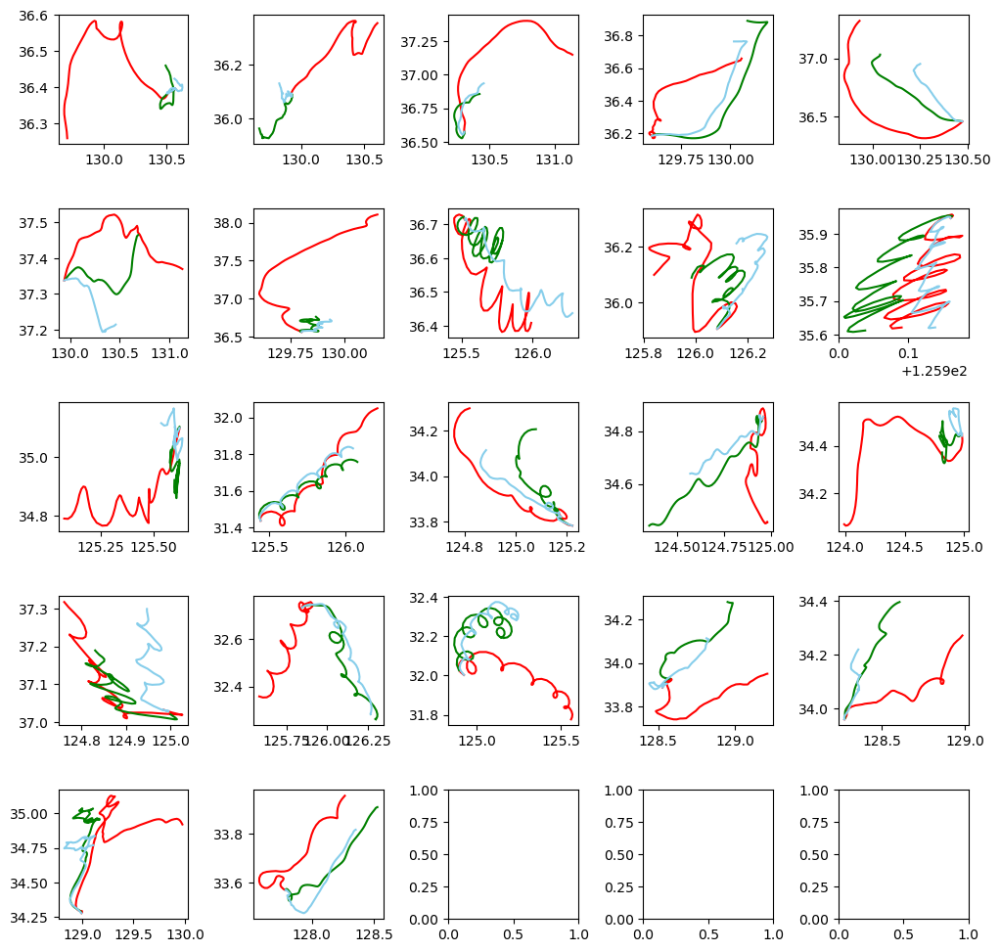

In [5]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]

    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_mod']]
    test_X = test_X[1:]
    test_X = test_X.rename(columns = {'diff_mod' : 'diff'})
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    train_X, test_X = roburst_scaler(train_X, test_X)
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    
        
    
    MLP_lon = KerasRegressor(build_fn=create_model, epochs=50, batch_size=20, verbose=1)
    MLP_lat = KerasRegressor(build_fn=create_model, epochs=50, batch_size=20, verbose=1)
    
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(RD_lon, SGD_lon,lightgb_lon,MLP_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(RD_lat, SGD_lat,lightgb_lat,MLP_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)
    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])
# 4 55
plt.show()

In [6]:
# stacking (meta RF depth=2) & 특징 5개 
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

Model Mae :  0.18605030684681542
Baseline Mae :  0.18057603746811715
Model NCLS :  0.5213497909303632
Baseline NCLS :  0.5326670971119444


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0184 - mae: 0.1004
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0044 - mae: 0.0512
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0355
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0277
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.6252e-04 - mae: 0.0228
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.5353e-04 - mae: 0.0197
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2499e-04 - mae: 0.0176
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2900e-04 - mae: 0.0159
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5849e-04 - mae: 0.0147
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0494e-04 - mae: 0.0135
Epoch 11/40
118/118 [====

118/118 [==============================] - 0s 1ms/step - loss: 0.0078 - mae: 0.0667
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0039 - mae: 0.0476
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0377
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0311
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0263
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 8.8455e-04 - mae: 0.0228
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0204e-04 - mae: 0.0200
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9028e-04 - mae: 0.0182
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1186e-04 - mae: 0.0170
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 4.5144e-04 - mae: 0.0160
Epoch 12/40
118/118 [==================

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0266
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.6042e-04 - mae: 0.0227
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9278e-04 - mae: 0.0204
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7585e-04 - mae: 0.0185
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8000e-04 - mae: 0.0170
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0872e-04 - mae: 0.0157
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5914e-04 - mae: 0.0147
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1027e-04 - mae: 0.0137
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6959e-04 - mae: 0.0127
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3490e-04 - mae: 0.0118
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 6.7019e-04 - mae: 0.0203
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.5844e-04 - mae: 0.0186
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7968e-04 - mae: 0.0172
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2244e-04 - mae: 0.0161
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6876e-04 - mae: 0.0151
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2889e-04 - mae: 0.0142
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9166e-04 - mae: 0.0134
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5811e-04 - mae: 0.0127
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3236e-04 - mae: 0.0119
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1178e-04 - mae: 0.0114
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 5.9241e-04 - mae: 0.0189
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1578e-04 - mae: 0.0177
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5432e-04 - mae: 0.0165
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1023e-04 - mae: 0.0156
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7222e-04 - mae: 0.0149
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3893e-04 - mae: 0.0142
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1229e-04 - mae: 0.0136
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8900e-04 - mae: 0.0131
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7427e-04 - mae: 0.0127
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5194e-04 - mae: 0.0123
Epoch 16/40
118

118/118 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0267
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0247
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 8.7570e-04 - mae: 0.0230
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 7.6063e-04 - mae: 0.0215
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6355e-04 - mae: 0.0200
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8100e-04 - mae: 0.0188
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1712e-04 - mae: 0.0176
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4668e-04 - mae: 0.0165
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9506e-04 - mae: 0.0153
Epoch 16/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5323e-04 - mae: 0.0145
Epoch 17/40
118/118 [=

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 23ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 23ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 28ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipy

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0740 - mae: 0.1731
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0654
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0447
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0347
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0307
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0268
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0254
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 9.6521e-04 - mae: 0.0241
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 8.4997e-04 - mae: 0.0227
Epoch 11/40
118/118 [====================

118/118 [==============================] - 0s 1ms/step - loss: 0.0033 - mae: 0.0422
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0262
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.3570e-04 - mae: 0.0222
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.3209e-04 - mae: 0.0207
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4586e-04 - mae: 0.0195
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7886e-04 - mae: 0.0185
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2647e-04 - mae: 0.0175
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7061e-04 - mae: 0.0165
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3251e-04 - mae: 0.0160
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9753e-04 - mae: 0.0153
Epoch 12/40
118/118 [======

118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0303
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0267
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0245
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 8.8222e-04 - mae: 0.0228
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.7048e-04 - mae: 0.0214
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7551e-04 - mae: 0.0200
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9694e-04 - mae: 0.0188
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2688e-04 - mae: 0.0177
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6976e-04 - mae: 0.0167
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2792e-04 - mae: 0.0159
Epoch 13/40
118/118 [=========

118/118 [==============================] - 0s 1ms/step - loss: 5.3835e-04 - mae: 0.0181
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6517e-04 - mae: 0.0168
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1317e-04 - mae: 0.0158
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6791e-04 - mae: 0.0150
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2513e-04 - mae: 0.0141
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9072e-04 - mae: 0.0134
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6222e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2746e-04 - mae: 0.0119
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1044e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9125e-04 - mae: 0.0109
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0313
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0292
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0274
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0259
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0244
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 8.9922e-04 - mae: 0.0231
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2841e-04 - mae: 0.0224
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 7.3697e-04 - mae: 0.0210
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 6.8296e-04 - mae: 0.0203
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 6.2874e-04 - mae: 0.0196
Epoch 16/40
118/118 [==============

118/118 [==============================] - 0s 1ms/step - loss: 4.0685e-04 - mae: 0.0156
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5125e-04 - mae: 0.0146
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1569e-04 - mae: 0.0138
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7395e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4279e-04 - mae: 0.0122
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1894e-04 - mae: 0.0116
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0124e-04 - mae: 0.0111
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7754e-04 - mae: 0.0104
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6273e-04 - mae: 0.0100
Epoch 16/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5160e-04 - mae: 0.0095
Epoch 17/40
11

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 28ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 23ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 23ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = te

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0205 - mae: 0.0960
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0455
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0339
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0251
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 8.4918e-04 - mae: 0.0223
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9895e-04 - mae: 0.0202
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8276e-04 - mae: 0.0184
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0333e-04 - mae: 0.0170
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3489e-04 - mae: 0.0158
Epoch 11/40
118/118 [========

118/118 [==============================] - 0s 1ms/step - loss: 0.0084 - mae: 0.0690
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0500
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0390
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0325
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0278
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0248
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 8.5579e-04 - mae: 0.0227
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 7.3686e-04 - mae: 0.0210
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 6.5076e-04 - mae: 0.0197
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7659e-04 - mae: 0.0186
Epoch 12/40
118/118 [======================

118/118 [==============================] - 0s 1ms/step - loss: 0.0032 - mae: 0.0436
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0332
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0276
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.9889e-04 - mae: 0.0242
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 8.1751e-04 - mae: 0.0218
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.8399e-04 - mae: 0.0201
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9272e-04 - mae: 0.0186
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2732e-04 - mae: 0.0176
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6063e-04 - mae: 0.0165
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1067e-04 - mae: 0.0156
Epoch 13/40
118/118 [=========

118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0253
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 8.9818e-04 - mae: 0.0233
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.7774e-04 - mae: 0.0218
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7630e-04 - mae: 0.0204
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9308e-04 - mae: 0.0190
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2689e-04 - mae: 0.0179
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7168e-04 - mae: 0.0170
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1714e-04 - mae: 0.0160
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7258e-04 - mae: 0.0150
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4523e-04 - mae: 0.0145
Epoch 15/40
118/118 

118/118 [==============================] - 0s 1ms/step - loss: 6.1859e-04 - mae: 0.0191
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3080e-04 - mae: 0.0179
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4726e-04 - mae: 0.0164
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9327e-04 - mae: 0.0155
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4053e-04 - mae: 0.0142
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9166e-04 - mae: 0.0133
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5275e-04 - mae: 0.0123
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1984e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0008e-04 - mae: 0.0109
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7229e-04 - mae: 0.0102
Epoch 16/40
118

118/118 [==============================] - 0s 1ms/step - loss: 5.7655e-04 - mae: 0.0184
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1216e-04 - mae: 0.0173
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6126e-04 - mae: 0.0164
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1893e-04 - mae: 0.0156
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7675e-04 - mae: 0.0148
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3966e-04 - mae: 0.0141
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1290e-04 - mae: 0.0135
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8036e-04 - mae: 0.0129
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5969e-04 - mae: 0.0124
Epoch 16/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3792e-04 - mae: 0.0118
Epoch 17/40
11

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 38ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 36ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 37ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 41ms/step


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0298 - mae: 0.1230
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0042 - mae: 0.0493
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0346
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0248
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 8.0441e-04 - mae: 0.0220
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.5275e-04 - mae: 0.0200
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.5436e-04 - mae: 0.0186
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7468e-04 - mae: 0.0171
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2117e-04 - mae: 0.0163
Epoch 11/40
118/118 [========

118/118 [==============================] - 0s 1ms/step - loss: 0.0029 - mae: 0.0424
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0328
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0282
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0255
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.3214e-04 - mae: 0.0235
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.8777e-04 - mae: 0.0215
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.8886e-04 - mae: 0.0201
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1544e-04 - mae: 0.0191
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1789e-04 - mae: 0.0174
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6163e-04 - mae: 0.0164
Epoch 12/40
118/118 [==============

118/118 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0375
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0310
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0272
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0249
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 9.2902e-04 - mae: 0.0234
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2282e-04 - mae: 0.0218
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5107e-04 - mae: 0.0209
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7296e-04 - mae: 0.0198
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0814e-04 - mae: 0.0187
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4914e-04 - mae: 0.0177
Epoch 13/40
118/118 [=============

118/118 [==============================] - 0s 1ms/step - loss: 7.7224e-04 - mae: 0.0215
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7484e-04 - mae: 0.0201
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9567e-04 - mae: 0.0188
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2640e-04 - mae: 0.0176
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6945e-04 - mae: 0.0165
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2227e-04 - mae: 0.0156
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8353e-04 - mae: 0.0148
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4945e-04 - mae: 0.0142
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 3.1691e-04 - mae: 0.0135
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9211e-04 - mae: 0.0130
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 9.4220e-04 - mae: 0.0237
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 8.1439e-04 - mae: 0.0223
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0302e-04 - mae: 0.0206
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 6.1496e-04 - mae: 0.0192
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3864e-04 - mae: 0.0180
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7983e-04 - mae: 0.0170
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3502e-04 - mae: 0.0162
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8460e-04 - mae: 0.0152
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6035e-04 - mae: 0.0148
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1997e-04 - mae: 0.0139
Epoch 16/40
118

118/118 [==============================] - 0s 1ms/step - loss: 8.7087e-04 - mae: 0.0229
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.2901e-04 - mae: 0.0209
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.3432e-04 - mae: 0.0195
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4873e-04 - mae: 0.0182
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7381e-04 - mae: 0.0168
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2431e-04 - mae: 0.0159
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6632e-04 - mae: 0.0147
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3784e-04 - mae: 0.0141
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9938e-04 - mae: 0.0133
Epoch 16/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6966e-04 - mae: 0.0126
Epoch 17/40
11

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 38ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 33ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 28ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 33ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the cave

Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0077 - mae: 0.0595
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0242
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2264e-04 - mae: 0.0219
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0990e-04 - mae: 0.0201
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0111e-04 - mae: 0.0188
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1334e-04 - mae: 0.0174
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5135e-04 - mae: 0.0162
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0909e-04 - mae: 0.0156
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6245e-04 - mae: 0.0146
Epoch 11/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 0.0185 - mae: 0.0979
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0087 - mae: 0.0694
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0051 - mae: 0.0541
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0034 - mae: 0.0447
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0382
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0336
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0298
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0269
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 9.8217e-04 - mae: 0.0244
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 8.3102e-04 - mae: 0.0225
Epoch 12/40
118/118 [==============================

118/118 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0370
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0327
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0296
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0266
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 9.9371e-04 - mae: 0.0239
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 8.4339e-04 - mae: 0.0220
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9860e-04 - mae: 0.0201
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 6.0722e-04 - mae: 0.0187
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1870e-04 - mae: 0.0174
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4751e-04 - mae: 0.0162
Epoch 13/40
118/118 [=============

118/118 [==============================] - 0s 1ms/step - loss: 6.0119e-04 - mae: 0.0188
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1326e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5626e-04 - mae: 0.0162
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0189e-04 - mae: 0.0154
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5388e-04 - mae: 0.0145
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1928e-04 - mae: 0.0137
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8670e-04 - mae: 0.0130
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5497e-04 - mae: 0.0123
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3274e-04 - mae: 0.0117
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0506e-04 - mae: 0.0110
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 7.4281e-04 - mae: 0.0210
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4951e-04 - mae: 0.0197
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.6514e-04 - mae: 0.0183
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0006e-04 - mae: 0.0172
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4517e-04 - mae: 0.0162
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8893e-04 - mae: 0.0151
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5171e-04 - mae: 0.0144
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1573e-04 - mae: 0.0137
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7778e-04 - mae: 0.0129
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5475e-04 - mae: 0.0124
Epoch 16/40
118

118/118 [==============================] - 0s 1ms/step - loss: 5.9185e-04 - mae: 0.0185
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2524e-04 - mae: 0.0175
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7204e-04 - mae: 0.0165
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2198e-04 - mae: 0.0156
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8287e-04 - mae: 0.0149
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4732e-04 - mae: 0.0142
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1267e-04 - mae: 0.0136
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 2.8379e-04 - mae: 0.0129
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5684e-04 - mae: 0.0123
Epoch 16/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3540e-04 - mae: 0.0118
Epoch 17/40
11

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 23ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:96: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:97: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)


Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0355 - mae: 0.1348
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0063 - mae: 0.0593
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0398
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0311
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0267
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0245
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 8.6827e-04 - mae: 0.0227
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.6918e-04 - mae: 0.0213
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.8204e-04 - mae: 0.0200
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0882e-04 - mae: 0.0189
Epoch 11/40
118/118 [============

118/118 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0398
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0319
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0278
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0252
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.2407e-04 - mae: 0.0232
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 8.1509e-04 - mae: 0.0218
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.1457e-04 - mae: 0.0204
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1787e-04 - mae: 0.0190
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4779e-04 - mae: 0.0179
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8170e-04 - mae: 0.0169
Epoch 12/40
118/118 [==============

118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0304
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 9.4721e-04 - mae: 0.0241
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.3362e-04 - mae: 0.0212
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.2232e-04 - mae: 0.0195
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4549e-04 - mae: 0.0181
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8960e-04 - mae: 0.0171
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3423e-04 - mae: 0.0160
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9854e-04 - mae: 0.0153
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6093e-04 - mae: 0.0146
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2655e-04 - mae: 0.0138
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0249
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.1539e-04 - mae: 0.0222
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9899e-04 - mae: 0.0206
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1849e-04 - mae: 0.0193
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4800e-04 - mae: 0.0180
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0747e-04 - mae: 0.0173
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5614e-04 - mae: 0.0165
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0799e-04 - mae: 0.0154
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6939e-04 - mae: 0.0146
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3495e-04 - mae: 0.0138
Epoch 14/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 6.0697e-04 - mae: 0.0189
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.9929e-04 - mae: 0.0171
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2226e-04 - mae: 0.0157
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6333e-04 - mae: 0.0147
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1672e-04 - mae: 0.0137
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.7867e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4182e-04 - mae: 0.0121
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2157e-04 - mae: 0.0116
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9103e-04 - mae: 0.0107
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6996e-04 - mae: 0.0101
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 5.6299e-04 - mae: 0.0188
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6082e-04 - mae: 0.0169
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9174e-04 - mae: 0.0156
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.3722e-04 - mae: 0.0144
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9778e-04 - mae: 0.0135
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6584e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3719e-04 - mae: 0.0121
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1779e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9706e-04 - mae: 0.0110
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7772e-04 - mae: 0.0104
Epoch 16/40
118

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 23ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 34ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 32ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 37ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 36ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 32ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 32ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 24ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 36ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 36ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 32ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 41ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 43ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 41ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 32ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 40ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 43ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 35ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 42ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 34ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 34ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 43ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 45ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 50ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 36ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 34ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 28ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 26ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 29ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 38ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 31ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 27ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - ETA: 0s

C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 25ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 30ms/step


C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "
C:\Users\gusrl\anaconda3\envs\tensorflow2_py39\lib\site-packages\lightgbm\basic.py:506: UserWarning: Usage of np.ndarray subset (sliced data) is not recommended due to it will double the peak memory cost in LightGBM.
  _log_warning("Usage of np.ndarray subset (sliced data) is not recommended "


1/1 [==============================] - 0s 39ms/step


C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:129: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:130: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:96: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\2455981356.py:97: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)


Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0414 - mae: 0.1390
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0050 - mae: 0.0555
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0393
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0318
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0275
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.6733e-04 - mae: 0.0243
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.8971e-04 - mae: 0.0221
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6131e-04 - mae: 0.0202
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7645e-04 - mae: 0.0188
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1497e-04 - mae: 0.0177
Epoch 11/40
118/118 [========

KeyboardInterrupt: 

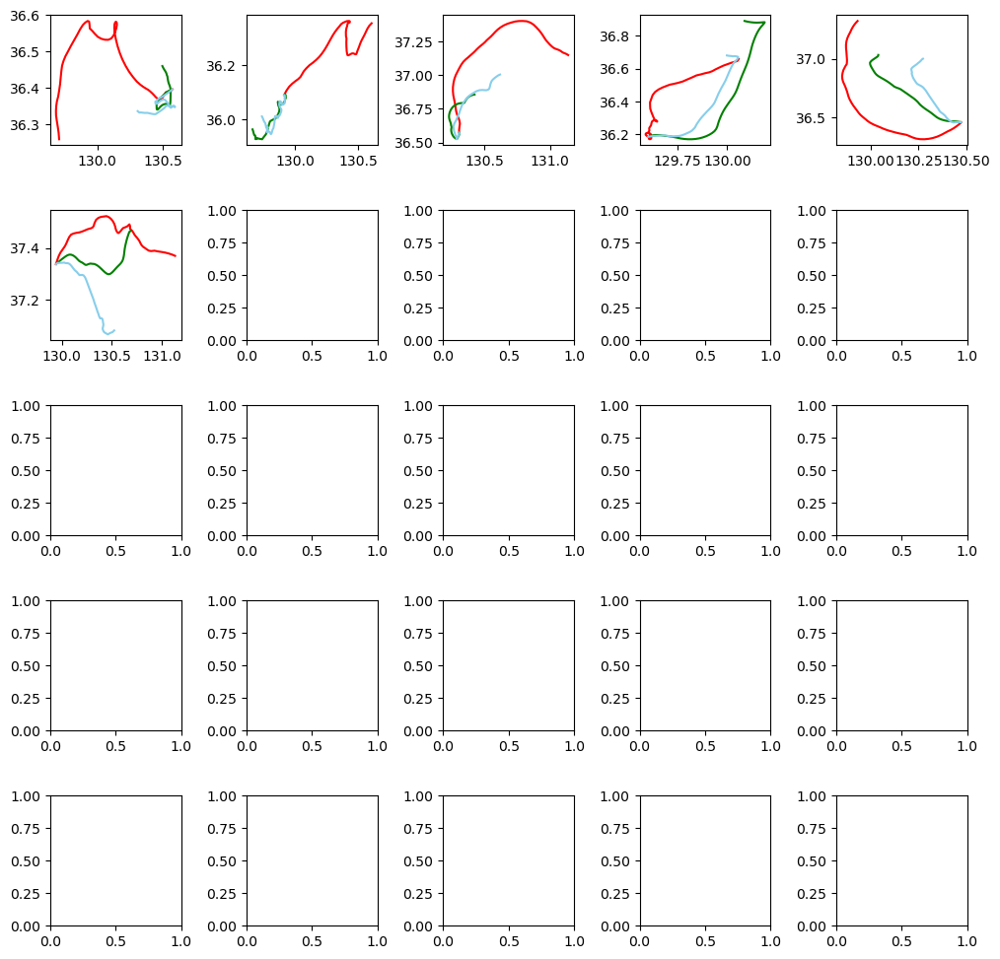

In [7]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]

    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y','diff_mod']]
    test_X = test_X[1:]
    test_X = test_X.rename(columns = {'diff_mod' : 'diff'})
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    train_X, test_X = roburst_scaler(train_X, test_X)
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    
        
    
    MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(RD_lon, SGD_lon,lightgb_lon,MLP_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(RD_lat, SGD_lat,lightgb_lat,MLP_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # Predict
    y_pred = np.zeros((len(test_X),2))
    pred_lon = stack_lon.predict(test_X[0].reshape((1,5)))
    pred_lat = stack_lat.predict(test_X[0].reshape((1,5)))
    y_pred[0][0] = pred_lon
    y_pred[0][1] = pred_lat
    
    for k in range(1,len(test_X)):
        diff = (y_pred[k-1][0]**2 + y_pred[k-1][1]**2)**(1/2)
        test_X[k][4] = diff
        pred_lon = stack_lon.predict(test_X[k].reshape((1,5)))
        pred_lat = stack_lat.predict(test_X[k].reshape((1,5)))
        y_pred[k][0] = pred_lon
        y_pred[k][1] = pred_lat
    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [ ]:
# stacking (meta RF depth=2) & 특징 5개 
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

In [8]:
# hyperparameter tuning 대상 정의 %%%%%%%%%%%%%%%%%
from keras.wrappers.scikit_learn import KerasRegressor
def create_model():
    MLP_lon = tf.keras.Sequential([
    Dense(units = 30, input_dim = 4, activation = 'relu')
    ])
    MLP_lon.add(Dense(units = 1))
    MLP_lon.compile(loss = 'mse', optimizer = 'adam', metrics = ['mae'])
    return MLP_lon

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0174 - mae: 0.0948
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0038 - mae: 0.0475
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0314
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.0145e-04 - mae: 0.0224
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2124e-04 - mae: 0.0181
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9472e-04 - mae: 0.0155
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2371e-04 - mae: 0.0139
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7134e-04 - mae: 0.0127
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3245e-04 - mae: 0.0118
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0671e-04 - mae: 0.0111
Epoch 11/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0526
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0023 - mae: 0.0385
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0296
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.3025e-04 - mae: 0.0229
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.5954e-04 - mae: 0.0186
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2406e-04 - mae: 0.0161
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5230e-04 - mae: 0.0146
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0883e-04 - mae: 0.0137
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7810e-04 - mae: 0.0130
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5602e-04 - mae: 0.0124
Epoch 12/40
118/118 [==========

118/118 [==============================] - 0s 1ms/step - loss: 9.3158e-04 - mae: 0.0239
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.4018e-04 - mae: 0.0213
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9903e-04 - mae: 0.0191
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.9395e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0344e-04 - mae: 0.0157
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4675e-04 - mae: 0.0145
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9597e-04 - mae: 0.0134
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6172e-04 - mae: 0.0126
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3090e-04 - mae: 0.0117
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0419e-04 - mae: 0.0111
Epoch 13/40
118/11

118/118 [==============================] - 0s 1ms/step - loss: 6.2792e-04 - mae: 0.0191
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6628e-04 - mae: 0.0164
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7683e-04 - mae: 0.0146
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1338e-04 - mae: 0.0133
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7417e-04 - mae: 0.0125
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3575e-04 - mae: 0.0116
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0995e-04 - mae: 0.0112
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8716e-04 - mae: 0.0105
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6696e-04 - mae: 0.0100
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4597e-04 - mae: 0.0094
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 5.5913e-04 - mae: 0.0186
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4896e-04 - mae: 0.0166
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7831e-04 - mae: 0.0152
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1697e-04 - mae: 0.0139
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7905e-04 - mae: 0.0130
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4586e-04 - mae: 0.0122
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2023e-04 - mae: 0.0116
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0186e-04 - mae: 0.0111
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8083e-04 - mae: 0.0106
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6948e-04 - mae: 0.0101
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 6.4267e-04 - mae: 0.0193
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4643e-04 - mae: 0.0178
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6160e-04 - mae: 0.0162
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 4.0599e-04 - mae: 0.0152
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6316e-04 - mae: 0.0144
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 3.2676e-04 - mae: 0.0136
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8943e-04 - mae: 0.0128
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6411e-04 - mae: 0.0123
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3732e-04 - mae: 0.0116
Epoch 15/40
118/118 [==============================] - 0s 2ms/step - loss: 2.2230e-04 - mae: 0.0112
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0690 - mae: 0.1670
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0061 - mae: 0.0590
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0024 - mae: 0.0381
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0305
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0273
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0249
Epoch 7/40
118/118 [==============================] - 0s 999us/step - loss: 8.7837e-04 - mae: 0.0231
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5212e-04 - mae: 0.0212
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.5554e-04 - mae: 0.0198
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7383e-04 - mae: 0.0185
Epoch 11/40
118/118 [==========

118/118 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0371
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 9.7951e-04 - mae: 0.0248
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.7369e-04 - mae: 0.0221
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.2645e-04 - mae: 0.0198
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0961e-04 - mae: 0.0178
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2757e-04 - mae: 0.0161
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5660e-04 - mae: 0.0146
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1072e-04 - mae: 0.0136
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7813e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5599e-04 - mae: 0.0124
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0253
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.3894e-04 - mae: 0.0227
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0618e-04 - mae: 0.0208
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9409e-04 - mae: 0.0191
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0899e-04 - mae: 0.0177
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3444e-04 - mae: 0.0162
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6633e-04 - mae: 0.0149
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1842e-04 - mae: 0.0138
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7848e-04 - mae: 0.0129
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4659e-04 - mae: 0.0121
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 4.8074e-04 - mae: 0.0169
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9246e-04 - mae: 0.0153
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2044e-04 - mae: 0.0137
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6611e-04 - mae: 0.0127
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2657e-04 - mae: 0.0117
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8797e-04 - mae: 0.0106
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6127e-04 - mae: 0.0099
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4504e-04 - mae: 0.0093
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2901e-04 - mae: 0.0088
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1579e-04 - mae: 0.0084
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 8.4075e-04 - mae: 0.0224
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9652e-04 - mae: 0.0205
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9239e-04 - mae: 0.0189
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2210e-04 - mae: 0.0178
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5650e-04 - mae: 0.0167
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1075e-04 - mae: 0.0159
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6926e-04 - mae: 0.0150
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3743e-04 - mae: 0.0143
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0113e-04 - mae: 0.0136
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8019e-04 - mae: 0.0131
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 3.2221e-04 - mae: 0.0138
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6805e-04 - mae: 0.0126
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3333e-04 - mae: 0.0116
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0177e-04 - mae: 0.0109
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8349e-04 - mae: 0.0104
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6129e-04 - mae: 0.0098
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 1.4239e-04 - mae: 0.0093
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3288e-04 - mae: 0.0089
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1994e-04 - mae: 0.0085
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1891e-04 - mae: 0.0084
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0158 - mae: 0.0804
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0310
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 9.9484e-04 - mae: 0.0245
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.7719e-04 - mae: 0.0216
Epoch 5/40
118/118 [==============================] - 0s 987us/step - loss: 6.2148e-04 - mae: 0.0192
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1797e-04 - mae: 0.0177
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3148e-04 - mae: 0.0160
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7004e-04 - mae: 0.0149
Epoch 9/40
118/118 [==============================] - 0s 986us/step - loss: 3.2207e-04 - mae: 0.0140
Epoch 10/40
118/118 [==============================] - 0s 987us/step - loss: 2.8368e-04 - mae: 0.0131
Epoch 11/40

118/118 [==============================] - 0s 996us/step - loss: 0.0052 - mae: 0.0537
Epoch 3/40
118/118 [==============================] - 0s 904us/step - loss: 0.0026 - mae: 0.0388
Epoch 4/40
118/118 [==============================] - 0s 942us/step - loss: 0.0017 - mae: 0.0317
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0270
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.6197e-04 - mae: 0.0240
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.8264e-04 - mae: 0.0216
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6191e-04 - mae: 0.0199
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.6195e-04 - mae: 0.0183
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8364e-04 - mae: 0.0169
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2893e-04 - mae: 0.0159
Epoch 12/40
118/118 [========

118/118 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0308
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0256
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2215e-04 - mae: 0.0222
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4797e-04 - mae: 0.0196
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2066e-04 - mae: 0.0176
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3892e-04 - mae: 0.0162
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7813e-04 - mae: 0.0150
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3743e-04 - mae: 0.0143
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0144e-04 - mae: 0.0134
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7018e-04 - mae: 0.0128
Epoch 13/40
118/118 [=====

Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5065e-04 - mae: 0.0213
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.6462e-04 - mae: 0.0184
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5016e-04 - mae: 0.0164
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6025e-04 - mae: 0.0147
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9789e-04 - mae: 0.0133
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.4476e-04 - mae: 0.0120
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1344e-04 - mae: 0.0113
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8424e-04 - mae: 0.0105
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 1.6264e-04 - mae: 0.0099
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 1.4648e-04 - mae: 0.0094
Epoch

118/118 [==============================] - 0s 1ms/step - loss: 3.8937e-04 - mae: 0.0152
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.4760e-04 - mae: 0.0143
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 2.9677e-04 - mae: 0.0133
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5995e-04 - mae: 0.0125
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4082e-04 - mae: 0.0120
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.1110e-04 - mae: 0.0113
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 1.8858e-04 - mae: 0.0106
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 1.7089e-04 - mae: 0.0101
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 1.5767e-04 - mae: 0.0097
Epoch 15/40
118/118 [==============================] - 0s 2ms/step - loss: 1.5083e-04 - mae: 0.0095
Epoch 16/40
118

118/118 [==============================] - 0s 1ms/step - loss: 3.8291e-04 - mae: 0.0151
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2962e-04 - mae: 0.0141
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 2.9399e-04 - mae: 0.0133
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.6988e-04 - mae: 0.0127
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5114e-04 - mae: 0.0123
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3056e-04 - mae: 0.0118
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 2.1630e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0367e-04 - mae: 0.0111
Epoch 15/40
118/118 [==============================] - 0s 2ms/step - loss: 1.8906e-04 - mae: 0.0107
Epoch 16/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8018e-04 - mae: 0.0104
Epoch 17/40
11

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0207 - mae: 0.0970
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0318
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0248
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.4922e-04 - mae: 0.0216
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8984e-04 - mae: 0.0191
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8388e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9361e-04 - mae: 0.0155
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2396e-04 - mae: 0.0139
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7499e-04 - mae: 0.0128
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3492e-04 - mae: 0.0119
Epoch 11/40
118/118 [

118/118 [==============================] - 0s 2ms/step - loss: 0.0023 - mae: 0.0368
Epoch 3/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0014 - mae: 0.0282
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 9.9245e-04 - mae: 0.0241
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 7.6185e-04 - mae: 0.0210
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 6.1860e-04 - mae: 0.0190
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 5.0013e-04 - mae: 0.0171
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 4.1457e-04 - mae: 0.0154
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.5085e-04 - mae: 0.0142
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.9802e-04 - mae: 0.0132
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.6780e-04 - mae: 0.0125
Epoch 12/40
118/118 [======

118/118 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0340
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0015 - mae: 0.0294
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0261
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.4805e-04 - mae: 0.0236
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 7.7689e-04 - mae: 0.0215
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 6.5495e-04 - mae: 0.0195
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 5.7014e-04 - mae: 0.0182
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.9538e-04 - mae: 0.0169
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 4.3453e-04 - mae: 0.0158
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 3.8956e-04 - mae: 0.0149
Epoch 13/40
118/118 [=========

Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 5.4035e-04 - mae: 0.0179
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 4.5265e-04 - mae: 0.0164
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.9099e-04 - mae: 0.0153
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 3.3812e-04 - mae: 0.0141
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0423e-04 - mae: 0.0134
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8081e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5560e-04 - mae: 0.0124
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3689e-04 - mae: 0.0119
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 2.2340e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 2.1045e-04 - mae: 0.0112
Epoch

118/118 [==============================] - 0s 1ms/step - loss: 4.9237e-04 - mae: 0.0174
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 4.2157e-04 - mae: 0.0161
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 3.6051e-04 - mae: 0.0148
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.1901e-04 - mae: 0.0140
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.8183e-04 - mae: 0.0131
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5434e-04 - mae: 0.0125
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3870e-04 - mae: 0.0121
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1754e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 1.9636e-04 - mae: 0.0110
Epoch 15/40
118/118 [==============================] - 0s 2ms/step - loss: 1.8288e-04 - mae: 0.0106
Epoch 16/40
118

118/118 [==============================] - 0s 1ms/step - loss: 4.9152e-04 - mae: 0.0174
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 4.1242e-04 - mae: 0.0158
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.5217e-04 - mae: 0.0146
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0932e-04 - mae: 0.0136
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.7586e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4430e-04 - mae: 0.0121
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 2.2829e-04 - mae: 0.0117
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 2.0401e-04 - mae: 0.0111
Epoch 15/40
118/118 [==============================] - 0s 2ms/step - loss: 1.8915e-04 - mae: 0.0107
Epoch 16/40
118/118 [==============================] - 0s 2ms/step - loss: 1.7100e-04 - mae: 0.0102
Epoch 17/40
11

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Epoch 1/40
118/118 [==============================] - 1s 2ms/step - loss: 0.0068 - mae: 0.0536
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0238
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 7.1446e-04 - mae: 0.0202
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 5.5984e-04 - mae: 0.0177
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 4.4437e-04 - mae: 0.0160
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 3.6203e-04 - mae: 0.0144
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0418e-04 - mae: 0.0132
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 2.5685e-04 - mae: 0.0122
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 2.2862e-04 - mae: 0.0116
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.0233e-04 - mae: 0.0108
Epoch 11/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 0.0166 - mae: 0.0923
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0623
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0037 - mae: 0.0458
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0022 - mae: 0.0354
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0289
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0248
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 8.0433e-04 - mae: 0.0219
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 6.6124e-04 - mae: 0.0199
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 5.6232e-04 - mae: 0.0184
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 4.9779e-04 - mae: 0.0173
Epoch 12/40
118/118 [======================

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0269
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 8.3575e-04 - mae: 0.0224
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 6.2658e-04 - mae: 0.0193
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 5.1252e-04 - mae: 0.0175
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 4.2999e-04 - mae: 0.0160
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 3.9172e-04 - mae: 0.0152
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.4408e-04 - mae: 0.0142
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 3.1129e-04 - mae: 0.0136
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.9778e-04 - mae: 0.0133
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7217e-04 - mae: 0.0126
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 2ms/step - loss: 4.1016e-04 - mae: 0.0158
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 3.3385e-04 - mae: 0.0141
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 2.7672e-04 - mae: 0.0129
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 2.4139e-04 - mae: 0.0122
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 2.1192e-04 - mae: 0.0114
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 1.8827e-04 - mae: 0.0107
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 1.7306e-04 - mae: 0.0104
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 1.5923e-04 - mae: 0.0099
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4645e-04 - mae: 0.0095
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3111e-04 - mae: 0.0089
Epoch 14/40
118/1

118/118 [==============================] - 0s 2ms/step - loss: 6.4262e-04 - mae: 0.0193
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 5.4174e-04 - mae: 0.0176
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 4.5078e-04 - mae: 0.0162
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 3.8738e-04 - mae: 0.0150
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.5280e-04 - mae: 0.0144
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0489e-04 - mae: 0.0134
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.7039e-04 - mae: 0.0127
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 2.4557e-04 - mae: 0.0122
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 2.2417e-04 - mae: 0.0117
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 2.0382e-04 - mae: 0.0112
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 5.9355e-04 - mae: 0.0186
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0550e-04 - mae: 0.0171
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3908e-04 - mae: 0.0158
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.8162e-04 - mae: 0.0148
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3478e-04 - mae: 0.0139
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8400e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 2.5182e-04 - mae: 0.0121
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1742e-04 - mae: 0.0113
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9472e-04 - mae: 0.0107
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6820e-04 - mae: 0.0100
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0365 - mae: 0.1346
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0054 - mae: 0.0540
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0338
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0250
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0364e-04 - mae: 0.0208
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4960e-04 - mae: 0.0184
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5944e-04 - mae: 0.0168
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9508e-04 - mae: 0.0156
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4973e-04 - mae: 0.0146
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1008e-04 - mae: 0.0138
Epoch 11/40
118/118 [====

118/118 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0272
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 8.9222e-04 - mae: 0.0225
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.4123e-04 - mae: 0.0204
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.3696e-04 - mae: 0.0190
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.5047e-04 - mae: 0.0178
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8330e-04 - mae: 0.0169
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3227e-04 - mae: 0.0160
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8813e-04 - mae: 0.0152
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4506e-04 - mae: 0.0144
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1651e-04 - mae: 0.0138
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 9.0373e-04 - mae: 0.0237
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1654e-04 - mae: 0.0195
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0652e-04 - mae: 0.0177
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 4.4326e-04 - mae: 0.0164
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.9451e-04 - mae: 0.0154
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6195e-04 - mae: 0.0147
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2551e-04 - mae: 0.0140
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9795e-04 - mae: 0.0134
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7072e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4577e-04 - mae: 0.0121
Epoch 13/40
118/11

118/118 [==============================] - 0s 1ms/step - loss: 7.6991e-04 - mae: 0.0213
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0179e-04 - mae: 0.0189
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8856e-04 - mae: 0.0170
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0921e-04 - mae: 0.0155
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5044e-04 - mae: 0.0143
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0689e-04 - mae: 0.0135
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7021e-04 - mae: 0.0127
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3206e-04 - mae: 0.0118
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0170e-04 - mae: 0.0110
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7754e-04 - mae: 0.0104
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 4.4977e-04 - mae: 0.0164
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6731e-04 - mae: 0.0147
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0593e-04 - mae: 0.0134
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6322e-04 - mae: 0.0125
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2873e-04 - mae: 0.0116
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9911e-04 - mae: 0.0108
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7032e-04 - mae: 0.0100
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5332e-04 - mae: 0.0094
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4021e-04 - mae: 0.0091
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2561e-04 - mae: 0.0086
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 4.7821e-04 - mae: 0.0170
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7378e-04 - mae: 0.0152
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0417e-04 - mae: 0.0136
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5851e-04 - mae: 0.0125
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2729e-04 - mae: 0.0117
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.0012e-04 - mae: 0.0110
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 1.7777e-04 - mae: 0.0104
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6125e-04 - mae: 0.0099
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4342e-04 - mae: 0.0093
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3211e-04 - mae: 0.0089
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:126: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff()
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:127: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['model_diff_lon'][0] = 0
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:128: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

Epoch 1/40
118/118 [==============================] - 1s 2ms/step - loss: 0.0327 - mae: 0.1216
Epoch 2/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0039 - mae: 0.0487
Epoch 3/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0019 - mae: 0.0341
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0012 - mae: 0.0269
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 8.4595e-04 - mae: 0.0227
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 6.5283e-04 - mae: 0.0201
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 5.3957e-04 - mae: 0.0180
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 4.5415e-04 - mae: 0.0165
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.9097e-04 - mae: 0.0152
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 3.4494e-04 - mae: 0.0143
Epoch 11/40
118/118 [====

118/118 [==============================] - 0s 2ms/step - loss: 0.0049 - mae: 0.0544
Epoch 3/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0020 - mae: 0.0346
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0279
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 9.6573e-04 - mae: 0.0246
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 7.8768e-04 - mae: 0.0221
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 6.6985e-04 - mae: 0.0204
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 5.7371e-04 - mae: 0.0188
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 4.9789e-04 - mae: 0.0175
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 4.3944e-04 - mae: 0.0165
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 3.8821e-04 - mae: 0.0155
Epoch 12/40
118/118 [==========

118/118 [==============================] - 0s 1ms/step - loss: 6.3533e-04 - mae: 0.0201
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4613e-04 - mae: 0.0168
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 3.4167e-04 - mae: 0.0146
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7618e-04 - mae: 0.0131
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2836e-04 - mae: 0.0119
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0073e-04 - mae: 0.0111
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7245e-04 - mae: 0.0103
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 1.5853e-04 - mae: 0.0098
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4123e-04 - mae: 0.0092
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3334e-04 - mae: 0.0090
Epoch 13/40
118/11

118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0255
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.8312e-04 - mae: 0.0206
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0549e-04 - mae: 0.0175
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 4.1628e-04 - mae: 0.0160
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5571e-04 - mae: 0.0147
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1109e-04 - mae: 0.0138
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7541e-04 - mae: 0.0130
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4623e-04 - mae: 0.0122
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1916e-04 - mae: 0.0115
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9983e-04 - mae: 0.0110
Epoch 14/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 2.7807e-04 - mae: 0.0129
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2262e-04 - mae: 0.0115
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9168e-04 - mae: 0.0107
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6825e-04 - mae: 0.0101
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5890e-04 - mae: 0.0097
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3617e-04 - mae: 0.0091
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2723e-04 - mae: 0.0087
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 1.1919e-04 - mae: 0.0085
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 1.1009e-04 - mae: 0.0081
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.0134e-04 - mae: 0.0078
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 4.8429e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1834e-04 - mae: 0.0159
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6237e-04 - mae: 0.0149
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1547e-04 - mae: 0.0138
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7895e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4753e-04 - mae: 0.0122
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 2.1628e-04 - mae: 0.0114
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9385e-04 - mae: 0.0108
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7671e-04 - mae: 0.0104
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5800e-04 - mae: 0.0098
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0076 - mae: 0.0570
Epoch 2/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0011 - mae: 0.0255
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7820e-04 - mae: 0.0205
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3215e-04 - mae: 0.0180
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3328e-04 - mae: 0.0163
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6147e-04 - mae: 0.0147
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0850e-04 - mae: 0.0137
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7305e-04 - mae: 0.0128
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5388e-04 - mae: 0.0123
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4006e-04 - mae: 0.0120
Epoch 11/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 0.0178 - mae: 0.1011
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0086 - mae: 0.0727
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0052 - mae: 0.0564
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0473
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0406
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0349
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0304
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0269
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 9.6942e-04 - mae: 0.0242
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 8.0120e-04 - mae: 0.0221
Epoch 12/40
118/118 [==============================

118/118 [==============================] - 0s 1ms/step - loss: 8.3045e-04 - mae: 0.0228
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 6.3322e-04 - mae: 0.0198
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 5.1833e-04 - mae: 0.0177
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4155e-04 - mae: 0.0164
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7881e-04 - mae: 0.0151
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4058e-04 - mae: 0.0144
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0406e-04 - mae: 0.0135
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7096e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6046e-04 - mae: 0.0126
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3382e-04 - mae: 0.0119
Epoch 13/40
118/11

118/118 [==============================] - 0s 2ms/step - loss: 8.7054e-04 - mae: 0.0227
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 7.1572e-04 - mae: 0.0204
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 5.8950e-04 - mae: 0.0185
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0488e-04 - mae: 0.0171
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2625e-04 - mae: 0.0157
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6752e-04 - mae: 0.0145
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2004e-04 - mae: 0.0136
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7217e-04 - mae: 0.0125
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4318e-04 - mae: 0.0119
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1241e-04 - mae: 0.0112
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0263
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 8.8207e-04 - mae: 0.0236
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.1463e-04 - mae: 0.0213
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8384e-04 - mae: 0.0192
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8113e-04 - mae: 0.0175
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0374e-04 - mae: 0.0160
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4637e-04 - mae: 0.0147
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0285e-04 - mae: 0.0138
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7286e-04 - mae: 0.0131
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4738e-04 - mae: 0.0124
Epoch 15/40
118/118 

118/118 [==============================] - 0s 1ms/step - loss: 3.4943e-04 - mae: 0.0146
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 2.7932e-04 - mae: 0.0131
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3800e-04 - mae: 0.0121
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0238e-04 - mae: 0.0112
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7813e-04 - mae: 0.0104
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 1.5567e-04 - mae: 0.0097
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4198e-04 - mae: 0.0093
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3549e-04 - mae: 0.0091
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2486e-04 - mae: 0.0087
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1939e-04 - mae: 0.0085
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0085 - mae: 0.0615
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0282
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 9.3254e-04 - mae: 0.0233
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0447e-04 - mae: 0.0203
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3602e-04 - mae: 0.0177
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2696e-04 - mae: 0.0159
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.5864e-04 - mae: 0.0145
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0240e-04 - mae: 0.0133
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6077e-04 - mae: 0.0125
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3660e-04 - mae: 0.0118
Epoch 11/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0333
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 9.8622e-04 - mae: 0.0238
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 7.3931e-04 - mae: 0.0207
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9095e-04 - mae: 0.0187
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7581e-04 - mae: 0.0167
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.9832e-04 - mae: 0.0152
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3187e-04 - mae: 0.0140
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 2.9022e-04 - mae: 0.0131
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.5288e-04 - mae: 0.0122
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2772e-04 - mae: 0.0116
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0264
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.3539e-04 - mae: 0.0223
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 6.4927e-04 - mae: 0.0198
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1755e-04 - mae: 0.0177
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1019e-04 - mae: 0.0158
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3678e-04 - mae: 0.0143
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8414e-04 - mae: 0.0131
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3787e-04 - mae: 0.0120
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0470e-04 - mae: 0.0111
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8342e-04 - mae: 0.0105
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 5.1580e-04 - mae: 0.0172
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0530e-04 - mae: 0.0154
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1702e-04 - mae: 0.0136
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5434e-04 - mae: 0.0122
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 2.1351e-04 - mae: 0.0112
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 1.7569e-04 - mae: 0.0102
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 1.5209e-04 - mae: 0.0096
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 1.3415e-04 - mae: 0.0089
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1974e-04 - mae: 0.0085
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.0759e-04 - mae: 0.0081
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 5.6429e-04 - mae: 0.0179
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 4.3707e-04 - mae: 0.0159
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5987e-04 - mae: 0.0146
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0137e-04 - mae: 0.0134
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5958e-04 - mae: 0.0125
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2903e-04 - mae: 0.0118
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0549e-04 - mae: 0.0113
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9738e-04 - mae: 0.0111
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7392e-04 - mae: 0.0104
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5965e-04 - mae: 0.0099
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 3.6901e-04 - mae: 0.0149
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0231e-04 - mae: 0.0134
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5931e-04 - mae: 0.0125
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2895e-04 - mae: 0.0117
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0356e-04 - mae: 0.0111
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7659e-04 - mae: 0.0103
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6040e-04 - mae: 0.0098
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4559e-04 - mae: 0.0094
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 1.3355e-04 - mae: 0.0090
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2708e-04 - mae: 0.0087
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWith

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWith

Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0400 - mae: 0.1317
Epoch 2/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0038 - mae: 0.0472
Epoch 3/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0013 - mae: 0.0284
Epoch 4/40
118/118 [==============================] - 0s 2ms/step - loss: 9.1570e-04 - mae: 0.0239
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5406e-04 - mae: 0.0217
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.3093e-04 - mae: 0.0198
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3963e-04 - mae: 0.0182
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7371e-04 - mae: 0.0171
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 4.1024e-04 - mae: 0.0158
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6336e-04 - mae: 0.0149
Epoch 11/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 0.0053 - mae: 0.0556
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0020 - mae: 0.0345
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0283
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0257
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.1414e-04 - mae: 0.0235
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.7083e-04 - mae: 0.0217
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6524e-04 - mae: 0.0201
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.6847e-04 - mae: 0.0186
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8814e-04 - mae: 0.0174
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2860e-04 - mae: 0.0162
Epoch 12/40
118/118 [==============

118/118 [==============================] - 0s 1ms/step - loss: 3.6247e-04 - mae: 0.0147
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9182e-04 - mae: 0.0132
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5021e-04 - mae: 0.0122
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1506e-04 - mae: 0.0113
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8923e-04 - mae: 0.0104
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6993e-04 - mae: 0.0099
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5365e-04 - mae: 0.0094
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4152e-04 - mae: 0.0090
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3428e-04 - mae: 0.0088
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2680e-04 - mae: 0.0085
Epoch 13/40
118/11

118/118 [==============================] - 0s 1ms/step - loss: 7.5603e-04 - mae: 0.0210
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8829e-04 - mae: 0.0183
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8724e-04 - mae: 0.0168
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1191e-04 - mae: 0.0156
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5273e-04 - mae: 0.0144
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 3.1817e-04 - mae: 0.0137
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7310e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.4026e-04 - mae: 0.0121
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1037e-04 - mae: 0.0113
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9174e-04 - mae: 0.0108
Epoch 14/40
118/1

118/118 [==============================] - 0s 2ms/step - loss: 9.0580e-04 - mae: 0.0233
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9332e-04 - mae: 0.0205
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.5361e-04 - mae: 0.0184
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4658e-04 - mae: 0.0165
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6707e-04 - mae: 0.0148
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1252e-04 - mae: 0.0137
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7023e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4277e-04 - mae: 0.0121
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2161e-04 - mae: 0.0116
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0352e-04 - mae: 0.0111
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 4.7107e-04 - mae: 0.0169
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.8509e-04 - mae: 0.0153
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2695e-04 - mae: 0.0141
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7628e-04 - mae: 0.0128
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4559e-04 - mae: 0.0121
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0867e-04 - mae: 0.0112
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9002e-04 - mae: 0.0107
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7059e-04 - mae: 0.0100
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5778e-04 - mae: 0.0097
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4425e-04 - mae: 0.0092
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:92: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:93: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)


Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0084 - mae: 0.0668
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0261
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5133e-04 - mae: 0.0208
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 6.2102e-04 - mae: 0.0189
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1759e-04 - mae: 0.0173
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4915e-04 - mae: 0.0160
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8488e-04 - mae: 0.0149
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4760e-04 - mae: 0.0141
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0464e-04 - mae: 0.0132
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7412e-04 - mae: 0.0126
Epoch 11/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 0.0043 - mae: 0.0494
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0330
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0245
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9786e-04 - mae: 0.0202
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3631e-04 - mae: 0.0177
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4340e-04 - mae: 0.0162
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8025e-04 - mae: 0.0151
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2401e-04 - mae: 0.0140
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8374e-04 - mae: 0.0131
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5023e-04 - mae: 0.0124
Epoch 12/40
118/118 [==========

118/118 [==============================] - 0s 1ms/step - loss: 9.1151e-04 - mae: 0.0234
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 6.5955e-04 - mae: 0.0200
Epoch 5/40
118/118 [==============================] - 0s 2ms/step - loss: 5.3297e-04 - mae: 0.0178
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3304e-04 - mae: 0.0163
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6553e-04 - mae: 0.0149
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1151e-04 - mae: 0.0138
Epoch 9/40
118/118 [==============================] - 0s 2ms/step - loss: 2.6993e-04 - mae: 0.0129
Epoch 10/40
118/118 [==============================] - 0s 2ms/step - loss: 2.3032e-04 - mae: 0.0118
Epoch 11/40
118/118 [==============================] - 0s 2ms/step - loss: 2.0077e-04 - mae: 0.0111
Epoch 12/40
118/118 [==============================] - 0s 2ms/step - loss: 1.7877e-04 - mae: 0.0103
Epoch 13/40
118/11

118/118 [==============================] - 0s 1ms/step - loss: 3.6356e-04 - mae: 0.0149
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1972e-04 - mae: 0.0139
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8391e-04 - mae: 0.0131
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5340e-04 - mae: 0.0123
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3338e-04 - mae: 0.0119
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0666e-04 - mae: 0.0111
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8453e-04 - mae: 0.0105
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6240e-04 - mae: 0.0099
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4826e-04 - mae: 0.0094
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3575e-04 - mae: 0.0091
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 4.6364e-04 - mae: 0.0169
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8561e-04 - mae: 0.0155
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4002e-04 - mae: 0.0145
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9820e-04 - mae: 0.0135
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6491e-04 - mae: 0.0128
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4061e-04 - mae: 0.0122
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1676e-04 - mae: 0.0115
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0102e-04 - mae: 0.0112
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8272e-04 - mae: 0.0106
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6778e-04 - mae: 0.0102
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 4.6935e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7121e-04 - mae: 0.0152
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0314e-04 - mae: 0.0137
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5225e-04 - mae: 0.0123
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1393e-04 - mae: 0.0113
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8635e-04 - mae: 0.0105
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6697e-04 - mae: 0.0099
Epoch 13/40
118/118 [==============================] - 0s 2ms/step - loss: 1.4653e-04 - mae: 0.0094
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3518e-04 - mae: 0.0090
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2436e-04 - mae: 0.0086
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWith

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/40
118/118 [==============================] - 1s 2ms/step - loss: 0.0370 - mae: 0.1272
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0036 - mae: 0.0472
Epoch 3/40
118/118 [==============================] - 0s 2ms/step - loss: 0.0017 - mae: 0.0319
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0259
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.8352e-04 - mae: 0.0231
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.6298e-04 - mae: 0.0217
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7921e-04 - mae: 0.0204
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0342e-04 - mae: 0.0193
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3926e-04 - mae: 0.0182
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8328e-04 - mae: 0.0172
Epoch 11/40
118/118 [====

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0269
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7861e-04 - mae: 0.0189
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4691e-04 - mae: 0.0164
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6724e-04 - mae: 0.0148
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 3.0363e-04 - mae: 0.0136
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6066e-04 - mae: 0.0126
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2651e-04 - mae: 0.0117
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9717e-04 - mae: 0.0109
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7886e-04 - mae: 0.0104
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7041e-04 - mae: 0.0101
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 5.8905e-04 - mae: 0.0186
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6566e-04 - mae: 0.0166
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6757e-04 - mae: 0.0148
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0823e-04 - mae: 0.0136
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7666e-04 - mae: 0.0129
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3700e-04 - mae: 0.0120
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1664e-04 - mae: 0.0114
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9119e-04 - mae: 0.0108
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7612e-04 - mae: 0.0104
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5880e-04 - mae: 0.0098
Epoch 13/40
118/11

118/118 [==============================] - 0s 994us/step - loss: 8.6680e-04 - mae: 0.0231
Epoch 5/40
118/118 [==============================] - 0s 992us/step - loss: 7.1063e-04 - mae: 0.0208
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8843e-04 - mae: 0.0187
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8980e-04 - mae: 0.0172
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1586e-04 - mae: 0.0159
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4502e-04 - mae: 0.0145
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0157e-04 - mae: 0.0136
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5714e-04 - mae: 0.0125
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2315e-04 - mae: 0.0116
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9703e-04 - mae: 0.0109
Epoch 14/40
1

118/118 [==============================] - 0s 1ms/step - loss: 4.9886e-04 - mae: 0.0172
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0867e-04 - mae: 0.0155
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 3.3925e-04 - mae: 0.0140
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9198e-04 - mae: 0.0130
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5304e-04 - mae: 0.0121
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2614e-04 - mae: 0.0114
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0377e-04 - mae: 0.0108
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8816e-04 - mae: 0.0104
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7005e-04 - mae: 0.0100
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5934e-04 - mae: 0.0097
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 5.8945e-04 - mae: 0.0188
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0508e-04 - mae: 0.0173
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2760e-04 - mae: 0.0159
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7487e-04 - mae: 0.0149
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2604e-04 - mae: 0.0139
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8483e-04 - mae: 0.0131
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5951e-04 - mae: 0.0124
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3082e-04 - mae: 0.0119
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0739e-04 - mae: 0.0112
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8730e-04 - mae: 0.0107
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWith

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/40
118/118 [==============================] - 0s 992us/step - loss: 0.0321 - mae: 0.1238
Epoch 2/40
118/118 [==============================] - 0s 992us/step - loss: 0.0045 - mae: 0.0511
Epoch 3/40
118/118 [==============================] - 0s 987us/step - loss: 0.0021 - mae: 0.0351
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0272
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.9361e-04 - mae: 0.0230
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.9752e-04 - mae: 0.0205
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.6847e-04 - mae: 0.0187
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8485e-04 - mae: 0.0173
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1090e-04 - mae: 0.0160
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5144e-04 - mae: 0.0148
Epoch 11/40
118/118

118/118 [==============================] - 0s 1ms/step - loss: 0.0071 - mae: 0.0629
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0396
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0316
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0277
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 9.9016e-04 - mae: 0.0245
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.9727e-04 - mae: 0.0221
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4137e-04 - mae: 0.0199
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2816e-04 - mae: 0.0181
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5273e-04 - mae: 0.0166
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7568e-04 - mae: 0.0151
Epoch 12/40
118/118 [==============

118/118 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0365
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0286
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 9.5590e-04 - mae: 0.0240
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.6527e-04 - mae: 0.0215
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.3144e-04 - mae: 0.0194
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3583e-04 - mae: 0.0179
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6273e-04 - mae: 0.0166
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0936e-04 - mae: 0.0155
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5941e-04 - mae: 0.0145
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2061e-04 - mae: 0.0137
Epoch 13/40
118/118 [=====

118/118 [==============================] - 0s 996us/step - loss: 0.0030 - mae: 0.0435
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0360
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0307
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0266
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 8.9266e-04 - mae: 0.0235
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 7.1434e-04 - mae: 0.0210
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8988e-04 - mae: 0.0190
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0015e-04 - mae: 0.0174
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3436e-04 - mae: 0.0162
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7993e-04 - mae: 0.0151
Epoch 14/40
118/118 [==========

118/118 [==============================] - 0s 1ms/step - loss: 7.9050e-04 - mae: 0.0220
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4322e-04 - mae: 0.0200
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3813e-04 - mae: 0.0182
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6875e-04 - mae: 0.0170
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0430e-04 - mae: 0.0157
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6491e-04 - mae: 0.0150
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2945e-04 - mae: 0.0142
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0095e-04 - mae: 0.0135
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6675e-04 - mae: 0.0127
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4741e-04 - mae: 0.0123
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 2.4734e-04 - mae: 0.0122
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0172e-04 - mae: 0.0111
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7053e-04 - mae: 0.0102
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4942e-04 - mae: 0.0096
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3567e-04 - mae: 0.0091
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2274e-04 - mae: 0.0086
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1299e-04 - mae: 0.0083
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.0731e-04 - mae: 0.0081
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.0444e-04 - mae: 0.0079
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 9.4889e-05 - mae: 0.0076
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/40
118/118 [==============================] - 0s 996us/step - loss: 0.0212 - mae: 0.0974
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0025 - mae: 0.0360
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 9.1133e-04 - mae: 0.0230
Epoch 4/40
118/118 [==============================] - 0s 1000us/step - loss: 6.9973e-04 - mae: 0.0201
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9794e-04 - mae: 0.0187
Epoch 6/40
118/118 [==============================] - 0s 996us/step - loss: 5.1759e-04 - mae: 0.0174
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5155e-04 - mae: 0.0164
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1125e-04 - mae: 0.0155
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6781e-04 - mae: 0.0148
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2824e-04 - mae: 0.0139
Epoch 11/4

118/118 [==============================] - 0s 1ms/step - loss: 9.2798e-04 - mae: 0.0238
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8108e-04 - mae: 0.0187
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7029e-04 - mae: 0.0168
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8952e-04 - mae: 0.0152
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4053e-04 - mae: 0.0142
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9939e-04 - mae: 0.0134
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5772e-04 - mae: 0.0123
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3510e-04 - mae: 0.0118
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1435e-04 - mae: 0.0113
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9834e-04 - mae: 0.0108
Epoch 12/40
118/118

118/118 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0404
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0015 - mae: 0.0312
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0265
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 8.7794e-04 - mae: 0.0236
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.1945e-04 - mae: 0.0213
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0862e-04 - mae: 0.0195
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.0626e-04 - mae: 0.0177
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3748e-04 - mae: 0.0165
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8230e-04 - mae: 0.0154
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3337e-04 - mae: 0.0143
Epoch 13/40
118/118 [=========

118/118 [==============================] - 0s 979us/step - loss: 4.1962e-04 - mae: 0.0160
Epoch 5/40
118/118 [==============================] - 0s 996us/step - loss: 3.4144e-04 - mae: 0.0143
Epoch 6/40
118/118 [==============================] - 0s 990us/step - loss: 2.8630e-04 - mae: 0.0130
Epoch 7/40
118/118 [==============================] - 0s 979us/step - loss: 2.3676e-04 - mae: 0.0118
Epoch 8/40
118/118 [==============================] - 0s 996us/step - loss: 2.0579e-04 - mae: 0.0110
Epoch 9/40
118/118 [==============================] - 0s 995us/step - loss: 1.8697e-04 - mae: 0.0105
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6872e-04 - mae: 0.0101
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5432e-04 - mae: 0.0096
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4213e-04 - mae: 0.0092
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4270e-04 - mae: 0.0093
Epoch

118/118 [==============================] - 0s 1ms/step - loss: 5.1169e-04 - mae: 0.0178
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2489e-04 - mae: 0.0160
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6637e-04 - mae: 0.0148
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1556e-04 - mae: 0.0136
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6882e-04 - mae: 0.0126
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3534e-04 - mae: 0.0118
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0539e-04 - mae: 0.0110
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8430e-04 - mae: 0.0104
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5941e-04 - mae: 0.0096
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4474e-04 - mae: 0.0093
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 4.2446e-04 - mae: 0.0157
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5837e-04 - mae: 0.0145
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0963e-04 - mae: 0.0135
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7146e-04 - mae: 0.0127
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4279e-04 - mae: 0.0120
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1185e-04 - mae: 0.0113
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9304e-04 - mae: 0.0108
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7706e-04 - mae: 0.0103
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5924e-04 - mae: 0.0098
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4980e-04 - mae: 0.0095
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/40
118/118 [==============================] - 0s 996us/step - loss: 0.0246 - mae: 0.1049
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0028 - mae: 0.0393
Epoch 3/40
118/118 [==============================] - 0s 996us/step - loss: 0.0011 - mae: 0.0260
Epoch 4/40
118/118 [==============================] - 0s 987us/step - loss: 7.7773e-04 - mae: 0.0219
Epoch 5/40
118/118 [==============================] - 0s 992us/step - loss: 5.9543e-04 - mae: 0.0191
Epoch 6/40
118/118 [==============================] - 0s 987us/step - loss: 4.8312e-04 - mae: 0.0172
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1217e-04 - mae: 0.0158
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6550e-04 - mae: 0.0147
Epoch 9/40
118/118 [==============================] - 0s 996us/step - loss: 3.1841e-04 - mae: 0.0139
Epoch 10/40
118/118 [==============================] - 0s 992us/step - loss: 2.9083e-04 - mae: 0.0132
Epoch 1

118/118 [==============================] - 0s 1ms/step - loss: 0.0021 - mae: 0.0347
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0275
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 9.8551e-04 - mae: 0.0240
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.0016e-04 - mae: 0.0216
Epoch 6/40
118/118 [==============================] - 0s 2ms/step - loss: 6.7727e-04 - mae: 0.0198
Epoch 7/40
118/118 [==============================] - 0s 2ms/step - loss: 5.6950e-04 - mae: 0.0182
Epoch 8/40
118/118 [==============================] - 0s 2ms/step - loss: 4.7774e-04 - mae: 0.0167
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1920e-04 - mae: 0.0156
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5676e-04 - mae: 0.0145
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0851e-04 - mae: 0.0134
Epoch 12/40
118/118 [======

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0258
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.5498e-04 - mae: 0.0223
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.8626e-04 - mae: 0.0202
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7120e-04 - mae: 0.0184
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7942e-04 - mae: 0.0170
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1458e-04 - mae: 0.0158
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5856e-04 - mae: 0.0146
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1724e-04 - mae: 0.0138
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8157e-04 - mae: 0.0129
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5753e-04 - mae: 0.0125
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 987us/step - loss: 6.8651e-04 - mae: 0.0202
Epoch 5/40
118/118 [==============================] - 0s 991us/step - loss: 5.5353e-04 - mae: 0.0182
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5833e-04 - mae: 0.0167
Epoch 7/40
118/118 [==============================] - 0s 999us/step - loss: 3.9220e-04 - mae: 0.0152
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3234e-04 - mae: 0.0141
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9241e-04 - mae: 0.0133
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6787e-04 - mae: 0.0125
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3810e-04 - mae: 0.0120
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0945e-04 - mae: 0.0111
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9664e-04 - mae: 0.0108
Epoch 14/40

118/118 [==============================] - 0s 1ms/step - loss: 6.1853e-04 - mae: 0.0194
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.9542e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2330e-04 - mae: 0.0160
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6681e-04 - mae: 0.0149
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1944e-04 - mae: 0.0139
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8693e-04 - mae: 0.0131
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5476e-04 - mae: 0.0124
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2730e-04 - mae: 0.0116
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0474e-04 - mae: 0.0110
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8484e-04 - mae: 0.0105
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 3.7727e-04 - mae: 0.0149
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2425e-04 - mae: 0.0136
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7237e-04 - mae: 0.0126
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3474e-04 - mae: 0.0117
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0703e-04 - mae: 0.0110
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8080e-04 - mae: 0.0103
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6061e-04 - mae: 0.0098
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4149e-04 - mae: 0.0092
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2547e-04 - mae: 0.0086
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1253e-04 - mae: 0.0082
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/40
118/118 [==============================] - 0s 1000us/step - loss: 0.0331 - mae: 0.1230
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0026 - mae: 0.0391
Epoch 3/40
118/118 [==============================] - 0s 996us/step - loss: 0.0014 - mae: 0.0287
Epoch 4/40
118/118 [==============================] - 0s 996us/step - loss: 8.9852e-04 - mae: 0.0231
Epoch 5/40
118/118 [==============================] - 0s 996us/step - loss: 6.4236e-04 - mae: 0.0196
Epoch 6/40
118/118 [==============================] - 0s 992us/step - loss: 5.0167e-04 - mae: 0.0173
Epoch 7/40
118/118 [==============================] - 0s 996us/step - loss: 4.0219e-04 - mae: 0.0155
Epoch 8/40
118/118 [==============================] - 0s 987us/step - loss: 3.3928e-04 - mae: 0.0142
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8726e-04 - mae: 0.0132
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5005e-04 - mae: 0.0123
Epoch 

118/118 [==============================] - 0s 987us/step - loss: 0.0039 - mae: 0.0482
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0017 - mae: 0.0331
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0260
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.0006e-04 - mae: 0.0220
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.2491e-04 - mae: 0.0194
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1683e-04 - mae: 0.0175
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4146e-04 - mae: 0.0163
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9240e-04 - mae: 0.0153
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4374e-04 - mae: 0.0143
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1804e-04 - mae: 0.0137
Epoch 12/40
118/118 [========

118/118 [==============================] - 0s 1ms/step - loss: 4.1842e-04 - mae: 0.0157
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4768e-04 - mae: 0.0143
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9203e-04 - mae: 0.0131
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5395e-04 - mae: 0.0121
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2409e-04 - mae: 0.0115
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0817e-04 - mae: 0.0110
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8641e-04 - mae: 0.0104
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7175e-04 - mae: 0.0101
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5590e-04 - mae: 0.0097
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4668e-04 - mae: 0.0093
Epoch 13/40
118/11

118/118 [==============================] - 0s 979us/step - loss: 3.2549e-04 - mae: 0.0139
Epoch 5/40
118/118 [==============================] - 0s 979us/step - loss: 2.6616e-04 - mae: 0.0125
Epoch 6/40
118/118 [==============================] - 0s 979us/step - loss: 2.2415e-04 - mae: 0.0116
Epoch 7/40
118/118 [==============================] - 0s 979us/step - loss: 1.9331e-04 - mae: 0.0108
Epoch 8/40
118/118 [==============================] - 0s 996us/step - loss: 1.6987e-04 - mae: 0.0101
Epoch 9/40
118/118 [==============================] - 0s 985us/step - loss: 1.5266e-04 - mae: 0.0096
Epoch 10/40
118/118 [==============================] - 0s 987us/step - loss: 1.3931e-04 - mae: 0.0092
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2450e-04 - mae: 0.0087
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1816e-04 - mae: 0.0085
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.0771e-04 - mae: 0.0082
Epo

118/118 [==============================] - 0s 1ms/step - loss: 8.6006e-04 - mae: 0.0232
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.1913e-04 - mae: 0.0212
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1379e-04 - mae: 0.0195
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3154e-04 - mae: 0.0182
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5804e-04 - mae: 0.0168
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9258e-04 - mae: 0.0156
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3715e-04 - mae: 0.0145
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9244e-04 - mae: 0.0134
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6098e-04 - mae: 0.0127
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2754e-04 - mae: 0.0118
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 3.4063e-04 - mae: 0.0141
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9501e-04 - mae: 0.0131
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5867e-04 - mae: 0.0123
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2583e-04 - mae: 0.0115
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0086e-04 - mae: 0.0108
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8232e-04 - mae: 0.0103
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6714e-04 - mae: 0.0099
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5388e-04 - mae: 0.0096
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4087e-04 - mae: 0.0092
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3317e-04 - mae: 0.0090
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



Epoch 1/40
118/118 [==============================] - 1s 1ms/step - loss: 0.0988 - mae: 0.2144
Epoch 2/40
118/118 [==============================] - 0s 996us/step - loss: 0.0150 - mae: 0.0962
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0075 - mae: 0.0674
Epoch 4/40
118/118 [==============================] - 0s 996us/step - loss: 0.0042 - mae: 0.0502
Epoch 5/40
118/118 [==============================] - 0s 996us/step - loss: 0.0027 - mae: 0.0397
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0328
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0278
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0243
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 7.8942e-04 - mae: 0.0215
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4988e-04 - mae: 0.0196
Epoch 11/40
118/118 [==============

118/118 [==============================] - 0s 979us/step - loss: 0.0027 - mae: 0.0390
Epoch 3/40
118/118 [==============================] - 0s 986us/step - loss: 9.8172e-04 - mae: 0.0238
Epoch 4/40
118/118 [==============================] - 0s 982us/step - loss: 6.8546e-04 - mae: 0.0200
Epoch 5/40
118/118 [==============================] - 0s 980us/step - loss: 5.8213e-04 - mae: 0.0185
Epoch 6/40
118/118 [==============================] - 0s 996us/step - loss: 4.9753e-04 - mae: 0.0172
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3209e-04 - mae: 0.0159
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7458e-04 - mae: 0.0148
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3012e-04 - mae: 0.0140
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9470e-04 - mae: 0.0133
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5691e-04 - mae: 0.0123
Epoch 12/40
1

118/118 [==============================] - 0s 1ms/step - loss: 7.5169e-04 - mae: 0.0213
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0067e-04 - mae: 0.0190
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7296e-04 - mae: 0.0170
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0111e-04 - mae: 0.0156
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5083e-04 - mae: 0.0145
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1876e-04 - mae: 0.0139
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9232e-04 - mae: 0.0133
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7574e-04 - mae: 0.0129
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5337e-04 - mae: 0.0124
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4263e-04 - mae: 0.0122
Epoch 13/40
118/11

118/118 [==============================] - 0s 989us/step - loss: 8.6964e-04 - mae: 0.0224
Epoch 5/40
118/118 [==============================] - 0s 989us/step - loss: 6.6699e-04 - mae: 0.0196
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3879e-04 - mae: 0.0177
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4821e-04 - mae: 0.0162
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7740e-04 - mae: 0.0148
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1928e-04 - mae: 0.0137
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7547e-04 - mae: 0.0128
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3990e-04 - mae: 0.0119
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1312e-04 - mae: 0.0112
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9163e-04 - mae: 0.0107
Epoch 14/40
1

118/118 [==============================] - 0s 1ms/step - loss: 6.6068e-04 - mae: 0.0200
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3691e-04 - mae: 0.0181
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4799e-04 - mae: 0.0165
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8478e-04 - mae: 0.0154
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3197e-04 - mae: 0.0142
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9160e-04 - mae: 0.0134
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5973e-04 - mae: 0.0126
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3809e-04 - mae: 0.0121
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1336e-04 - mae: 0.0115
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9662e-04 - mae: 0.0110
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 8.1124e-04 - mae: 0.0218
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0299e-04 - mae: 0.0204
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1297e-04 - mae: 0.0190
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4346e-04 - mae: 0.0180
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8518e-04 - mae: 0.0170
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2752e-04 - mae: 0.0160
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8670e-04 - mae: 0.0151
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5021e-04 - mae: 0.0144
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2469e-04 - mae: 0.0139
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9730e-04 - mae: 0.0133
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/40
118/118 [==============================] - 0s 986us/step - loss: 0.0240 - mae: 0.1051
Epoch 2/40
118/118 [==============================] - 0s 979us/step - loss: 0.0028 - mae: 0.0374
Epoch 3/40
118/118 [==============================] - 0s 974us/step - loss: 0.0012 - mae: 0.0259
Epoch 4/40
118/118 [==============================] - 0s 979us/step - loss: 8.3936e-04 - mae: 0.0219
Epoch 5/40
118/118 [==============================] - 0s 979us/step - loss: 6.7294e-04 - mae: 0.0198
Epoch 6/40
118/118 [==============================] - 0s 987us/step - loss: 5.6074e-04 - mae: 0.0180
Epoch 7/40
118/118 [==============================] - 0s 987us/step - loss: 4.6823e-04 - mae: 0.0164
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9643e-04 - mae: 0.0150
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4059e-04 - mae: 0.0139
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0394e-04 - mae: 0.0132
Epoch 1

118/118 [==============================] - 0s 1ms/step - loss: 0.0022 - mae: 0.0374
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0275
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 9.1245e-04 - mae: 0.0238
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5757e-04 - mae: 0.0216
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.3304e-04 - mae: 0.0199
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4922e-04 - mae: 0.0185
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6862e-04 - mae: 0.0171
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1317e-04 - mae: 0.0160
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5376e-04 - mae: 0.0149
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1505e-04 - mae: 0.0140
Epoch 12/40
118/118 [======

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0270
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 9.8454e-04 - mae: 0.0244
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2067e-04 - mae: 0.0221
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6939e-04 - mae: 0.0200
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.6864e-04 - mae: 0.0184
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8404e-04 - mae: 0.0170
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1827e-04 - mae: 0.0157
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6251e-04 - mae: 0.0147
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2024e-04 - mae: 0.0138
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9101e-04 - mae: 0.0132
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0269
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 9.2823e-04 - mae: 0.0234
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.3609e-04 - mae: 0.0209
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1719e-04 - mae: 0.0191
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2872e-04 - mae: 0.0176
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5719e-04 - mae: 0.0164
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9815e-04 - mae: 0.0154
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5276e-04 - mae: 0.0145
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1044e-04 - mae: 0.0136
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8019e-04 - mae: 0.0129
Epoch 14/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 5.7967e-04 - mae: 0.0187
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8126e-04 - mae: 0.0170
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1345e-04 - mae: 0.0158
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5110e-04 - mae: 0.0145
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0586e-04 - mae: 0.0136
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6759e-04 - mae: 0.0126
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3756e-04 - mae: 0.0121
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1169e-04 - mae: 0.0114
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8322e-04 - mae: 0.0105
Epoch 14/40
118/118 [==============================] - 0s 2ms/step - loss: 1.6684e-04 - mae: 0.0100
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 7.6335e-04 - mae: 0.0216
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.2773e-04 - mae: 0.0196
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.4299e-04 - mae: 0.0182
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7176e-04 - mae: 0.0170
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1068e-04 - mae: 0.0159
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5854e-04 - mae: 0.0147
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1793e-04 - mae: 0.0139
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8186e-04 - mae: 0.0131
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4476e-04 - mae: 0.0122
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2054e-04 - mae: 0.0115
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

Epoch 1/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0085 - mae: 0.0633
Epoch 2/40
118/118 [==============================] - 0s 1ms/step - loss: 8.5903e-04 - mae: 0.0226
Epoch 3/40
118/118 [==============================] - 0s 998us/step - loss: 5.8977e-04 - mae: 0.0189
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6042e-04 - mae: 0.0167
Epoch 5/40
118/118 [==============================] - 0s 987us/step - loss: 3.8288e-04 - mae: 0.0152
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3193e-04 - mae: 0.0141
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8542e-04 - mae: 0.0131
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5064e-04 - mae: 0.0123
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2798e-04 - mae: 0.0118
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1213e-04 - mae: 0.0114
Epoch 11/

118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0272
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 5.3281e-04 - mae: 0.0177
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1353e-04 - mae: 0.0156
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4553e-04 - mae: 0.0142
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9133e-04 - mae: 0.0131
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5452e-04 - mae: 0.0123
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2873e-04 - mae: 0.0116
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0753e-04 - mae: 0.0110
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8552e-04 - mae: 0.0104
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7505e-04 - mae: 0.0102
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 0.0014 - mae: 0.0284
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 9.9505e-04 - mae: 0.0246
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2107e-04 - mae: 0.0225
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.0252e-04 - mae: 0.0208
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9049e-04 - mae: 0.0189
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1759e-04 - mae: 0.0177
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4532e-04 - mae: 0.0164
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.9418e-04 - mae: 0.0153
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5011e-04 - mae: 0.0144
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0211e-04 - mae: 0.0134
Epoch 13/40
118/118 [=

118/118 [==============================] - 0s 1ms/step - loss: 0.0012 - mae: 0.0262
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 8.9991e-04 - mae: 0.0233
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.2486e-04 - mae: 0.0209
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1094e-04 - mae: 0.0192
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1637e-04 - mae: 0.0177
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3734e-04 - mae: 0.0163
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6980e-04 - mae: 0.0149
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2771e-04 - mae: 0.0140
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7999e-04 - mae: 0.0130
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4585e-04 - mae: 0.0121
Epoch 14/40
118/118 [

118/118 [==============================] - 0s 1ms/step - loss: 5.2363e-04 - mae: 0.0181
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1323e-04 - mae: 0.0161
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3940e-04 - mae: 0.0146
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9277e-04 - mae: 0.0136
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5032e-04 - mae: 0.0126
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2804e-04 - mae: 0.0120
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0502e-04 - mae: 0.0113
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8512e-04 - mae: 0.0107
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6743e-04 - mae: 0.0101
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5571e-04 - mae: 0.0098
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 5.2770e-04 - mae: 0.0177
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2624e-04 - mae: 0.0159
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.5621e-04 - mae: 0.0145
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9641e-04 - mae: 0.0133
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5473e-04 - mae: 0.0124
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1907e-04 - mae: 0.0115
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9340e-04 - mae: 0.0108
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7099e-04 - mae: 0.0101
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.5566e-04 - mae: 0.0097
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4396e-04 - mae: 0.0093
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/40
118/118 [==============================] - 0s 979us/step - loss: 0.0350 - mae: 0.1247
Epoch 2/40
118/118 [==============================] - 0s 993us/step - loss: 0.0040 - mae: 0.0486
Epoch 3/40
118/118 [==============================] - 0s 998us/step - loss: 0.0017 - mae: 0.0315
Epoch 4/40
118/118 [==============================] - 0s 979us/step - loss: 9.0805e-04 - mae: 0.0233
Epoch 5/40
118/118 [==============================] - 0s 990us/step - loss: 6.3450e-04 - mae: 0.0195
Epoch 6/40
118/118 [==============================] - 0s 987us/step - loss: 5.0675e-04 - mae: 0.0176
Epoch 7/40
118/118 [==============================] - 0s 984us/step - loss: 4.3403e-04 - mae: 0.0162
Epoch 8/40
118/118 [==============================] - 0s 984us/step - loss: 3.7676e-04 - mae: 0.0151
Epoch 9/40
118/118 [==============================] - 0s 979us/step - loss: 3.2594e-04 - mae: 0.0141
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8707e-04 - mae: 0.0131
Epo

118/118 [==============================] - 0s 992us/step - loss: 0.0029 - mae: 0.0416
Epoch 3/40
118/118 [==============================] - 0s 996us/step - loss: 0.0012 - mae: 0.0266
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 8.7360e-04 - mae: 0.0230
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5893e-04 - mae: 0.0214
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6662e-04 - mae: 0.0202
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 5.8814e-04 - mae: 0.0189
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.2382e-04 - mae: 0.0178
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6588e-04 - mae: 0.0168
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1749e-04 - mae: 0.0159
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6736e-04 - mae: 0.0149
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 979us/step - loss: 0.0022 - mae: 0.0368
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 9.8540e-04 - mae: 0.0243
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.0541e-04 - mae: 0.0187
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7089e-04 - mae: 0.0165
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.0659e-04 - mae: 0.0154
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6241e-04 - mae: 0.0146
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2798e-04 - mae: 0.0138
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0057e-04 - mae: 0.0133
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.7947e-04 - mae: 0.0128
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6132e-04 - mae: 0.0124
Epoch 13/40
118/118 

118/118 [==============================] - 0s 1ms/step - loss: 7.9681e-04 - mae: 0.0219
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6476e-04 - mae: 0.0201
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7140e-04 - mae: 0.0185
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 4.7955e-04 - mae: 0.0171
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 4.3322e-04 - mae: 0.0161
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7197e-04 - mae: 0.0150
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 3.2697e-04 - mae: 0.0141
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8512e-04 - mae: 0.0131
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5312e-04 - mae: 0.0124
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2622e-04 - mae: 0.0118
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0340
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 0.0013 - mae: 0.0286
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 9.7110e-04 - mae: 0.0248
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 7.5471e-04 - mae: 0.0218
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 6.1125e-04 - mae: 0.0196
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 5.1843e-04 - mae: 0.0180
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.4419e-04 - mae: 0.0167
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.8646e-04 - mae: 0.0155
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4457e-04 - mae: 0.0146
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0964e-04 - mae: 0.0138
Epoch 15/40
118/118 [===

118/118 [==============================] - 0s 1ms/step - loss: 0.0010 - mae: 0.0242
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 8.2297e-04 - mae: 0.0221
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 6.7639e-04 - mae: 0.0200
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7262e-04 - mae: 0.0184
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8492e-04 - mae: 0.0169
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2486e-04 - mae: 0.0158
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7612e-04 - mae: 0.0148
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 3.3797e-04 - mae: 0.0140
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1069e-04 - mae: 0.0135
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8595e-04 - mae: 0.0128
Epoch 16/40
118/118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWith

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:76: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'] = start_lon
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'] = start_lat
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



Epoch 1/40
115/115 [==============================] - 0s 961us/step - loss: 0.0128 - mae: 0.0808
Epoch 2/40
115/115 [==============================] - 0s 943us/step - loss: 0.0017 - mae: 0.0316
Epoch 3/40
115/115 [==============================] - 0s 934us/step - loss: 8.1361e-04 - mae: 0.0221
Epoch 4/40
115/115 [==============================] - 0s 943us/step - loss: 5.4282e-04 - mae: 0.0180
Epoch 5/40
115/115 [==============================] - 0s 937us/step - loss: 3.9952e-04 - mae: 0.0154
Epoch 6/40
115/115 [==============================] - 0s 934us/step - loss: 3.1281e-04 - mae: 0.0136
Epoch 7/40
115/115 [==============================] - 0s 943us/step - loss: 2.6555e-04 - mae: 0.0126
Epoch 8/40
115/115 [==============================] - 0s 943us/step - loss: 2.3533e-04 - mae: 0.0119
Epoch 9/40
115/115 [==============================] - 0s 969us/step - loss: 2.0776e-04 - mae: 0.0111
Epoch 10/40
115/115 [==============================] - 0s 1ms/step - loss: 1.8928e-04 - mae: 0.0107

115/115 [==============================] - 0s 952us/step - loss: 0.0033 - mae: 0.0421
Epoch 3/40
115/115 [==============================] - 0s 987us/step - loss: 0.0014 - mae: 0.0283
Epoch 4/40
115/115 [==============================] - 0s 1ms/step - loss: 8.7052e-04 - mae: 0.0227
Epoch 5/40
115/115 [==============================] - 0s 1ms/step - loss: 6.3291e-04 - mae: 0.0194
Epoch 6/40
115/115 [==============================] - 0s 1ms/step - loss: 5.0857e-04 - mae: 0.0175
Epoch 7/40
115/115 [==============================] - 0s 1ms/step - loss: 4.3857e-04 - mae: 0.0161
Epoch 8/40
115/115 [==============================] - 0s 1ms/step - loss: 3.8383e-04 - mae: 0.0151
Epoch 9/40
115/115 [==============================] - 0s 1ms/step - loss: 3.4842e-04 - mae: 0.0144
Epoch 10/40
115/115 [==============================] - 0s 1ms/step - loss: 3.1259e-04 - mae: 0.0136
Epoch 11/40
115/115 [==============================] - 0s 1ms/step - loss: 2.7582e-04 - mae: 0.0128
Epoch 12/40
115/115 [==

115/115 [==============================] - 0s 1ms/step - loss: 0.0016 - mae: 0.0293
Epoch 4/40
115/115 [==============================] - 0s 1ms/step - loss: 7.6544e-04 - mae: 0.0208
Epoch 5/40
115/115 [==============================] - 0s 1ms/step - loss: 5.4905e-04 - mae: 0.0179
Epoch 6/40
115/115 [==============================] - 0s 1ms/step - loss: 4.5452e-04 - mae: 0.0162
Epoch 7/40
115/115 [==============================] - 0s 1ms/step - loss: 3.8380e-04 - mae: 0.0150
Epoch 8/40
115/115 [==============================] - 0s 1ms/step - loss: 3.3011e-04 - mae: 0.0139
Epoch 9/40
115/115 [==============================] - 0s 1ms/step - loss: 2.9256e-04 - mae: 0.0132
Epoch 10/40
115/115 [==============================] - 0s 1ms/step - loss: 2.6406e-04 - mae: 0.0125
Epoch 11/40
115/115 [==============================] - 0s 1ms/step - loss: 2.5034e-04 - mae: 0.0122
Epoch 12/40
115/115 [==============================] - 0s 1ms/step - loss: 2.2708e-04 - mae: 0.0116
Epoch 13/40
115/115 [=

115/115 [==============================] - 0s 1ms/step - loss: 0.0011 - mae: 0.0261
Epoch 5/40
115/115 [==============================] - 0s 1ms/step - loss: 8.7746e-04 - mae: 0.0230
Epoch 6/40
115/115 [==============================] - 0s 1ms/step - loss: 7.1527e-04 - mae: 0.0208
Epoch 7/40
115/115 [==============================] - 0s 1ms/step - loss: 5.7640e-04 - mae: 0.0186
Epoch 8/40
115/115 [==============================] - 0s 1ms/step - loss: 4.7891e-04 - mae: 0.0171
Epoch 9/40
115/115 [==============================] - 0s 1ms/step - loss: 3.9845e-04 - mae: 0.0156
Epoch 10/40
115/115 [==============================] - 0s 1ms/step - loss: 3.3534e-04 - mae: 0.0143
Epoch 11/40
115/115 [==============================] - 0s 1ms/step - loss: 2.9406e-04 - mae: 0.0134
Epoch 12/40
115/115 [==============================] - 0s 1ms/step - loss: 2.5441e-04 - mae: 0.0124
Epoch 13/40
115/115 [==============================] - 0s 1ms/step - loss: 2.1676e-04 - mae: 0.0114
Epoch 14/40
115/115 [

115/115 [==============================] - 0s 1ms/step - loss: 6.5752e-04 - mae: 0.0195
Epoch 6/40
115/115 [==============================] - 0s 1ms/step - loss: 5.2292e-04 - mae: 0.0176
Epoch 7/40
115/115 [==============================] - 0s 1ms/step - loss: 4.4794e-04 - mae: 0.0163
Epoch 8/40
115/115 [==============================] - 0s 1ms/step - loss: 3.9536e-04 - mae: 0.0152
Epoch 9/40
115/115 [==============================] - 0s 1ms/step - loss: 3.5602e-04 - mae: 0.0145
Epoch 10/40
115/115 [==============================] - 0s 1ms/step - loss: 3.2265e-04 - mae: 0.0136
Epoch 11/40
115/115 [==============================] - 0s 1ms/step - loss: 2.9307e-04 - mae: 0.0131
Epoch 12/40
115/115 [==============================] - 0s 1ms/step - loss: 2.6992e-04 - mae: 0.0126
Epoch 13/40
115/115 [==============================] - 0s 1ms/step - loss: 2.4934e-04 - mae: 0.0121
Epoch 14/40
115/115 [==============================] - 0s 1ms/step - loss: 2.3038e-04 - mae: 0.0116
Epoch 15/40
115/

115/115 [==============================] - 0s 1ms/step - loss: 7.0336e-04 - mae: 0.0208
Epoch 7/40
115/115 [==============================] - 0s 1ms/step - loss: 6.0388e-04 - mae: 0.0193
Epoch 8/40
115/115 [==============================] - 0s 1ms/step - loss: 5.1598e-04 - mae: 0.0178
Epoch 9/40
115/115 [==============================] - 0s 1ms/step - loss: 4.5152e-04 - mae: 0.0166
Epoch 10/40
115/115 [==============================] - 0s 1ms/step - loss: 3.8128e-04 - mae: 0.0152
Epoch 11/40
115/115 [==============================] - 0s 1ms/step - loss: 3.3947e-04 - mae: 0.0143
Epoch 12/40
115/115 [==============================] - 0s 1ms/step - loss: 2.9551e-04 - mae: 0.0133
Epoch 13/40
115/115 [==============================] - 0s 1ms/step - loss: 2.6241e-04 - mae: 0.0125
Epoch 14/40
115/115 [==============================] - 0s 1ms/step - loss: 2.3759e-04 - mae: 0.0119
Epoch 15/40
115/115 [==============================] - 0s 1ms/step - loss: 2.0931e-04 - mae: 0.0112
Epoch 16/40
115

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWith

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats

Epoch 1/40
118/118 [==============================] - 0s 994us/step - loss: 0.0379 - mae: 0.1296
Epoch 2/40
118/118 [==============================] - 0s 987us/step - loss: 0.0034 - mae: 0.0461
Epoch 3/40
118/118 [==============================] - 0s 979us/step - loss: 0.0016 - mae: 0.0313
Epoch 4/40
118/118 [==============================] - 0s 979us/step - loss: 0.0012 - mae: 0.0264
Epoch 5/40
118/118 [==============================] - 0s 987us/step - loss: 9.9733e-04 - mae: 0.0240
Epoch 6/40
118/118 [==============================] - 0s 979us/step - loss: 8.5273e-04 - mae: 0.0223
Epoch 7/40
118/118 [==============================] - 0s 975us/step - loss: 7.3097e-04 - mae: 0.0205
Epoch 8/40
118/118 [==============================] - 0s 970us/step - loss: 6.3527e-04 - mae: 0.0192
Epoch 9/40
118/118 [==============================] - 0s 987us/step - loss: 5.5194e-04 - mae: 0.0180
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.8466e-04 - mae: 0.0169
Epoch 1

118/118 [==============================] - 0s 1ms/step - loss: 0.0019 - mae: 0.0322
Epoch 3/40
118/118 [==============================] - 0s 1ms/step - loss: 6.4526e-04 - mae: 0.0194
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.5810e-04 - mae: 0.0164
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.6737e-04 - mae: 0.0147
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0667e-04 - mae: 0.0135
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6343e-04 - mae: 0.0125
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3016e-04 - mae: 0.0117
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0572e-04 - mae: 0.0111
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8611e-04 - mae: 0.0105
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7241e-04 - mae: 0.0101
Epoch 12/40
118/118 [==

118/118 [==============================] - 0s 1ms/step - loss: 6.1462e-04 - mae: 0.0185
Epoch 4/40
118/118 [==============================] - 0s 1ms/step - loss: 4.1576e-04 - mae: 0.0154
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 3.4422e-04 - mae: 0.0141
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 2.9704e-04 - mae: 0.0131
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 2.5770e-04 - mae: 0.0123
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2503e-04 - mae: 0.0115
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.0797e-04 - mae: 0.0111
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8932e-04 - mae: 0.0106
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7260e-04 - mae: 0.0101
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6200e-04 - mae: 0.0098
Epoch 13/40
118/11

118/118 [==============================] - 0s 1ms/step - loss: 8.1447e-04 - mae: 0.0221
Epoch 5/40
118/118 [==============================] - 0s 1ms/step - loss: 5.9671e-04 - mae: 0.0191
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 4.6465e-04 - mae: 0.0167
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7591e-04 - mae: 0.0151
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 3.0966e-04 - mae: 0.0136
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6463e-04 - mae: 0.0126
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 2.3852e-04 - mae: 0.0120
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 2.1120e-04 - mae: 0.0112
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.8817e-04 - mae: 0.0106
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.7510e-04 - mae: 0.0103
Epoch 14/40
118/1

118/118 [==============================] - 0s 1ms/step - loss: 9.1486e-04 - mae: 0.0229
Epoch 6/40
118/118 [==============================] - 0s 1ms/step - loss: 7.8550e-04 - mae: 0.0211
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 6.6958e-04 - mae: 0.0195
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 5.7410e-04 - mae: 0.0179
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 4.9152e-04 - mae: 0.0167
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 4.2849e-04 - mae: 0.0156
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 3.7066e-04 - mae: 0.0145
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1957e-04 - mae: 0.0135
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 2.8170e-04 - mae: 0.0127
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 2.4239e-04 - mae: 0.0119
Epoch 15/40
118/

118/118 [==============================] - 0s 1ms/step - loss: 3.7448e-04 - mae: 0.0153
Epoch 7/40
118/118 [==============================] - 0s 1ms/step - loss: 3.1699e-04 - mae: 0.0141
Epoch 8/40
118/118 [==============================] - 0s 1ms/step - loss: 2.6551e-04 - mae: 0.0128
Epoch 9/40
118/118 [==============================] - 0s 1ms/step - loss: 2.2865e-04 - mae: 0.0118
Epoch 10/40
118/118 [==============================] - 0s 1ms/step - loss: 1.9492e-04 - mae: 0.0109
Epoch 11/40
118/118 [==============================] - 0s 1ms/step - loss: 1.6632e-04 - mae: 0.0101
Epoch 12/40
118/118 [==============================] - 0s 1ms/step - loss: 1.4965e-04 - mae: 0.0095
Epoch 13/40
118/118 [==============================] - 0s 1ms/step - loss: 1.3218e-04 - mae: 0.0089
Epoch 14/40
118/118 [==============================] - 0s 1ms/step - loss: 1.2517e-04 - mae: 0.0087
Epoch 15/40
118/118 [==============================] - 0s 1ms/step - loss: 1.1536e-04 - mae: 0.0083
Epoch 16/40
118

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/in

C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
C:\Users\gusrl\AppData\Local\Temp\ipykernel_14300\151755904.py:120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame



------------------------ Model  1 ------------------------
baseline 0  MAE :  0.2745635745979444
Model 0  MAE :  0.2775706597222227
baseline 0  NCLS :  0.2578343637823395
Model 0  NCLS :  0.24677165318816818
------------------------ Model  2 ------------------------
baseline 1  MAE :  0.3678637311347026
Model 1  MAE :  0.4105121875000021
baseline 1  NCLS :  0
Model 1  NCLS :  0.04179402389372
------------------------ Model  3 ------------------------
baseline 2  MAE :  0.2750938008078902
Model 2  MAE :  0.35204785416666873
baseline 2  NCLS :  0.303683671695795
Model 2  NCLS :  0.4398825055048833
------------------------ Model  4 ------------------------
baseline 3  MAE :  0.19206591276651697
Model 3  MAE :  0.23924403521126655
baseline 3  NCLS :  0
Model 3  NCLS :  0.11257875102079318
------------------------ Model  5 ------------------------
baseline 4  MAE :  0.20057905378201643
Model 4  MAE :  0.1435844929577459
baseline 4  NCLS :  0.6956370589263559
Model 4  NCLS :  0.5614146964494

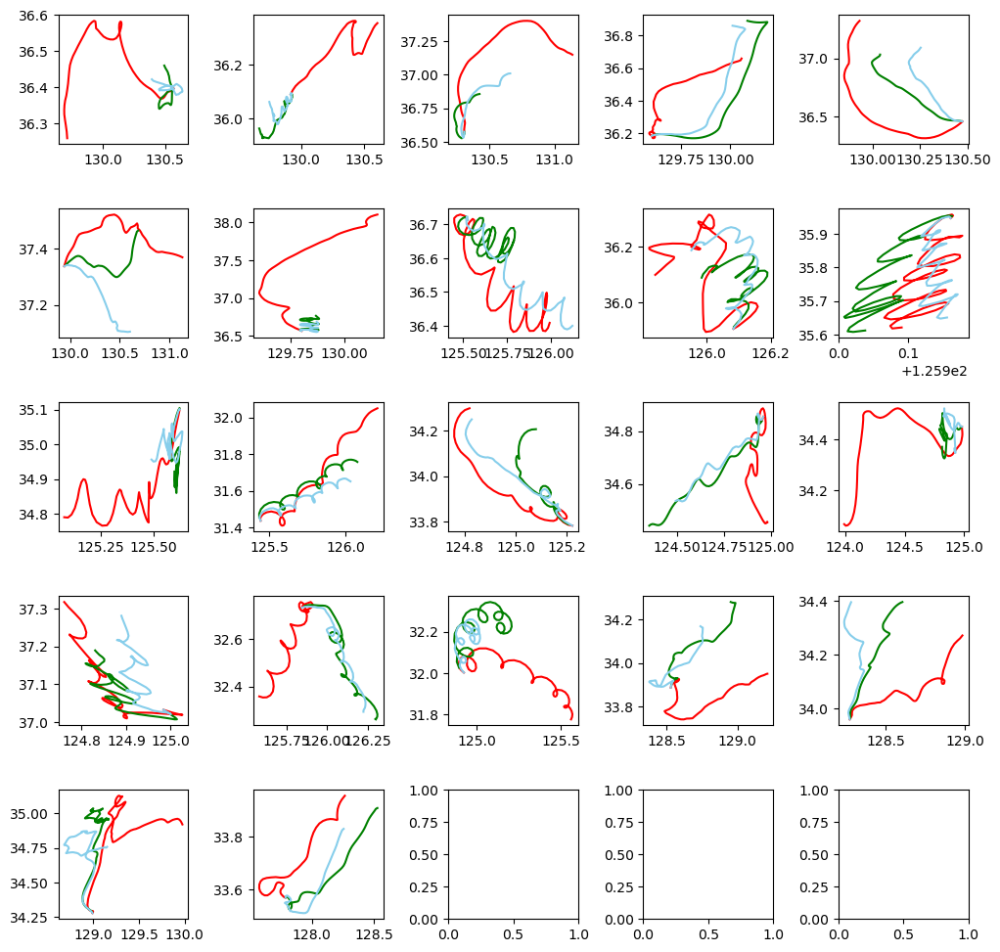

In [9]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]

    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    train_X, test_X = roburst_scaler(train_X, test_X)
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(RD_lon, SGD_lon,lightgb_lon,MLP_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(RD_lat, SGD_lat,lightgb_lat,MLP_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)
    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])

plt.show()

In [10]:
# stacking (meta RF depth=2)
mae_sum = 0
baseline_mae_sum = 0
NCLS_sum = 0
baseline_NCLS_sum = 0

for i in range(len(dataset)):
    mae_sum += MAE_list[i]
    baseline_mae_sum += baseline_MAE_list[i]
    NCLS_sum += NCLS_list[i]
    baseline_NCLS_sum += baseline_NCLS_list[i]

# 라이브러리 Mae    
print ('Model Mae : ', mae_sum/len(dataset) )
print ('Baseline Mae : ', baseline_mae_sum/len(dataset) )
print ('Model NCLS : ', NCLS_sum/len(dataset) )
print ('Baseline NCLS : ', baseline_NCLS_sum/len(dataset) )

Model Mae :  0.18252680538381105
Baseline Mae :  0.18057603746811715
Model NCLS :  0.5304365888548875
Baseline NCLS :  0.5326670971119444


In [ ]:
from tensorflow.keras.models import Model

class Autoencoder(Model):
    def __init__(self, latent_dim):
        super(Autoencoder, self).__init__()
        self.latent_dim = latent_dim   
        self.encoder = tf.keras.Sequential([
          Dense(units = latent_dim, input_dim = 6, activation='relu'),
        ])
        self.decoder = tf.keras.Sequential([
          Dense(6, activation='sigmoid')
        ])

    def call(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [ ]:
# Random & SGD stacking (meta_regressor = RD depth 2)
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.activations import relu
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
import random

seed = 42
tf.keras.utils.set_random_seed(seed)
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

f, axes = plt.subplots(5, 5)
# 격자 크기 설정
f.set_size_inches((12, 12))
# 격자 여백 설정
plt.subplots_adjust(wspace = 0.5, hspace = 0.5)
baseline_MAE_list = list() 
baseline_NCLS_list = list()
MAE_list = list()
NCLS_list = list()
test_case_list = list()

for i in range(len(dataset)):
    # train dataset
    train_X = pd.DataFrame()
    train_y = np.array([[]])
    train = dataset[0:i] + dataset[i+1:len(dataset)]

    train_X = train[0][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    train_y = train[0][['diff_lon', 'diff_lat']]
    # 첫 행은 훈련에서 제외
    train_X = train_X[1:]
    train_y = train_y[1:].to_numpy()
    
    for j in range(1,len(train)):
        trina_xi = train[j][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = train[j][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
        
    # 과거 데이터 훈련데이터에 추가
    for k in range(len(only_train_dataset)):
        trina_xi = only_train_dataset[k][['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']] 
        trina_yi = only_train_dataset[k][['diff_lon', 'diff_lat']]
        trina_xi = trina_xi[1:]
        trina_yi = trina_yi[1:].to_numpy()
        
        train_X = pd.concat([train_X,trina_xi],ignore_index = True)
        train_y = np.concatenate((train_y,trina_yi), axis = 0)
    
    # Test dataset
    test = dataset[i]
    start_lon = dataset[i]['start_lon'][0]
    start_lat = dataset[i]['start_lat'][0]
    test_X = test[['wind_x', 'water_velocity_x', 'wind_y', 'water_velocity_y']]
    test_X = test_X[1:]
    test_y = test[['diff_lon', 'diff_lat']]
    test_y = test_y[1:].to_numpy()
    
    latent_dim = 5
    AE_X = AE_X.to_numpy()
    autoencoder = Autoencoder(latent_dim)
    autoencoder.compile(optimizer='adam', loss='mse')
    autoencoder.fit(AE_X,AE_X,
                    epochs=100,
                    shuffle=True)
    encoded = autoencoder.encoder(AE_X).numpy()
    decoded = autoencoder.decoder(encoded).numpy()
    add_X = decoded[:,[0,1,2,3]]
    add_y = decoded[:,[4,5]]
    
    train_X = np.concatenate((train_X.to_numpy(),add_X), axis = 0)
    train_y = np.concatenate((train_y,add_y), axis = 0)
    # 행단위로 살펴보기
    test_case_df = dataset[i][['time', 'obs_x1_lon', 'obs_x1_lat', 'wind_y','wind_x','water_velocity_y','water_velocity_x','model_x2_lon', 'model_x2_lat']]
    test_case_df['rf_lon'] = start_lon
    test_case_df['rf_lat'] = start_lat
    test_case_df['ncls_model'] = 0
    test_case_df['ncls_rf'] = 0
    
    train_X, test_X = roburst_scaler(train_X, test_X)
    
    # RF, SGD 모델 생성
    RD_lon = RandomForestRegressor(max_depth = 2, random_state = 42 )
    RD_lat = RandomForestRegressor(max_depth = 2, random_state = 42 )
    SGD_lon = SGDRegressor(penalty='l1', random_state=42)
    SGD_lat = SGDRegressor(penalty='l1', random_state=42)
    lightgb_lon = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    lightgb_lat = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.009, n_estimators=270,max_depth=4)
    MLP_lon = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    MLP_lat = KerasRegressor(build_fn=create_model, epochs=40, batch_size=20, verbose=1)
    
    
    # stacking
    stack_lon = StackingCVRegressor(regressors=(RD_lon, SGD_lon,lightgb_lon,MLP_lon), 
                                    meta_regressor=lightgb_lon,
                                   random_state = 42)
    
    stack_lat = StackingCVRegressor(regressors=(RD_lat, SGD_lat,lightgb_lat,MLP_lat),
                                    meta_regressor=lightgb_lat,
                                   random_state = 42)
    # fit
    stack_lon.fit(train_X, train_y[:,0])
    stack_lat.fit(train_X, train_y[:,1])
    
    # predict
    y_pred_lon = stack_lon.predict(test_X)
    y_pred_lon = y_pred_lon.reshape((y_pred_lon.shape[0],1))
    y_pred_lat = stack_lat.predict(test_X)
    y_pred_lat = y_pred_lat.reshape((y_pred_lat.shape[0],1))
    y_pred = np.concatenate((y_pred_lon, y_pred_lat),axis=1)
    
    # case 별로 이상행 탐색
    for k in range(1,len(test_case_df)-1):
        test_case_df['rf_lon'][k] = test_case_df['rf_lon'][k-1] + y_pred[k][0]
        test_case_df['rf_lat'][k] = test_case_df['rf_lat'][k-1] + y_pred[k][1]
        test_case_df['ncls_model'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['model_x2_lon','model_x2_lat']][:k+1].to_numpy())
        test_case_df['ncls_rf'][k] = NCLS_score(test_case_df[['obs_x1_lon','obs_x1_lat']][:k+1].to_numpy(), test_case_df[['rf_lon','rf_lat']][:k+1].to_numpy())
    
    test_case_df['rf_diff_lon'] = test_case_df['rf_lon'].diff()
    test_case_df['rf_diff_lon'][0] = 0
    test_case_df['rf_diff_lat'] = test_case_df['rf_lat'].diff()  
    test_case_df['rf_diff_lat'][0] = 0
    test_case_df['model_diff_lon'] = test_case_df['model_x2_lon'].diff() 
    test_case_df['model_diff_lon'][0] = 0
    test_case_df['model_diff_lat'] = test_case_df['model_x2_lat'].diff()
    test_case_df['model_diff_lat'][0] = 0
    test_case_list.append(test_case_df)
    
    # Plot
    lon, lat, baseline_lon, baseline_lat, lon_pred, lat_pred = drift_trajection_show(i,y_pred)
    row = i//5
    col = i%5
    axes[row][col].plot(lon, lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')   
    
    # evaluation 
    y = np.concatenate((lon.reshape((lon.shape[0],1)), lat.reshape((lat.shape[0],1))),axis = 1)
    pred = np.concatenate((lon_pred.reshape((lon_pred.shape[0],1)), lat_pred.reshape((lat_pred.shape[0],1))),axis =1)
    baseline_pred = np.concatenate((baseline_lon.reshape((baseline_lon.shape[0],1)), baseline_lat.reshape((baseline_lat.shape[0],1))),axis =1)
    
    #mae
    MAE_list.append(drift_mae(y, pred))
    baseline_MAE_list.append(drift_mae(y, baseline_pred))
    
    #NCLS
    NCLS_list.append(NCLS_score(y, pred))
    baseline_NCLS_list.append(NCLS_score(y, baseline_pred))
    
for i in range(len(MAE_list)):
    print('------------------------ Model ', i+1, '------------------------')
    print('baseline',str(i),' MAE : ',MAE_list[i])
    print('Model',str(i),' MAE : ', baseline_MAE_list[i])
    print('baseline',str(i),' NCLS : ',baseline_NCLS_list[i])
    print('Model',str(i),' NCLS : ', NCLS_list[i])
# 4 55
plt.show()